# **IMPORTS:**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
warnings.filterwarnings("ignore", category=UserWarning)

In [ ]:
!pip install dalex -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.6.0-py3-none-any.whl size=1045995 sha256=f1554faec8f33dca316dcf7dbf6aeee84d1d1ae6ca6a372f7b737a21eb4a3f1a
  Stored in directory: /root/.cache/pip/wheels/c8/45/19/f5810bf7c5ff9a476ebd89bb5b81a18ffcdf93931d17dbb0c1
Successfully built dalex


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 3.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=e0ed55088d764b1c64370d39b30a0f8016b5421d4bfb1f9db64f1d2a074710f4
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
#imports necesarios
import pandas as pd
import numpy as np
from scipy.stats import ttest_rel
from sklearn.model_selection import train_test_split, cross_val_score, KFold, StratifiedKFold
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.inspection import permutation_importance
import statsmodels.api as sm
import dalex as dx
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from imblearn.ensemble import BalancedRandomForestClassifier, RUSBoostClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, roc_curve, roc_auc_score, RocCurveDisplay

# **Dataset preprocesado:**

In [ ]:
#carga del dataset

data=pd.read_csv("/content/drive/MyDrive/TFM/Merge/php_data.csv")
label=pd.read_csv("/content/drive/MyDrive/TFM/Merge/php_label.csv")

#file_path_data = r'D:\Descargas\merge conflict\php_data.csv'
#file_path_label = r'D:\Descargas\merge conflict\php_label.csv'
#data = pd.read_csv(file_path_data)
#label= pd.read_csv(file_path_label)

In [ ]:
pd.set_option('display.max_columns', None)

In [ ]:
data.head() #comprobar el dataframe

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median
0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,36.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,47.0,47.0,47.000000,47.0
1,43.0,690.0,-530.0,-565.0,0.0,-8495.0,0.0,-84466.0,-102948.0,-27.0,-96.0,-558.0,0.0,3.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,8.0,0.0,2.0,11.0,74.0,41.652174,35.0
2,0.0,6.0,0.0,0.0,0.0,-1.0,0.0,38.0,16.0,-2.0,10.0,-4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,21.0,121.0,66.500000,63.0
3,2.0,28.0,-8.0,0.0,0.0,-107.0,0.0,-1251.0,-156.0,-1.0,-287.0,-22.0,5.0,0.0,0.0,0.0,1.0,2.0,6.0,1.0,0.0,0.0,0.0,1.0,20.0,88.0,43.681818,43.0
4,0.0,1.0,7.0,0.0,0.0,12.0,0.0,223.0,30.0,1.0,-32.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,47.0,47.0,47.000000,47.0


In [ ]:
label.head()

,is_conflict
0,0
1,1
2,0
3,0
4,0


In [ ]:
#comprobar si existen valores null o ?
print("¿Existen valores nulos en los datos?:", data.isnull().values.any())
print("¿Existen valores  '?'  en los datos?:", (data == '?').values.any())
print("¿Existen valores nulos en las etiquetas?:", label.isnull().values.any())
print("¿Existen valores  '?'  en las etiquetas?:", (label == '?').values.any())

¿Existen valores nulos en los datos?: False
¿Existen valores  '?'  en los datos?: False
¿Existen valores nulos en las etiquetas?: False
¿Existen valores  '?'  en las etiquetas?: False


In [ ]:
print(data.shape)
print(label.shape)

#obtener lista de atributos sin la variable dependiente
feature_names=list(data)
print(feature_names)
print(list(label))

(50342, 28)
(50342, 1)
['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_renamed', 'file_modified', 'file_copied', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']
['is_conflict']


In [ ]:
# Calcular la frecuencia de cada clase
num_clases = label['is_conflict'].value_counts()
print(num_clases)

0    45605
1     4737
Name: is_conflict, dtype: int64


In [ ]:
# Combinamos los datos con las etiquetas en un solo df
df = pd.concat([data, label], axis=1)

In [ ]:
df.head()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,36.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,47.0,47.0,47.000000,47.0,0
1,43.0,690.0,-530.0,-565.0,0.0,-8495.0,0.0,-84466.0,-102948.0,-27.0,-96.0,-558.0,0.0,3.0,0.0,0.0,0.0,5.0,5.0,0.0,0.0,8.0,0.0,2.0,11.0,74.0,41.652174,35.0,1
2,0.0,6.0,0.0,0.0,0.0,-1.0,0.0,38.0,16.0,-2.0,10.0,-4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,21.0,121.0,66.500000,63.0,0
3,2.0,28.0,-8.0,0.0,0.0,-107.0,0.0,-1251.0,-156.0,-1.0,-287.0,-22.0,5.0,0.0,0.0,0.0,1.0,2.0,6.0,1.0,0.0,0.0,0.0,1.0,20.0,88.0,43.681818,43.0,0
4,0.0,1.0,7.0,0.0,0.0,12.0,0.0,223.0,30.0,1.0,-32.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,47.0,47.0,47.000000,47.0,0


In [ ]:
df.info() #comprobar el tipo de variables y su cantidad. Parece que no hay ninguna variable objeto

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50342 entries, 0 to 50341
Data columns (total 29 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   parallel_changed_file_num  50342 non-null  float64
 1   commit_num                 50342 non-null  float64
 2   file_added                 50342 non-null  float64
 3   file_removed               50342 non-null  float64
 4   file_renamed               50342 non-null  float64
 5   file_modified              50342 non-null  float64
 6   file_copied                50342 non-null  float64
 7   line_added                 50342 non-null  float64
 8   line_removed               50342 non-null  float64
 9   developer_num              50342 non-null  float64
 10  duration                   50342 non-null  float64
 11  commit_density             50342 non-null  float64
 12  add_frequency              50342 non-null  float64
 13  bug_frequency              50342 non-null  flo

In [ ]:
df.describe() #obtener algunas estadísitcas de cada atributo

,parallel_changed_file_num,commit_num,file_added,file_removed,file_renamed,file_modified,file_copied,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_mean,messages_median,is_conflict
count,50342.000000,50342.000000,50342.000000,50342.00000,50342.0,5.034200e+04,50342.0,5.034200e+04,5.034200e+04,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000
mean,2.016825,74.080489,-83.298081,-54.05403,0.0,-4.570765e+02,0.0,-2.768102e+04,-2.271053e+04,-3.455206,31.309662,-41.837233,1.288666,0.218803,0.328990,0.041874,0.107604,0.090640,1.567498,0.103790,0.092587,0.402725,0.638552,0.579139,28.810754,80.801061,49.098952,46.918885,0.094096
std,68.490587,559.268165,1787.709389,1103.74575,0.0,1.881648e+04,0.0,4.132131e+05,3.325109e+05,20.252560,1036.697401,610.086322,1.854381,0.670694,0.786844,0.266067,0.459351,0.510851,2.086955,0.415973,0.444926,0.890246,1.383534,1.125065,24.448233,55.430623,25.243743,25.007194,0.291966
min,0.000000,1.000000,-87102.000000,-69175.00000,0.0,-1.662546e+06,0.0,-1.659535e+07,-1.163194e+07,-727.000000,-62303.000000,-43537.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,-3.000000,0.00000,0.0,-4.000000e+01,0.0,-7.547500e+02,-3.200000e+02,-2.000000,-29.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,49.000000,37.000000,35.000000,0.000000
50%,0.000000,6.000000,0.000000,0.00000,0.0,0.000000e+00,0.0,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,69.000000,45.904762,45.000000,0.000000
75%,0.000000,27.000000,0.000000,0.00000,0.0,2.000000e+00,0.0,2.200000e+01,8.000000e+00,1.000000,10.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,37.000000,94.000000,55.428571,53.000000,0.000000
max,9793.000000,31906.000000,85771.000000,50124.00000,0.0,1.121206e+06,0.0,1.584223e+07,7.880851e+06,261.000000,31150.000000,34295.000000,36.000000,13.000000,13.000000,10.000000,16.000000,18.000000,24.000000,11.000000,13.000000,24.000000,33.000000,22.000000,400.000000,408.000000,400.000000,400.000000,1.000000


In [ ]:
# Parece que file_renamed y file_copied tienen el mismo valor siempre. Vamos a comprobarlo
val_renamed = df['file_renamed'].value_counts()
val_copied = df['file_copied'].value_counts()
print("Para file_renamed:\n", val_renamed)
print("Para file_copied:\n", val_copied)
columnas_constantes = df.columns[df.describe().loc['std'] == 0].tolist()
columnas_constantes

Para file_renamed:
 0.0    50342
Name: file_renamed, dtype: int64
Para file_copied:
 0.0    50342
Name: file_copied, dtype: int64


['file_renamed', 'file_copied']

In [ ]:
# Al ser caracteristicas constantes decido eliminarlas
df=df.drop('file_renamed', axis=1)
df=df.drop('file_copied', axis=1)

In [ ]:
# Actualizamos los nombres de las caracteristicas
feature_names=list(df)
feature_names.remove('is_conflict')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_mean', 'messages_median']


In [ ]:
correlation_matrix=df.corr()
print(correlation_matrix) #coeficientes de correlación

                           parallel_changed_file_num  commit_num  file_added  \
parallel_changed_file_num                   1.000000    0.101542    0.011168   
commit_num                                  0.101542    1.000000   -0.151304   
file_added                                  0.011168   -0.151304    1.000000   
file_removed                                0.010401   -0.152270    0.742871   
file_modified                               0.000488   -0.144485    0.681101   
line_added                                  0.001361   -0.626736    0.734233   
line_removed                               -0.000239   -0.673787    0.580535   
developer_num                              -0.004430   -0.464052    0.392818   
duration                                   -0.005627    0.024325   -0.056625   
commit_density                              0.000445   -0.001420   -0.000764   
add_frequency                              -0.002991    0.001038    0.000907   
bug_frequency                           

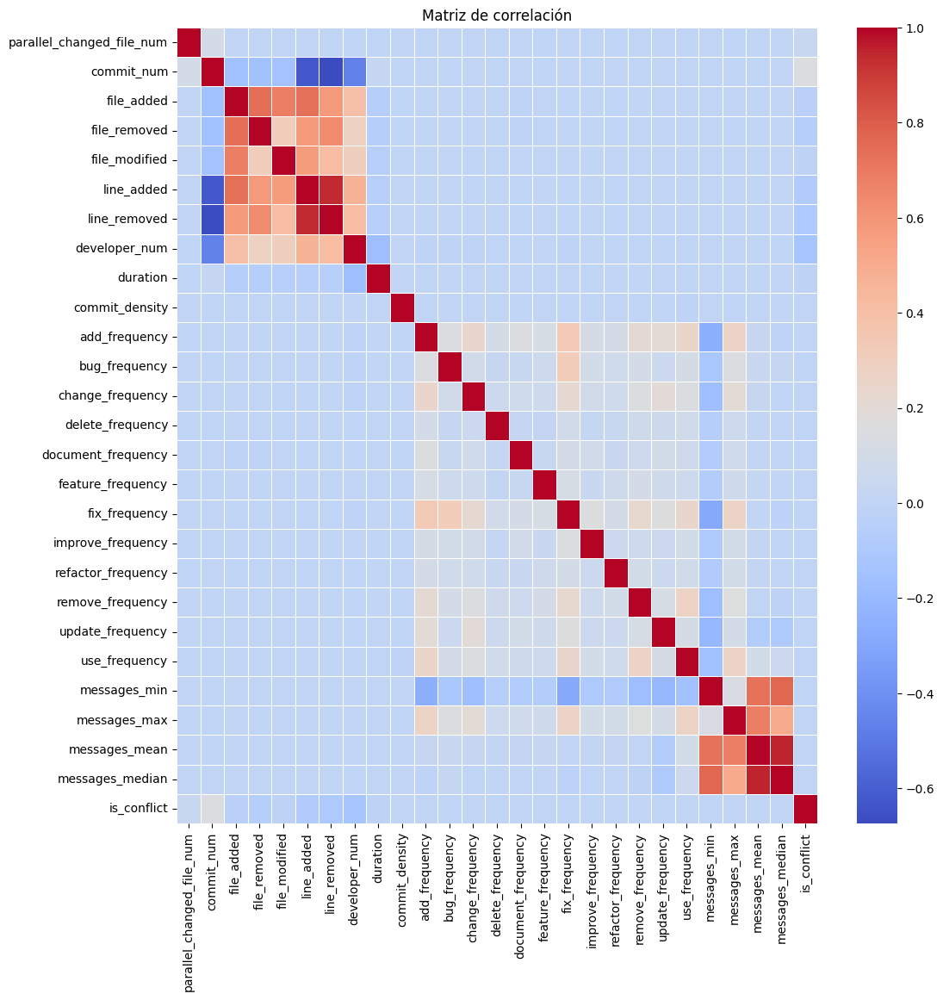

In [ ]:
plt.figure(figsize=(12, 12))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", annot_kws={"size": 7}, linewidths=0.5)
plt.title("Matriz de correlación")
plt.show()

In [ ]:
#Pares de atributos con correlación superior al umbral
high_correlation_pairs = []
atributos = []

#Recorre la matriz de correlación y verifica los valores
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.80:
            attribute_pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(attribute_pair)

# Imprime los pares de atributos con correlación superior a 0.89 y crear una lista de atributos sin repetir
for pair in high_correlation_pairs:
    print("Correlación alta entre: ", pair[0], "y", pair[1])
    atributos.extend(pair)

# Eliminar duplicados y mantener el orden
atributos = list(dict.fromkeys(atributos))

# Imprimir la lista de atributos
print("Lista de atributos con correlación alta: ", atributos)

Correlación alta entre:  line_added y line_removed
Correlación alta entre:  messages_mean y messages_median
Lista de atributos con correlación alta:  ['line_added', 'line_removed', 'messages_mean', 'messages_median']


**VALIDACIÓN CRUZADA PARA COMPROBAR EL EFECTO DE LOS PARÁMETROS:**

In [ ]:
# Defino los algoritmos base para evaluar
rf = RandomForestClassifier(random_state=42)
gb = GradientBoostingClassifier(random_state=42)
ada = AdaBoostClassifier(random_state=42)
brf = BalancedRandomForestClassifier(random_state=42)
rus = RUSBoostClassifier(random_state=42)
modelos=[rf, brf, gb, ada, rus]

In [ ]:
for i in atributos:
  print("\n##########################################################################################################")
  print("\nPARA EL ATRIBUTO: ", i)

  # Preparando los datos
  X=df[feature_names]
  Y=df['is_conflict']

  x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)
  x_train_sin=x_train.drop(i, axis=1)

  for j in modelos:
    # Realizar validación cruzada con y sin el atributo con alta correlación:
    # Con el atributo
    cv_scores_con = cross_val_score(j, x_train, y_train, cv=10, scoring='accuracy')

    # Sin el atributo
    cv_scores_sin = cross_val_score(j, x_train_sin, y_train, cv=10, scoring='accuracy')

    # Calcular el estadístico t y el p-valor
    t_statistic, p_value = ttest_rel(cv_scores_con, cv_scores_sin)

    # Mostrar los resultados
    print("-------------------------------------------------------------------------------------------------------------")
    print("El modelo: ", j)
    print("Valor de validación cruzada (con atributo):", cv_scores_con)
    print("Valor de validación cruzada (sin atributo):", cv_scores_sin)
    print("Valor medio con atributo es: ", np.mean(cv_scores_con), "\nEl valor medio sin atributo es: ", np.mean(cv_scores_sin))
    if np.mean(cv_scores_con) > np.mean(cv_scores_sin):
      print("El atributo mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))
    else:
      print("El atributo no mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))

    print("Estadístico t:", t_statistic)
    print("p-valor:", p_value)


##########################################################################################################

PARA EL ATRIBUTO:  line_added
-------------------------------------------------------------------------------------------------------------
El modelo:  RandomForestClassifier()
Valor de validación cruzada (con atributo): [0.93728717 0.93757094 0.93643587 0.93444949 0.93813848 0.93359818
 0.93530079 0.94040863 0.93331442 0.93357934]
Valor de validación cruzada (sin atributo): [0.94182747 0.93728717 0.93501703 0.93501703 0.93501703 0.92990919
 0.9316118  0.94012486 0.93104427 0.93386318]
Valor medio con atributo es:  0.9360083308551588 
El valor medio sin atributo es:  0.9350719030415661
El atributo mejora el desempeño del modelo, con una diferencia de:  0.0009364278135927107
Estadístico t: 1.1814931756549292
p-valor: 0.26768438674050593
-------------------------------------------------------------------------------------------------------------
El modelo:  DecisionTreeClassifier(

In [ ]:
# Elimina los atributos con demasiada correlación y menor relevancia que su par
feature_names.remove('messages_mean')
print(feature_names)

['parallel_changed_file_num', 'commit_num', 'file_added', 'file_removed', 'file_modified', 'line_added', 'line_removed', 'developer_num', 'duration', 'commit_density', 'add_frequency', 'bug_frequency', 'change_frequency', 'delete_frequency', 'document_frequency', 'feature_frequency', 'fix_frequency', 'improve_frequency', 'refactor_frequency', 'remove_frequency', 'update_frequency', 'use_frequency', 'messages_min', 'messages_max', 'messages_median']


In [ ]:
from google.colab.data_table import DataTable
DataTable.max_columns = 30

df_display=df.drop("messages_mean", axis=1)
df_display.describe()

,parallel_changed_file_num,commit_num,file_added,file_removed,file_modified,line_added,line_removed,developer_num,duration,commit_density,add_frequency,bug_frequency,change_frequency,delete_frequency,document_frequency,feature_frequency,fix_frequency,improve_frequency,refactor_frequency,remove_frequency,update_frequency,use_frequency,messages_min,messages_max,messages_median,is_conflict
count,50342.000000,50342.000000,50342.000000,50342.00000,5.034200e+04,5.034200e+04,5.034200e+04,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000,50342.000000
mean,2.016825,74.080489,-83.298081,-54.05403,-4.570765e+02,-2.768102e+04,-2.271053e+04,-3.455206,31.309662,-41.837233,1.288666,0.218803,0.328990,0.041874,0.107604,0.090640,1.567498,0.103790,0.092587,0.402725,0.638552,0.579139,28.810754,80.801061,46.918885,0.094096
std,68.490587,559.268165,1787.709389,1103.74575,1.881648e+04,4.132131e+05,3.325109e+05,20.252560,1036.697401,610.086322,1.854381,0.670694,0.786844,0.266067,0.459351,0.510851,2.086955,0.415973,0.444926,0.890246,1.383534,1.125065,24.448233,55.430623,25.007194,0.291966
min,0.000000,1.000000,-87102.000000,-69175.00000,-1.662546e+06,-1.659535e+07,-1.163194e+07,-727.000000,-62303.000000,-43537.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,2.000000,-3.000000,0.00000,-4.000000e+01,-7.547500e+02,-3.200000e+02,-2.000000,-29.000000,-8.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,15.000000,49.000000,35.000000,0.000000
50%,0.000000,6.000000,0.000000,0.00000,0.000000e+00,1.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.000000,69.000000,45.000000,0.000000
75%,0.000000,27.000000,0.000000,0.00000,2.000000e+00,2.200000e+01,8.000000e+00,1.000000,10.000000,1.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,0.000000,1.000000,1.000000,1.000000,37.000000,94.000000,53.000000,0.000000
max,9793.000000,31906.000000,85771.000000,50124.00000,1.121206e+06,1.584223e+07,7.880851e+06,261.000000,31150.000000,34295.000000,36.000000,13.000000,13.000000,10.000000,16.000000,18.000000,24.000000,11.000000,13.000000,24.000000,33.000000,22.000000,400.000000,408.000000,400.000000,1.000000


In [ ]:
# Tomar los valores de la variable dependiente (y) y las independientes (x)
X=df[feature_names]
Y=df['is_conflict']

In [ ]:
#dividir en conjunto de entrenamiento y test 70%-30%
x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42, stratify=Y)

In [ ]:
# Comprobar la division de clases
num_train=pd.Series(y_train).value_counts()
num_test=pd.Series(y_test).value_counts()
porc_train=pd.Series(y_train).value_counts(normalize=True)
porc_test=pd.Series(y_test).value_counts(normalize=True)
comparacion = pd.DataFrame({'% Train': porc_train, 'Num Train': num_train, '% Test': porc_test,'Num Test': num_test})
print(comparacion)

   % Train  Num Train    % Test  Num Test
0   0.9059      31923  0.905913     13682
1   0.0941       3316  0.094087      1421


# **Algoritmos:**

### **RandomForest:**

In [ ]:
modelo=RandomForestClassifier(random_state=42, class_weight='balanced')
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 320 candidates, totalling 3200 fits


GridSearchCV(cv=10, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': [5, 10, 20, 25],
                         'min_samples_split': [2, 5, 10, 20],
                         'n_estimators': [25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'max_depth': 10, 'min_samples_leaf': 5, 'min_samples_split': 20, 'n_estimators': 50}
RandomForestClassifier(max_depth=10, min_samples_leaf=5, min_samples_split=20,
                       n_estimators=50, random_state=42)
0.6335109286444249


In [ ]:
rf = RandomForestClassifier(class_weight='balanced', max_depth=10, min_samples_leaf=5, min_samples_split=20, n_estimators=75, random_state=42)

In [ ]:
modelo_rf=rf.fit(x_train,y_train)

In [ ]:
y_pred_rf = modelo_rf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rf.squeeze()})
print(df_pred)

       Actual  Predicted
13844       1          1
16759       0          0
32662       1          1
5256        0          0
26131       0          0
...       ...        ...
5553        0          0
37262       0          1
25904       0          0
30223       0          0
32464       0          0

[15103 rows x 2 columns]


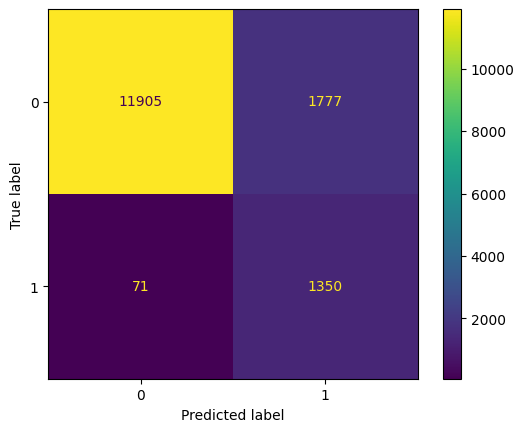

In [ ]:
# Matriz de confusion
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_display = ConfusionMatrixDisplay(cm_rf).plot()

In [ ]:
# Calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rf)
recall = recall_score(y_test, y_pred_rf)
precision = precision_score(y_test, y_pred_rf)
f1 = f1_score(y_test, y_pred_rf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.8776402039329935
Recall: 0.9500351864883885
Precision: 0.4317236968340262
F1-score: 0.5936675461741424


In [ ]:
modelo_rf.score(x_test, y_test)

0.8776402039329935

In [ ]:
modelo_rf.score(x_train, y_train)

0.8860353585516048

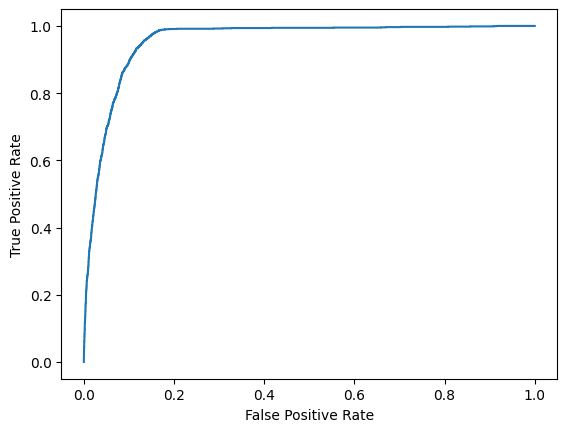

In [ ]:
# AUROC
y_score = modelo_rf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9556114810924444

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rf_inv = 1 - y_pred_rf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
13844,1,1
16759,0,0
32662,1,1
5256,0,0
26131,0,0
6828,0,0
11261,0,0
41818,0,0
21816,0,0
8624,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,0,0
1,1,1
2,0,0
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rf_inv)
recall_inv = recall_score(y_test_inv, y_pred_rf_inv)
precision_inv = precision_score(y_test_inv, y_pred_rf_inv)
f1_inv = f1_score(y_test_inv, y_pred_rf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.8776402039329935
Recall: 0.8701213272913316
Precision: 0.9940714762859052
F1-score: 0.9279756800997739


In [ ]:
score_inv_result={"Modelo":["RandomForest"],"Accuracy":[accuracy_inv], "Precision":[precision_inv], "Recall":[recall_inv], "F1-score":[f1_inv]}
score_inv_result=pd.DataFrame(score_inv_result)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rf= RandomForestClassifier(class_weight='balanced', max_depth=30, min_samples_leaf=5, random_state=42)
    cv_rf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9265
CV Precision: 0.4903
CV Recall: 0.7441
CV F1-Score: 0.5908


In [ ]:
cv_results = cross_validate(rf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.87984111 0.8714995  0.8780294  0.8768375  0.8772348  0.87862535
 0.88041319 0.88279698 0.87504966 0.87783075] 
 Con una media de:  0.8778158255737845
Precision:
 [0.43695861 0.42042318 0.43355325 0.42979943 0.43153919 0.43494777
 0.43846154 0.44390716 0.4269557  0.43240652] 
 Con una media de:  0.4328952348859623
Recall:
 [0.95780591 0.96413502 0.97251586 0.95137421 0.96617336 0.96624473
 0.96202532 0.96835443 0.9556962  0.95147679] 
 Con una media de:  0.9615801821571619
F1-score:
 [0.60013219 0.5855221  0.59973924 0.59210526 0.59660574 0.59986902
 0.60237781 0.60875332 0.59022801 0.59459459] 
 Con una media de:  0.596992729465169


In [ ]:
score_result={"Modelo":["RandomForest"],"Accuracy":[np.mean(cv_results['test_accuracy'])], "Precision":[np.mean(cv_results['test_precision'])], "Recall":[np.mean(cv_results['test_recall'])], "F1-score":[np.mean(cv_results['test_f1'])]}
score_result=pd.DataFrame(score_result)

### **BalancedRandomForest:**

In [ ]:
modelo=BalancedRandomForestClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30], 'class_weight':[None,'balanced']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 288 candidates, totalling 2880 fits


In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'class_weight': None, 'max_depth': 15, 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 75}
BalancedRandomForestClassifier(max_depth=15, min_samples_split=3,
                               n_estimators=75, random_state=42)
0.5722402775922953


In [ ]:
brf = BalancedRandomForestClassifier(max_depth=15, min_samples_split=3, n_estimators=75, random_state=42)

In [ ]:
modelo_brf=brf.fit(x_train,y_train)

In [ ]:
y_pred_brf = modelo_brf.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_brf.squeeze()})
print(df_pred)

       Actual  Predicted
13844       1          1
16759       0          0
32662       1          1
5256        0          0
26131       0          0
...       ...        ...
5553        0          0
37262       0          1
25904       0          0
30223       0          0
32464       0          0

[15103 rows x 2 columns]


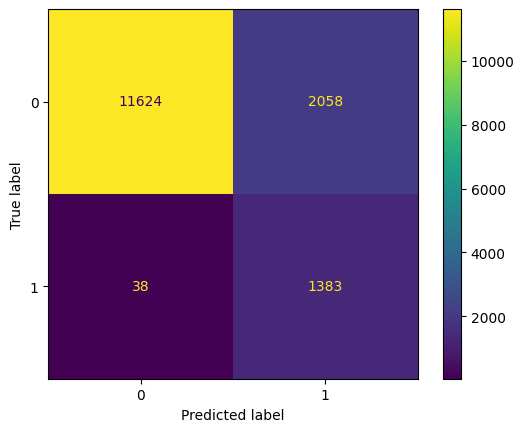

In [ ]:
# Matriz de confusion
cm_brf = confusion_matrix(y_test, y_pred_brf)
cm_display = ConfusionMatrixDisplay(cm_brf).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_brf)
recall = recall_score(y_test, y_pred_brf)
precision = precision_score(y_test, y_pred_brf)
f1 = f1_score(y_test, y_pred_brf)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.8612196252400185
Recall: 0.9732582688247713
Precision: 0.4019180470793374
F1-score: 0.5689016865487454


In [ ]:
modelo_brf.score(x_test, y_test)

0.8612196252400185

In [ ]:
modelo_brf.score(x_train, y_train)

0.8693776781406964

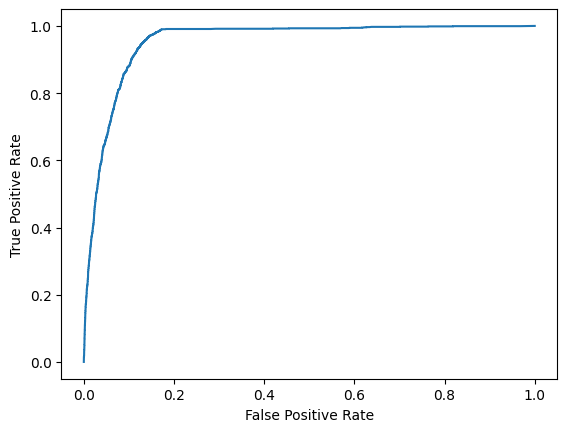

In [ ]:
# AUROC
y_score = modelo_brf.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_brf.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9535742549090063

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_brf_inv = 1 - y_pred_brf
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_brf_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
13844,1,1
16759,0,0
32662,1,1
5256,0,0
26131,0,0
6828,0,0
11261,0,0
41818,0,0
21816,0,0
8624,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,0,0
1,1,1
2,0,0
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_brf_inv)
recall_inv = recall_score(y_test_inv, y_pred_brf_inv)
precision_inv = precision_score(y_test_inv, y_pred_brf_inv)
f1_inv = f1_score(y_test_inv, y_pred_brf_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.8612196252400185
Recall: 0.8495833942406081
Precision: 0.9967415537643629
F1-score: 0.9172979797979799


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"BalancedRF","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_brf= BalancedRandomForestClassifier(class_weight='balanced', n_estimators=10,random_state=42)
    cv_brf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_brf.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.8641
CV Precision: 0.3363
CV Recall: 0.9286
CV F1-Score: 0.4937


In [ ]:
cv_results = cross_validate(brf, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.86315789 0.85779543 0.86372666 0.86372666 0.86134287 0.86869289
 0.87048073 0.86710369 0.86273341 0.86412396] 
 Con una media de:  0.8642884196796441
Precision:
 [0.40511915 0.39568966 0.40666082 0.40633245 0.40208877 0.41599281
 0.41981982 0.41333333 0.40507437 0.40757042] 
 Con una media de:  0.40776816119868087
Recall:
 [0.96835443 0.96835443 0.98097252 0.97674419 0.97674419 0.97679325
 0.98312236 0.98101266 0.97679325 0.97679325] 
 Con una media de:  0.9765684516641244
F1-score:
 [0.57125078 0.56181151 0.57496902 0.57391304 0.56966708 0.58349086
 0.58838384 0.58161351 0.57266543 0.57515528] 
 Con una media de:  0.5752920344982714


In [ ]:
score_result=score_result.append({"Modelo":"BalancedRF","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **GradientBoosting:**

In [ ]:
modelo=GradientBoostingClassifier(random_state=42)
params={'n_estimators':[10,25,50,75,100,200],'min_samples_split':[2,3,5,10,20],'min_samples_leaf':[1,3,5,10,20],'max_depth':[1,3,5,10,20,30]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 320 candidates, totalling 3200 fits


GridSearchCV(cv=10, estimator=GradientBoostingClassifier(random_state=42),
             param_grid={'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': [5, 10, 20, 25],
                         'min_samples_split': [2, 5, 10, 20],
                         'n_estimators': [25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'max_depth': 5, 'min_samples_leaf': 25, 'min_samples_split': 2, 'n_estimators': 100}
GradientBoostingClassifier(max_depth=5, min_samples_leaf=25, random_state=42)
0.6668735598523333


In [ ]:
gb =GradientBoostingClassifier(max_depth=10, min_samples_leaf=20, n_estimators=100, random_state=42)

In [ ]:
modelo_gb=gb.fit(x_train,y_train)

In [ ]:
y_pred_gb = modelo_gb.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_gb.squeeze()})
print(df_pred)

       Actual  Predicted
13844       1          1
16759       0          0
32662       1          0
5256        0          0
26131       0          0
...       ...        ...
5553        0          0
37262       0          0
25904       0          0
30223       0          0
32464       0          0

[15103 rows x 2 columns]


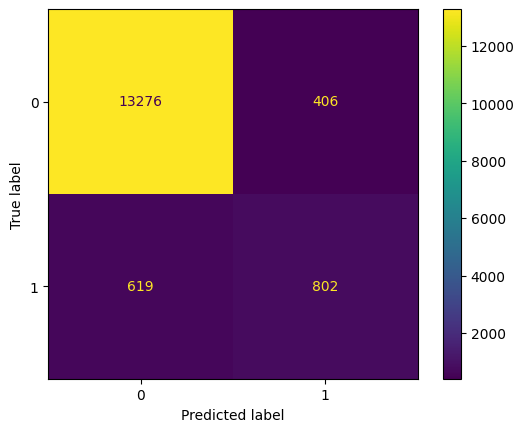

In [ ]:
# Matriz de confusion
cm_gb = confusion_matrix(y_test, y_pred_gb)
cm_display = ConfusionMatrixDisplay(cm_gb).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_gb)
recall = recall_score(y_test, y_pred_gb)
precision = precision_score(y_test, y_pred_gb)
f1 = f1_score(y_test, y_pred_gb)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.932132688869761
Recall: 0.5643912737508796
Precision: 0.6639072847682119
F1-score: 0.610117915557246


In [ ]:
modelo_gb.score(x_test, y_test)

0.932132688869761

In [ ]:
modelo_gb.score(x_train, y_train)

0.9832571866398024

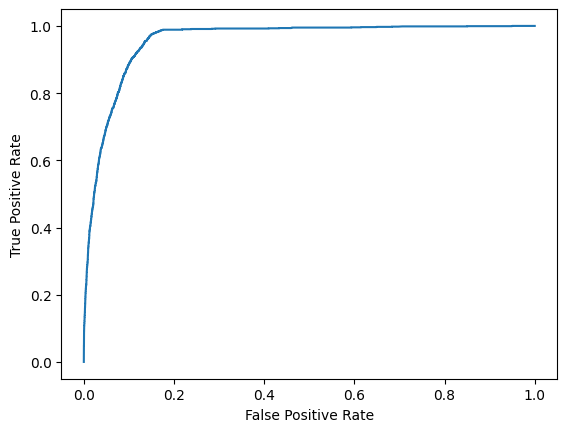

In [ ]:
# AUROC
y_score = modelo_gb.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_gb.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9565161405735445

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_gb_inv = 1 - y_pred_gb
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_gb_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
13844,1,1
16759,0,0
32662,1,0
5256,0,0
26131,0,0
6828,0,0
11261,0,0
41818,0,0
21816,0,0
8624,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,0,0
1,1,1
2,0,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_gb_inv)
recall_inv = recall_score(y_test_inv, y_pred_gb_inv)
precision_inv = precision_score(y_test_inv, y_pred_gb_inv)
f1_inv = f1_score(y_test_inv, y_pred_gb_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.932132688869761
Recall: 0.9703259757345417
Precision: 0.95545160129543
F1-score: 0.9628313449613808


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"GradientBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_gb= GradientBoostingClassifier(max_depth=10, min_samples_leaf=10, n_estimators=200, random_state=42)
    cv_gb.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_gb.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9429
CV Precision: 0.6400
CV Recall: 0.4569
CV F1-Score: 0.5327


In [ ]:
cv_results = cross_validate(gb, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.93565045 0.93028798 0.93444577 0.93067143 0.9398093  0.93524037
 0.93365117 0.93623361 0.93007549 0.93285658] 
 Con una media de:  0.9338922141749905
Precision:
 [0.68472906 0.65036675 0.68101266 0.65897436 0.71356784 0.685
 0.69553073 0.69465649 0.6495098  0.67708333] 
 Con una media de:  0.6790431020665357
Recall:
 [0.58649789 0.56118143 0.56871036 0.54334038 0.60042283 0.57805907
 0.52531646 0.57594937 0.55907173 0.54852321] 
 Con una media de:  0.5647072729056832
F1-score:
 [0.63181818 0.60249151 0.61981567 0.59559676 0.652124   0.62700229
 0.59855769 0.62975779 0.60090703 0.60606061] 
 Con una media de:  0.6164131508804749


In [ ]:
score_result=score_result.append({"Modelo":"GradientBoosting","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **AdaBoosting:**

In [ ]:
modelo=AdaBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200],'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0], 'algorithm':['SAMME','SAMME.R']}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

In [ ]:
ada=AdaBoostClassifier(learning_rate=1.0, n_estimators=25, random_state=42)

In [ ]:
modelo_ada=ada.fit(x_train,y_train)

In [ ]:
y_pred_ada = modelo_ada.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_ada.squeeze()})
print(df_pred)

       Actual  Predicted
13844       1          1
16759       0          0
32662       1          0
5256        0          0
26131       0          0
...       ...        ...
5553        0          0
37262       0          0
25904       0          0
30223       0          0
32464       0          0

[15103 rows x 2 columns]


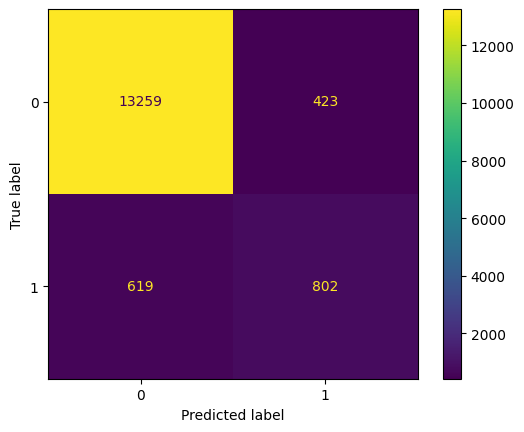

In [ ]:
# Matriz de confusion
cm_ada = confusion_matrix(y_test, y_pred_ada)
cm_display = ConfusionMatrixDisplay(cm_ada).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_ada)
recall = recall_score(y_test, y_pred_ada)
precision = precision_score(y_test, y_pred_ada)
f1 = f1_score(y_test, y_pred_ada)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.9310070846851619
Recall: 0.5643912737508796
Precision: 0.6546938775510204
F1-score: 0.6061980347694633


In [ ]:
modelo_ada.score(x_test, y_test)

0.9310070846851619

In [ ]:
modelo_ada.score(x_train, y_train)

0.9348165384942819

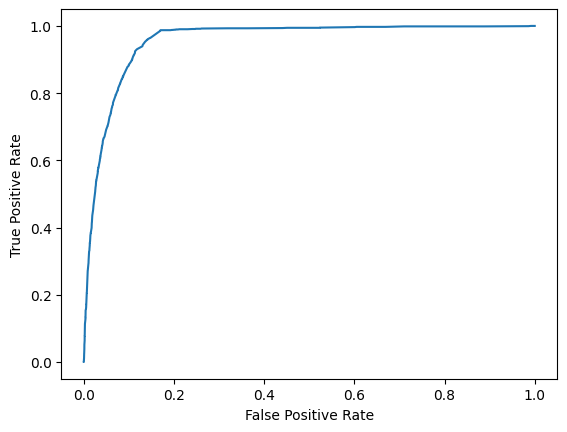

In [ ]:
# AUROC
y_score = modelo_ada.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_ada.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9557938943084505

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_ada_inv = 1 - y_pred_ada
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_ada_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
13844,1,1
16759,0,0
32662,1,0
5256,0,0
26131,0,0
6828,0,0
11261,0,0
41818,0,0
21816,0,0
8624,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,0,0
1,1,1
2,0,1
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_ada_inv)
recall_inv = recall_score(y_test_inv, y_pred_ada_inv)
precision_inv = precision_score(y_test_inv, y_pred_ada_inv)
f1_inv = f1_score(y_test_inv, y_pred_ada_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.9310070846851619
Recall: 0.9690834673293378
Precision: 0.9553970312725176
F1-score: 0.9621915820029028


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"AdaBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_ada= AdaBoostClassifier(learning_rate=1.2, n_estimators=200, random_state=42)
    cv_ada.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_ada.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.9397
CV Precision: 0.6172
CV Recall: 0.4062
CV F1-Score: 0.4895


In [ ]:
cv_results = cross_validate(ada, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.93545184 0.93286991 0.93404847 0.92967819 0.9386174  0.92888359
 0.93424712 0.93226063 0.92928089 0.93484307] 
 Con una media de:  0.9330181104142279
Precision:
 [0.68215159 0.66585366 0.69105691 0.65063291 0.71243523 0.63875598
 0.68865435 0.65795724 0.64460784 0.69109948] 
 Con una media de:  0.6723205201556648
Recall:
 [0.58860759 0.57594937 0.53911205 0.54334038 0.58139535 0.56329114
 0.55063291 0.58438819 0.55485232 0.55696203] 
 Con una media de:  0.5638531324430648
F1-score:
 [0.63193658 0.61764706 0.60570071 0.5921659  0.64027939 0.59865471
 0.6119578  0.61899441 0.59637188 0.61682243] 
 Con una media de:  0.613053087445128


In [ ]:
score_result=score_result.append({"Modelo":"AdaBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

### **RUSBoost:**

In [ ]:
modelo=RUSBoostClassifier(random_state=42)
params={'n_estimators':[5,10,25,50,75,100,200], 'learning_rate':[0.2,0.4,0.6,0.8,1.0,1.2,1.4,1.6,1.8,2.0,3.0,5.0], 'algorithm':['SAMME','SAMME.R'],'replacement':[False, True]}
grid=GridSearchCV(modelo,params,cv=10,scoring='f1',verbose=1)
grid.fit(x_train,y_train)

Fitting 10 folds for each of 50 candidates, totalling 500 fits


GridSearchCV(cv=10, estimator=RUSBoostClassifier(random_state=42),
             param_grid={'learning_rate': [0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4,
                                           1.6, 1.8, 2.0],
                         'n_estimators': [25, 50, 75, 100, 200]},
             scoring='f1', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'learning_rate': 1.6, 'n_estimators': 25}
RUSBoostClassifier(learning_rate=1.6, n_estimators=25, random_state=42)
0.6066850514740845


In [ ]:
rus =RUSBoostClassifier(learning_rate=1.6, n_estimators=25, random_state=42)

In [ ]:
modelo_rus=rus.fit(x_train,y_train)

In [ ]:
y_pred_rus = modelo_rus.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred_rus.squeeze()})
print(df_pred)

       Actual  Predicted
13844       1          1
16759       0          0
32662       1          1
5256        0          0
26131       0          0
...       ...        ...
5553        0          0
37262       0          1
25904       0          0
30223       0          0
32464       0          0

[15103 rows x 2 columns]


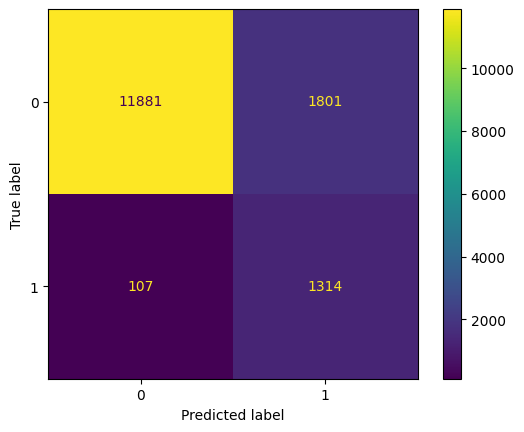

In [ ]:
# Matriz de confusion
cm_rus = confusion_matrix(y_test, y_pred_rus)
cm_display = ConfusionMatrixDisplay(cm_rus).plot()

In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
accuracy = accuracy_score(y_test, y_pred_rus)
recall = recall_score(y_test, y_pred_rus)
precision = precision_score(y_test, y_pred_rus)
f1 = f1_score(y_test, y_pred_rus)
print("Accuracy:", accuracy)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1)

Accuracy: 0.8736674832814673
Recall: 0.9247009148486981
Precision: 0.42182985553772073
F1-score: 0.5793650793650794


In [ ]:
modelo_rus.score(x_test, y_test)

0.8736674832814673

In [ ]:
modelo_rus.score(x_train, y_train)

0.8761599364340645

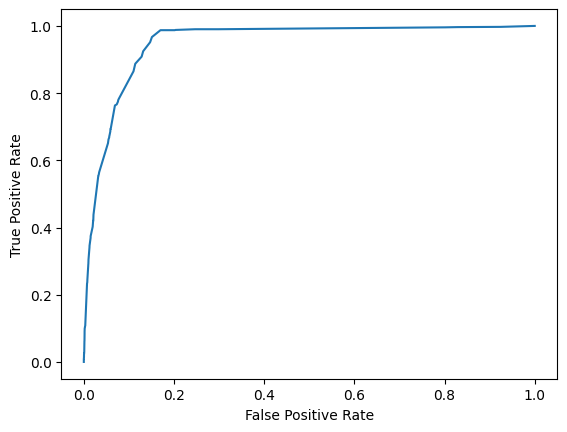

In [ ]:
# AUROC
y_score = modelo_rus.predict_proba(x_test)[:,1]
fpr, tpr, _ = roc_curve(y_test, y_score, pos_label=modelo_rus.classes_[1])
roc_display = RocCurveDisplay(fpr=fpr, tpr=tpr).plot()

In [ ]:
auc=roc_auc_score(y_test, y_score)
auc

0.9490872961295068

**CLASES INVERTIDAS**

In [ ]:
y_test_inv = y_test.values
y_test_inv = 1 - y_test_inv
y_test_inv = pd.Series(y_test_inv)
y_pred_rus_inv = 1 - y_pred_rus
df_pred_inv = pd.DataFrame({'Actual': y_test_inv.squeeze(), 'Predicted': y_pred_rus_inv.squeeze()})

In [ ]:
df_pred.head(20)

,Actual,Predicted
13844,1,1
16759,0,0
32662,1,1
5256,0,0
26131,0,0
6828,0,0
11261,0,0
41818,0,0
21816,0,0
8624,0,0


In [ ]:
df_pred_inv.head(20)

,Actual,Predicted
0,0,0
1,1,1
2,0,0
3,1,1
4,1,1
5,1,1
6,1,1
7,1,1
8,1,1
9,1,1


In [ ]:
# Calcular métricas al invertir las clases
accuracy_inv = accuracy_score(y_test_inv, y_pred_rus_inv)
recall_inv = recall_score(y_test_inv, y_pred_rus_inv)
precision_inv = precision_score(y_test_inv, y_pred_rus_inv)
f1_inv = f1_score(y_test_inv, y_pred_rus_inv)
print("Accuracy:", accuracy_inv)
print("Recall:", recall_inv)
print("Precision:", precision_inv)
print("F1-score:", f1_inv)

Accuracy: 0.8736674832814673
Recall: 0.8683671977781026
Precision: 0.9910744077410744
F1-score: 0.9256719906505648


In [ ]:
score_inv_result=score_inv_result.append({"Modelo":"RUSBoost","Accuracy":accuracy_inv, "Precision":precision_inv, "Recall":recall_inv, "F1-score":f1_inv}, ignore_index=True)

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 10

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura
acc_sc = []
prec_sc = []
rcll_sc = []
f1_sc = []

# Crear los objetos KFold
skf = StratifiedKFold(n_splits=n_folds)

for train_index, test_index in skf.split(X, Y):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    Y_train, Y_test = Y.iloc[train_index], Y.iloc[test_index]

    # Entrenar el modelo
    cv_rus= RUSBoostClassifier(learning_rate=1.6, n_estimators=10, random_state=42)
    cv_rus.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rus.predict(X_test)

    # Calcular las métricas
    accuracy = accuracy_score(Y_test, Y_pred)
    recall = recall_score(Y_test, Y_pred)
    precision = precision_score(Y_test, Y_pred)
    f1 = f1_score(Y_test, Y_pred)

    # Agregar las puntuaciones a las listas
    acc_sc.append(accuracy)
    prec_sc.append(precision)
    rcll_sc.append(recall)
    f1_sc.append(f1)

# Calcular la media de las puntuaciones
mean_acc = np.mean(acc_sc)
mean_prec = np.mean(prec_sc)
mean_rcll = np.mean(rcll_sc)
mean_f1 = np.mean(f1_sc)

print(f'CV Accuracy: {mean_acc:.4f}')
print(f'CV Precision: {mean_prec:.4f}')
print(f'CV Recall: {mean_rcll:.4f}')
print(f'CV F1-Score: {mean_f1:.4f}')

CV Accuracy: 0.8636
CV Precision: 0.4104
CV Recall: 0.9639
CV F1-Score: 0.5735


In [ ]:
cv_results = cross_validate(rus, X, Y, cv=10, scoring=('accuracy','precision', 'recall','f1'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_accuracy',
 'test_f1',
 'test_precision',
 'test_recall']

In [ ]:
print("Accuracy:\n", cv_results['test_accuracy'], "\n Con una media de: ", np.mean(cv_results['test_accuracy']))
print("Precision:\n" , cv_results['test_precision'], "\n Con una media de: ", np.mean(cv_results['test_precision']))
print("Recall:\n", cv_results['test_recall'], "\n Con una media de: ", np.mean(cv_results['test_recall']))
print("F1-score:\n", cv_results['test_f1'], "\n Con una media de: ", np.mean(cv_results['test_f1']))

Accuracy:
 [0.86514399 0.86236346 0.88120779 0.86531585 0.85578069 0.87981724
 0.86054827 0.87544696 0.8784267  0.88041319] 
 Con una media de:  0.8704464142342498
Precision:
 [0.40985048 0.40386304 0.43842365 0.40937224 0.39122958 0.43671498
 0.40172414 0.42843779 0.43248532 0.43774319] 
 Con una media de:  0.41898444020994907
Recall:
 [0.98312236 0.97046414 0.94080338 0.97885835 0.96194503 0.9535865
 0.98312236 0.96624473 0.93248945 0.94936709] 
 Con una media de:  0.9620003389800269
F1-score:
 [0.57852266 0.57036578 0.59811828 0.57730673 0.55623472 0.59907223
 0.57037944 0.59364874 0.59090909 0.59920107] 
 Con una media de:  0.5833758728966769


In [ ]:
score_result=score_result.append({"Modelo":"RUSBoost","Accuracy":np.mean(cv_results['test_accuracy']), "Precision":np.mean(cv_results['test_precision']), "Recall":np.mean(cv_results['test_recall']), "F1-score":np.mean(cv_results['test_f1'])}, ignore_index=True)

# **Instancias comunes:**

In [ ]:
# Crear un DataFrame con las predicciones de cada modelo y la etiqueta real
pred_modelos_df = pd.DataFrame({
    'RandomForest': y_pred_rf,
    'BalancedRF': y_pred_brf,
    'GradientBoost': y_pred_gb,
    'AdaBoost': y_pred_ada,
    'RUSBoost': y_pred_rus,
    'Etiqueta': y_test
})

In [ ]:
pred_modelos_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
13844,1,1,1,1,1,1
16759,0,0,0,0,0,0
32662,1,1,0,0,1,1
5256,0,0,0,0,0,0
26131,0,0,0,0,0,0
...,...,...,...,...,...,...
5553,0,0,0,0,0,0
37262,1,1,0,0,1,0
25904,0,0,0,0,0,0
30223,0,0,0,0,0,0


In [ ]:
# Filtrar las instancias que tienen valor 1 en todas las columnas de los modelos
filtro_1 = pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].all(axis=1)

# Filtrar las instancias que tienen valor 0 en todas las columnas de los modelos
filtro_0 = (~pred_modelos_df[['RandomForest', 'BalancedRF', 'GradientBoost', 'AdaBoost', 'RUSBoost']].any(axis=1)) & (~filtro_1)

# Aplicar los filtros al DataFrame de las predicciones
df_comunes = pred_modelos_df[filtro_1 | filtro_0]

In [ ]:
df_comunes

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
13844,1,1,1,1,1,1
16759,0,0,0,0,0,0
5256,0,0,0,0,0,0
26131,0,0,0,0,0,0
6828,0,0,0,0,0,0
...,...,...,...,...,...,...
26233,0,0,0,0,0,0
5553,0,0,0,0,0,0
25904,0,0,0,0,0,0
30223,0,0,0,0,0,0


In [ ]:
# Filtrar las instancias que son Verdadero Positivo
vp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 1)]

# Filtrar las instancias que son Verdadero Negativo
vn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Positivo
fp_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 1) & (pred_modelos_df['BalancedRF'] == 1) & (pred_modelos_df['GradientBoost'] == 1) & (pred_modelos_df['AdaBoost'] == 1) & (pred_modelos_df['RUSBoost'] == 1) & (pred_modelos_df['Etiqueta'] == 0)]

# Filtrar las instancias que son Falso Negativo
fn_df = pred_modelos_df[(pred_modelos_df['RandomForest'] == 0) & (pred_modelos_df['BalancedRF'] == 0) & (pred_modelos_df['GradientBoost'] == 0) & (pred_modelos_df['AdaBoost'] == 0) & (pred_modelos_df['RUSBoost'] == 0) & (pred_modelos_df['Etiqueta'] == 1)]


In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
13844,1,1,1,1,1,1
24344,1,1,1,1,1,1
45714,1,1,1,1,1,1
3139,1,1,1,1,1,1
32449,1,1,1,1,1,1
...,...,...,...,...,...,...
23056,1,1,1,1,1,1
12963,1,1,1,1,1,1
17944,1,1,1,1,1,1
25859,1,1,1,1,1,1


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
16759,0,0,0,0,0,0
5256,0,0,0,0,0,0
26131,0,0,0,0,0,0
6828,0,0,0,0,0,0
11261,0,0,0,0,0,0
...,...,...,...,...,...,...
26233,0,0,0,0,0,0
5553,0,0,0,0,0,0
25904,0,0,0,0,0,0
30223,0,0,0,0,0,0


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
35562,1,1,1,1,1,0
23020,1,1,1,1,1,0
20152,1,1,1,1,1,0
35325,1,1,1,1,1,0
9708,1,1,1,1,1,0
...,...,...,...,...,...,...
17562,1,1,1,1,1,0
7575,1,1,1,1,1,0
36404,1,1,1,1,1,0
32147,1,1,1,1,1,0


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta
39188,0,0,0,0,0,1
17129,0,0,0,0,0,1
17126,0,0,0,0,0,1
29443,0,0,0,0,0,1
5409,0,0,0,0,0,1
19599,0,0,0,0,0,1
13014,0,0,0,0,0,1
714,0,0,0,0,0,1
6380,0,0,0,0,0,1
38908,0,0,0,0,0,1


In [ ]:
indices_vp = vp_df.index.tolist()
indices_vn = vn_df.index.tolist()
indices_fp = fp_df.index.tolist()
indices_fn = fn_df.index.tolist()

In [ ]:
vp_instancias = x_test.loc[indices_vp]
vn_instancias = x_test.loc[indices_vn]
fp_instancias = x_test.loc[indices_fp]
fn_instancias = x_test.loc[indices_fn]

**VALOR DE PREDICCION INSTANCIAS COMUNES:**

In [ ]:
# Valor de la predicciones para RandomForest
valor_pred_rf_vp = modelo_rf.predict_proba(vp_instancias)
valor_pred_rf_vn = modelo_rf.predict_proba(vn_instancias)
valor_pred_rf_fp = modelo_rf.predict_proba(fp_instancias)
valor_pred_rf_fn = modelo_rf.predict_proba(fn_instancias)

proba_rf_vp = valor_pred_rf_vp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los verdaderos positivos
proba_rf_vn = valor_pred_rf_vn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los verdaderos negativos
proba_rf_fp = valor_pred_rf_fp[:, 1] # selecciona la probabilidad estimada de la clase positiva de los falsos positivos
proba_rf_fn = valor_pred_rf_fn[:, 0] # selecciona la probabilidad estimada de la clase negativa de los falsos negativos

proba_rf_vp = pd.Series(proba_rf_vp, index=vp_df.index) # transformamos en series de pandas
proba_rf_vn = pd.Series(proba_rf_vn, index=vn_df.index)
proba_rf_fp = pd.Series(proba_rf_fp, index=fp_df.index)
proba_rf_fn = pd.Series(proba_rf_fn, index=fn_df.index)

vp_df['RF V.Pred'] = proba_rf_vp # añadir los valores a los dataframe
vn_df['RF V.Pred'] = proba_rf_vn
fp_df['RF V.Pred'] = proba_rf_fp
fn_df['RF V.Pred'] = proba_rf_fn

# Valor de la predicciones para BalancedRandomForest
valor_pred_brf_vp = modelo_brf.predict_proba(vp_instancias)
valor_pred_brf_vn = modelo_brf.predict_proba(vn_instancias)
valor_pred_brf_fp = modelo_brf.predict_proba(fp_instancias)
valor_pred_brf_fn = modelo_brf.predict_proba(fn_instancias)

proba_brf_vp = valor_pred_brf_vp[:, 1]
proba_brf_vn = valor_pred_brf_vn[:, 0]
proba_brf_fp = valor_pred_brf_fp[:, 1]
proba_brf_fn = valor_pred_brf_fn[:, 0]

proba_brf_vp = pd.Series(proba_brf_vp, index=vp_df.index)
proba_brf_vn = pd.Series(proba_brf_vn, index=vn_df.index)
proba_brf_fp = pd.Series(proba_brf_fp, index=fp_df.index)
proba_brf_fn = pd.Series(proba_brf_fn, index=fn_df.index)

vp_df['BRF V.Pred'] = proba_brf_vp
vn_df['BRF V.Pred'] = proba_brf_vn
fp_df['BRF V.Pred'] = proba_brf_fp
fn_df['BRF V.Pred'] = proba_brf_fn

# Valor de la predicciones para GradientBoosting
valor_pred_gb_vp = modelo_gb.predict_proba(vp_instancias)
valor_pred_gb_vn = modelo_gb.predict_proba(vn_instancias)
valor_pred_gb_fp = modelo_gb.predict_proba(fp_instancias)
valor_pred_gb_fn = modelo_gb.predict_proba(fn_instancias)

proba_gb_vp = valor_pred_gb_vp[:, 1]
proba_gb_vn = valor_pred_gb_vn[:, 0]
proba_gb_fp = valor_pred_gb_fp[:, 1]
proba_gb_fn = valor_pred_gb_fn[:, 0]

proba_gb_vp = pd.Series(proba_gb_vp, index=vp_df.index)
proba_gb_vn = pd.Series(proba_gb_vn, index=vn_df.index)
proba_gb_fp = pd.Series(proba_gb_fp, index=fp_df.index)
proba_gb_fn = pd.Series(proba_gb_fn, index=fn_df.index)

vp_df['GB V.Pred'] = proba_gb_vp
vn_df['GB V.Pred'] = proba_gb_vn
fp_df['GB V.Pred'] = proba_gb_fp
fn_df['GB V.Pred'] = proba_gb_fn

# Valor de la predicciones para AdaBoost
valor_pred_ada_vp = modelo_ada.predict_proba(vp_instancias)
valor_pred_ada_vn = modelo_ada.predict_proba(vn_instancias)
valor_pred_ada_fp = modelo_ada.predict_proba(fp_instancias)
valor_pred_ada_fn = modelo_ada.predict_proba(fn_instancias)

proba_ada_vp = valor_pred_ada_vp[:, 1]
proba_ada_vn = valor_pred_ada_vn[:, 0]
proba_ada_fp = valor_pred_ada_fp[:, 1]
proba_ada_fn = valor_pred_ada_fn[:, 0]

proba_ada_vp = pd.Series(proba_ada_vp, index=vp_df.index)
proba_ada_vn = pd.Series(proba_ada_vn, index=vn_df.index)
proba_ada_fp = pd.Series(proba_ada_fp, index=fp_df.index)
proba_ada_fn = pd.Series(proba_ada_fn, index=fn_df.index)

vp_df['AB V.Pred'] = proba_ada_vp
vn_df['AB V.Pred'] = proba_ada_vn
fp_df['AB V.Pred'] = proba_ada_fp
fn_df['AB V.Pred'] = proba_ada_fn

# Valor de la predicciones para RUSBoos
valor_pred_rus_vp = modelo_rus.predict_proba(vp_instancias)
valor_pred_rus_vn = modelo_rus.predict_proba(vn_instancias)
valor_pred_rus_fp = modelo_rus.predict_proba(fp_instancias)
valor_pred_rus_fn = modelo_rus.predict_proba(fn_instancias)

proba_rus_vp = valor_pred_rus_vp[:, 1]
proba_rus_vn = valor_pred_rus_vn[:, 0]
proba_rus_fp = valor_pred_rus_fp[:, 1]
proba_rus_fn = valor_pred_rus_fn[:, 0]

proba_rus_vp = pd.Series(proba_rus_vp, index=vp_df.index)
proba_rus_vn = pd.Series(proba_rus_vn, index=vn_df.index)
proba_rus_fp = pd.Series(proba_rus_fp, index=fp_df.index)
proba_rus_fn = pd.Series(proba_rus_fn, index=fn_df.index)

vp_df['RB V.Pred'] = proba_rus_vp
vn_df['RB V.Pred'] = proba_rus_vn
fp_df['RB V.Pred'] = proba_rus_fp
fn_df['RB V.Pred'] = proba_rus_fn

In [ ]:
# Cálculo de la media para cada instancia del dataframe
media_vp = vp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vp_df['V.Pred media'] = media_vp

media_vn = vn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
vn_df['V.Pred media'] = media_vn

media_fp = fp_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fp_df['V.Pred media'] = media_fp

media_fn = fn_df[['RF V.Pred', 'BRF V.Pred', 'GB V.Pred', 'AB V.Pred', 'RB V.Pred']].mean(axis=1)
fn_df['V.Pred media'] = media_fn

In [ ]:
vp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
13844,1,1,1,1,1,1,0.883314,0.945239,0.692816,0.508615,0.516768,0.709350
24344,1,1,1,1,1,1,0.836468,0.987439,0.777361,0.512112,0.522712,0.727218
45714,1,1,1,1,1,1,0.943431,0.975577,0.841750,0.509279,0.522712,0.758550
3139,1,1,1,1,1,1,0.918071,0.938178,0.695699,0.503679,0.513768,0.713879
32449,1,1,1,1,1,1,0.891126,0.892228,0.785716,0.510611,0.525369,0.721010
...,...,...,...,...,...,...,...,...,...,...,...,...
23056,1,1,1,1,1,1,0.812456,0.868516,0.758263,0.503140,0.515944,0.691664
12963,1,1,1,1,1,1,0.663044,0.744513,0.657798,0.504945,0.515039,0.617068
17944,1,1,1,1,1,1,0.959709,0.989351,0.979598,0.514007,0.522712,0.793076
25859,1,1,1,1,1,1,0.954782,0.983213,0.946770,0.514007,0.522712,0.784297


In [ ]:
vn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
16759,0,0,0,0,0,0,0.982092,1.000000,0.999390,0.568491,0.527687,0.815532
5256,0,0,0,0,0,0,0.979376,0.984340,0.999657,0.577804,0.536159,0.815467
26131,0,0,0,0,0,0,0.968971,0.986667,0.999623,0.564630,0.527687,0.809515
6828,0,0,0,0,0,0,0.967222,0.968667,0.999726,0.577804,0.536159,0.809916
11261,0,0,0,0,0,0,0.997258,0.999875,0.999612,0.573939,0.527687,0.819674
...,...,...,...,...,...,...,...,...,...,...,...,...
26233,0,0,0,0,0,0,0.937238,0.971255,0.999601,0.573777,0.533619,0.803098
5553,0,0,0,0,0,0,0.934503,0.886044,0.999030,0.570598,0.527687,0.783572
25904,0,0,0,0,0,0,0.987807,0.994534,0.999643,0.577804,0.536159,0.819189
30223,0,0,0,0,0,0,0.967167,0.972843,0.999413,0.564630,0.527687,0.806348


In [ ]:
fp_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
35562,1,1,1,1,1,0,0.879825,0.914506,0.613046,0.503466,0.513768,0.684922
23020,1,1,1,1,1,0,0.876860,0.857537,0.652921,0.500433,0.506992,0.678949
20152,1,1,1,1,1,0,0.799825,0.850756,0.725053,0.508380,0.521809,0.681165
35325,1,1,1,1,1,0,0.960758,0.991699,0.842884,0.507488,0.513768,0.763319
9708,1,1,1,1,1,0,0.779362,0.785603,0.538406,0.506527,0.517253,0.625430
...,...,...,...,...,...,...,...,...,...,...,...,...
17562,1,1,1,1,1,0,0.878951,0.911029,0.560491,0.513033,0.521809,0.677062
7575,1,1,1,1,1,0,0.882822,0.884498,0.830439,0.529436,0.525369,0.730513
36404,1,1,1,1,1,0,0.930352,0.960613,0.713385,0.503679,0.513768,0.724359
32147,1,1,1,1,1,0,0.902320,0.946658,0.793976,0.507397,0.513768,0.732824


In [ ]:
fn_df

,RandomForest,BalancedRF,GradientBoost,AdaBoost,RUSBoost,Etiqueta,RF V.Pred,BRF V.Pred,GB V.Pred,AB V.Pred,RB V.Pred,V.Pred media
39188,0,0,0,0,0,1,0.996559,0.985932,0.999581,0.571165,0.527687,0.816185
17129,0,0,0,0,0,1,0.592769,0.506840,0.902317,0.524284,0.500134,0.605269
17126,0,0,0,0,0,1,0.626908,0.544926,0.945034,0.524284,0.502687,0.628768
29443,0,0,0,0,0,1,0.574898,0.526694,0.922229,0.524284,0.500134,0.609648
5409,0,0,0,0,0,1,0.608703,0.669539,0.930224,0.524284,0.502687,0.647087
19599,0,0,0,0,0,1,0.603887,0.544950,0.949655,0.524284,0.502687,0.625093
13014,0,0,0,0,0,1,0.986218,0.986347,0.999511,0.564630,0.527687,0.812878
714,0,0,0,0,0,1,0.885794,0.787245,0.991254,0.563529,0.520924,0.749749
6380,0,0,0,0,0,1,0.898368,0.817778,0.999490,0.571431,0.536159,0.764645
38908,0,0,0,0,0,1,0.887315,0.807326,0.993241,0.570721,0.520900,0.755900


In [ ]:
# Calcula la instancia con la media máxima
instancia_vp_max = vp_df['V.Pred media'].idxmax()
instancia_vn_max = vn_df['V.Pred media'].idxmax()
instancia_fp_max = fp_df['V.Pred media'].idxmax()
instancia_fn_max = fn_df['V.Pred media'].idxmax()

# Calcula la instancia con la mediana
mediana_vp = vp_df['V.Pred media'].median()
mediana_vn = vn_df['V.Pred media'].median()
mediana_fp = fp_df['V.Pred media'].median()
mediana_fn = fn_df['V.Pred media'].median()

instancia_vp_mediana = vp_df.loc[(vp_df['V.Pred media'] - mediana_vp).abs().idxmin()].name
instancia_vn_mediana = vn_df.loc[(vn_df['V.Pred media'] - mediana_vn).abs().idxmin()].name
instancia_fp_mediana = fp_df.loc[(fp_df['V.Pred media'] - mediana_fp).abs().idxmin()].name
instancia_fn_mediana = fn_df.loc[(fn_df['V.Pred media'] - mediana_fn).abs().idxmin()].name

# Calcula la instancia con la media mínima
instancia_vp_min = vp_df['V.Pred media'].idxmin()
instancia_vn_min = vn_df['V.Pred media'].idxmin()
instancia_fp_min = fp_df['V.Pred media'].idxmin()
instancia_fn_min = fn_df['V.Pred media'].idxmin()

In [ ]:
# Mostrar las instancias
print("La instancia verdadero positivo máxima es: ", instancia_vp_max)
print("La instancia verdadero negativo máxima es: ", instancia_vn_max)
print("La instancia falso positivo máxima es: ", instancia_fp_max)
print("La instancia falso negativo máxima es: ", instancia_fn_max)

print("La instancia verdadero positivo en la mediana es: ", instancia_vp_mediana)
print("La instancia verdadero negativo en la mediana es: ", instancia_vn_mediana)
print("La instancia falso positivo en la mediana es: ", instancia_fp_mediana)
print("La instancia falso negativo en la mediana es: ", instancia_fn_mediana)

print("La instancia verdadero positivo minima es: ", instancia_vp_min)
print("La instancia verdadero negativo minima es: ", instancia_vn_min)
print("La instancia falso positivo minima es: ", instancia_fp_min)
print("La instancia falso negativo minima es: ", instancia_fn_min)

La instancia verdadero positivo máxima es:  15563
La instancia verdadero negativo máxima es:  7499
La instancia falso positivo máxima es:  36396
La instancia falso negativo máxima es:  32497
La instancia verdadero positivo en la mediana es:  10931
La instancia verdadero negativo en la mediana es:  29208
La instancia falso positivo en la mediana es:  41313
La instancia falso negativo en la mediana es:  714
La instancia verdadero positivo minima es:  3764
La instancia verdadero negativo minima es:  12199
La instancia falso positivo minima es:  18535
La instancia falso negativo minima es:  476


In [ ]:
# Indices del conjunto de prueba
lista_indices = y_test.index.tolist()

In [ ]:
# Posiciones dentro del ndarray de las predicciones
pos_vp_max = lista_indices.index(instancia_vp_max)
pos_vp_min = lista_indices.index(instancia_vp_min)
pos_vp_mediana = lista_indices.index(instancia_vp_mediana)
pos_vn_max = lista_indices.index(instancia_vn_max)
pos_vn_min = lista_indices.index(instancia_vn_min)
pos_vn_mediana = lista_indices.index(instancia_vn_mediana)
pos_fp_max = lista_indices.index(instancia_fp_max)
pos_fp_min = lista_indices.index(instancia_fp_min)
pos_fp_mediana = lista_indices.index(instancia_fp_mediana)
pos_fn_max = lista_indices.index(instancia_fn_max)
pos_fn_min = lista_indices.index(instancia_fn_min)
pos_fn_mediana = lista_indices.index(instancia_fn_mediana)

In [ ]:
df_instancia_vp_max = x_test.loc[instancia_vp_max]
df_instancia_vp_min = x_test.loc[instancia_vp_min]
df_instancia_vp_mediana = x_test.loc[instancia_vp_mediana]
df_instancia_vn_max = x_test.loc[instancia_vn_max]
df_instancia_vn_min = x_test.loc[instancia_vn_min]
df_instancia_vn_mediana = x_test.loc[instancia_vn_mediana]
df_instancia_fp_max = x_test.loc[instancia_fp_max]
df_instancia_fp_min = x_test.loc[instancia_fp_min]
df_instancia_fp_mediana = x_test.loc[instancia_fp_mediana]
df_instancia_fn_max = x_test.loc[instancia_fn_max]
df_instancia_fn_min = x_test.loc[instancia_fn_min]
df_instancia_fn_mediana = x_test.loc[instancia_fn_mediana]

# **Explicabilidad:**

In [ ]:
# Función para evaluar el signo de los valores
def evaluar_valor(valor):
    if valor >= 0:
        return "Positivo"
    else:
        return "Negativo"

In [ ]:
# Crear las columnas del MultiIndex
columns_multi = pd.MultiIndex.from_tuples([
    ('Breakdown', 'Ranking'), ('Breakdown', 'Signo'),
    ('Shapley', 'Ranking'), ('Shapley', 'Signo'),
    ('Lime', 'Ranking'), ('Lime', 'Signo')
])

## **RandomForest:**

**FEATURE IMPORTANCE**

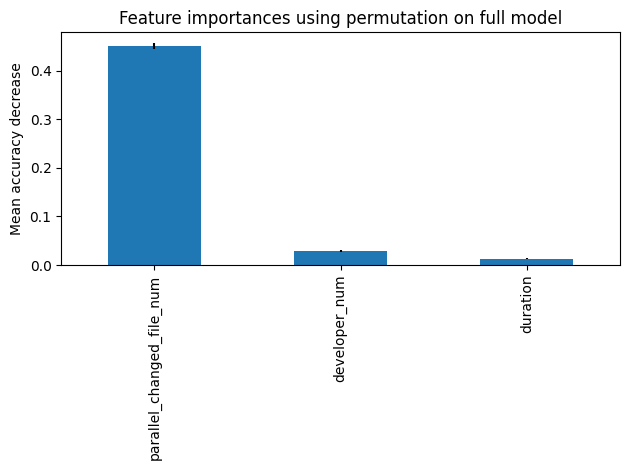

In [ ]:
permu = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

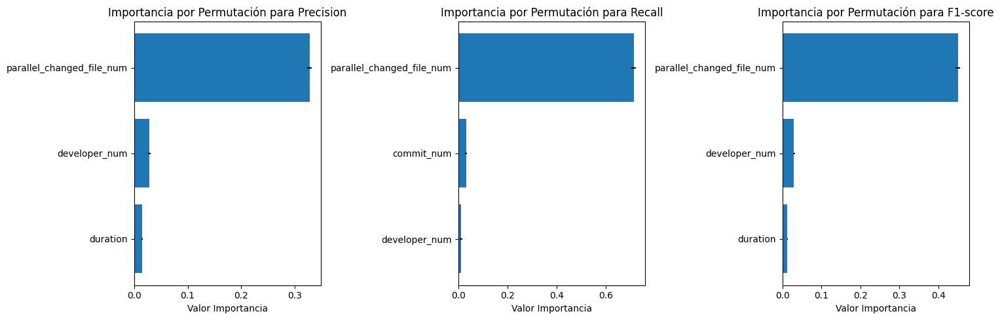

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rf = {}

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.328446,0.004469
1,developer_num,0.028100,0.001982
2,duration,0.014649,0.001381


In [ ]:
results_global_rf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.714497,0.009817
1,commit_num,0.030859,0.003340
2,developer_num,0.010450,0.004948


In [ ]:
results_global_rf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.450075,0.006136
1,developer_num,0.028995,0.002441
2,duration,0.012561,0.001576


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 35239 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 35239 values
  -> model_class       : sklearn.ensemble._forest.RandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5310c49b40> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.000186, mean = 0.194, max = 0.977
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.967, mean = -0.0997, max = 0.966
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

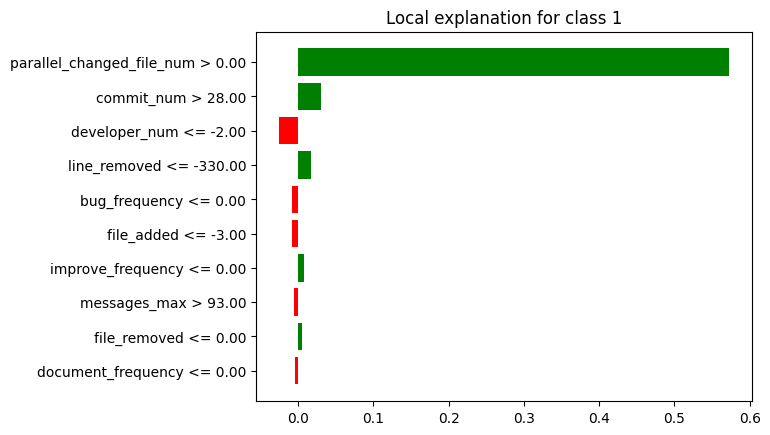

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              file_modified        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              file_modified        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3               line_removed        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_modified', 'duration']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'duration', 'bug_frequency', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       5  Positivo       -   
2                   duration         5  Positivo       -         -       -   
3              bug_frequency         -         -       -         -       5   
4              file_modified         4  Positivo       4  Positivo       -   
5                 commit_num         2  Positivo       2  Positivo       2   
6              developer_num         -         -       -         -       3   
7               line_removed         3  Positivo       3  Positivo       4   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4         -  
5  Positivo  
6  Negativo  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "file_modified", "duration", "file_removed", "developer_num", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_removed                      3  Positivo       3  Positivo       4   
file_modified                     4  Positivo       4  Positivo       -   
duration                          5  Positivo       -         -       -   
file_removed                      -         -       5  Positivo       -   
developer_num                     -         -       -         -       3   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed               Positivo  
file_modified                     -  
duration                          -  
file_removed                      -  
developer_num              Negativo  
bug_frequency              Negativo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

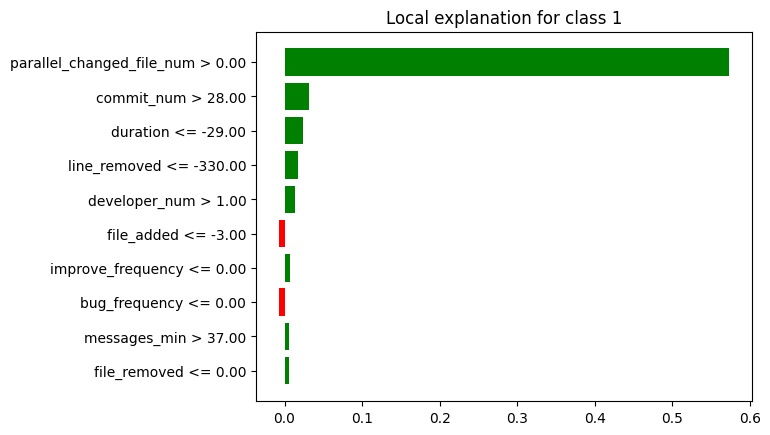

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2             commit_density        3  Negativo
3                   duration        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                   duration        3  Positivo
3             commit_density        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                   duration        3  Positivo
3               line_removed        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'commit_density', 'duration', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'duration', 'commit_density', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'duration', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'duration', 'commit_density', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                   duration         4  Positivo       3  Positivo       3   
2             commit_density         3  Negativo       4  Negativo       -   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         5  Positivo       5  Positivo       5   
5               line_removed         -         -       -         -       4   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4  Positivo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "commit_density", "duration", "developer_num", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
commit_density                    3  Negativo       4  Negativo       -   
duration                          4  Positivo       3  Positivo       3   
developer_num                     5  Positivo       5  Positivo       5   
line_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
commit_density                    -  
duration                   Positivo  
developer_num              Positivo  
line_removed               Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

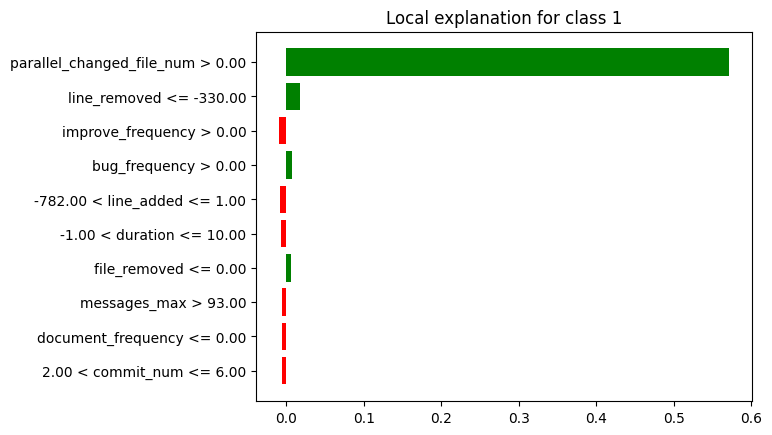

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[4, 'Variable'] = 'line_added'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2              bug_frequency        3  Negativo
3              fix_frequency        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Negativo
2              bug_frequency        3  Negativo
3               file_removed        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2          improve_frequency        3  Negativo
3              bug_frequency        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'bug_frequency', 'fix_frequency', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'bug_frequency', 'file_removed', 'developer_num']
['parallel_changed_file_num', 'line_removed', 'improve_frequency', 'bug_frequency', 'line_added']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'bug_frequency', 'line_added', 'commit_num', 'developer_num', 'improve_frequency', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       4  Positivo       -   
2              fix_frequency         4  Negativo       -         -       -   
3              bug_frequency         3  Negativo       3  Negativo       4   
4                 line_added         -         -       -         -       5   
5                 commit_num         2  Negativo       2  Negativo       -   
6              developer_num         5  Positivo       5  Positivo       -   
7          improve_frequency         -         -       -         -       3   
8               line_removed         -         -       -         -       2   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Positivo  
4  Negativo  
5         -  
6         -  
7  Negativo  
8  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "bug_frequency", "fix_frequency", "developer_num", "file_removed", "line_removed", "improve_frequency", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Negativo       2  Negativo       -   
bug_frequency                     3  Negativo       3  Negativo       4   
fix_frequency                     4  Negativo       -         -       -   
developer_num                     5  Positivo       5  Positivo       -   
file_removed                      -         -       4  Positivo       -   
line_removed                      -         -       -         -       2   
improve_frequency                 -         -       -         -       3   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                        -  
bug_frequency              Positivo  
fix_frequency                     -  
developer_num                     -  
file_removed                      -  
line_removed               Positivo  
improve_frequency          Negativo  
line_added                 Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_modified', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('commit_density', 3), ('duration', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('bug_frequency', 3), ('fix_frequency', 4), ('developer_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_modified', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('commit_density', 4), ('duration', 3), ('developer_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('bug_frequency', 3), ('developer_num', 5), ('file_removed', 4)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 4), ('developer_num', 3), ('bug_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('duration', 3), ('developer_num', 5), ('line_removed', 4), ('parallel_changed_file_num', 1), 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
improve_frequency                     -      -             -      -   
developer_num                       5.0      2           5.0      2   
commit_num                          2.0      3           2.0      3   
file_modified                       4.0      1           4.0      1   
commit_density                      3.0      1           4.0      1   
bug_frequency                       3.0      1           3.0      1   
duration                            4.5      2           3.0      1   
line_added                            -      -             -      -   
fix_frequency                       4.0      1             -      -   
file_removed                          -      -           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                   3.333333      3  
improve_frequency                   3.0      1  
developer_num                       4.0      2  
commit_num                          2.0      2  
file_modified                         -      -  
commit_density                        -      -  
bug_frequency                       4.5      2  
duration                            3.0      1  
line_added                          5.0      1  
fix_frequency                         -      -  
file_removed                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vp[("General", "Conteo Total")] = df_resumen_rf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
improve_frequency                     -      -             -      -   
developer_num                       5.0      2           5.0      2   
commit_num                          2.0      3           2.0      3   
file_modified                       4.0      1           4.0      1   
commit_density                      3.0      1           4.0      1   
bug_frequency                       3.0      1           3.0      1   
duration                            4.5      2           3.0      1   
line_added                            -      -             -      -   
fix_frequency                       4.0      1             -      -   
file_removed                          -      -           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                   3.333333      3  3.111111            5  
improve_frequency                   3.0      1  3.000000            1  
developer_num                       4.0      2  4.666667            6  
commit_num                          2.0      2  2.000000            8  
file_modified                         -      -  4.000000            2  
commit_density                        -      -  3.500000            2  
bug_frequency                       4.5      2  3.500000            4  
duration                            3.0      1  3.500000            4  
line_added                          5.0      1  5.000000            1  
fix_frequency                         -      -  4.000000            1  
file_removed                          -      -  4.500000            2  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vp[("General", "Peso Conteo")] = df_resumen_rf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vp[("General", "Puntaje")] = df_resumen_rf_vp[("General", "Peso Rango")] + df_resumen_rf_vp[("General", "Peso Conteo")]
df_resumen_rf_vp[("General", "Ranking")] = df_resumen_rf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
improve_frequency                     -      -             -      -   
developer_num                       5.0      2           5.0      2   
commit_num                          2.0      3           2.0      3   
file_modified                       4.0      1           4.0      1   
commit_density                      3.0      1           4.0      1   
bug_frequency                       3.0      1           3.0      1   
duration                            4.5      2           3.0      1   
line_added                            -      -             -      -   
fix_frequency                       4.0      1             -      -   
file_removed                          -      -           4.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                   3.333333      3     3.0            5  
improve_frequency                   3.0      1     6.0            1  
developer_num                       4.0      2     6.0            6  
commit_num                          2.0      2     2.0            8  
file_modified                         -      -     9.0            2  
commit_density                        -      -     6.0            2  
bug_frequency                       4.5      2     4.0            4  
duration                            3.0      1     4.0            4  
line_added                          5.0      1    12.0            1  
fix_frequency                         -      -    11.0            1  
file_removed                          -      -    10.0            2  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vp = df_resumen_rf_vp[new_columns]

In [ ]:
df_resumen_rf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vp[(tech, "Ranking Medio")] = df_resumen_rf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          2.00      3   
line_removed                  3.0            5          3.00      1   
bug_frequency                 4.0            4          3.00      1   
duration                      4.0            4          4.50      2   
improve_frequency             6.0            1             -      -   
developer_num                 6.0            6          5.00      2   
commit_density                6.0            2          3.00      1   
file_modified                 9.0            2          4.00      1   
file_removed                 10.0            2             -      -   
fix_frequency                11.0            1          4.00      1   
line_added                   12.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      3          2.00      2  
line_removed                       3.00      1          3.33      3  
bug_frequency                      3.00      1          4.50      2  
duration                           3.00      1          3.00      1  
improve_frequency                     -      -          3.00      1  
developer_num                      5.00      2          4.00      2  
commit_density                     4.00      1             -      -  
file_modified                      4.00      1             -      -  
file_removed                       4.50      2             -      -  
fix_frequency                         -      -             -      -  
line_added                            -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

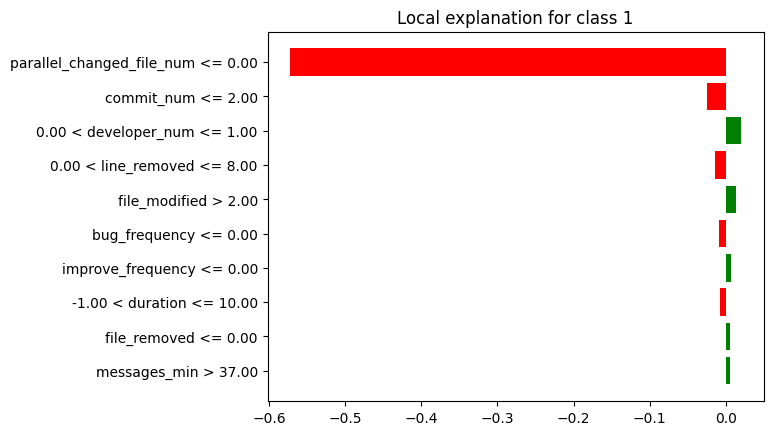

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[2, 'Variable'] = 'developer_num'
lime_vn_df_max.at[3, 'Variable'] = 'line_removed'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'line_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         -         -       5  Negativo       -   
2              file_modified         -         -       -         -       5   
3                 line_added         4  Negativo       -         -       -   
4                 commit_num         2  Negativo       2  Negativo       2   
5              developer_num         3  Positivo       3  Positivo       3   
6               line_removed         5  Negativo       4  Negativo       4   

             
      Signo  
0  Negativo  
1         -  
2  Positivo  
3         -  
4  Negativo  
5  Positivo  
6  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "line_removed", "file_removed",  "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Negativo       -         -       -   
line_removed                      5  Negativo       4  Negativo       4   
file_removed                      -         -       5  Negativo       -   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
line_added                        -  
line_removed               Negativo  
file_removed                      -  
file_modified              Positivo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

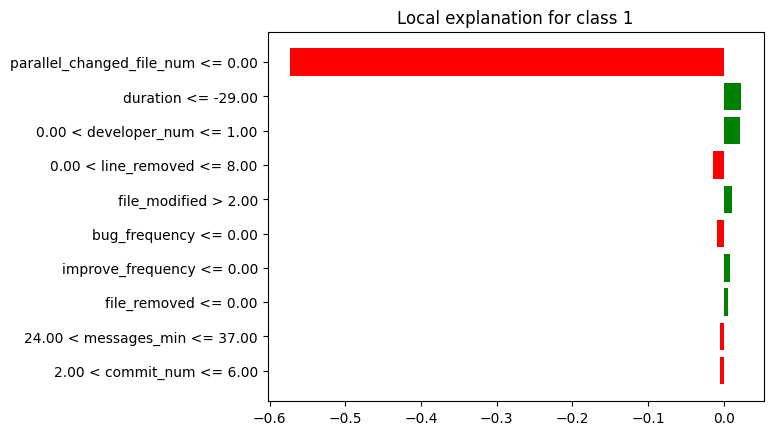

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[3, 'Variable'] = 'line_removed'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               line_removed        2  Negativo
2                 commit_num        3  Negativo
3              developer_num        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'line_removed']
['parallel_changed_file_num', 'line_removed', 'commit_num', 'developer_num', 'duration']
['parallel_changed_file_num', 'duration', 'developer_num', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'duration', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1                   duration         4  Positivo       5  Positivo       2   
2              file_modified         -         -       -         -       5   
3                 commit_num         2  Negativo       3  Negativo       -   
4              developer_num         3  Positivo       4  Positivo       3   
5               line_removed         5  Negativo       2  Negativo       4   

             
      Signo  
0  Negativo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "duration", "line_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       3  Negativo       -   
developer_num                     3  Positivo       4  Positivo       3   
duration                          4  Positivo       5  Positivo       2   
line_removed                      5  Negativo       2  Negativo       4   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                        -  
developer_num              Positivo  
duration                   Positivo  
line_removed               Negativo  
file_modified              Positivo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

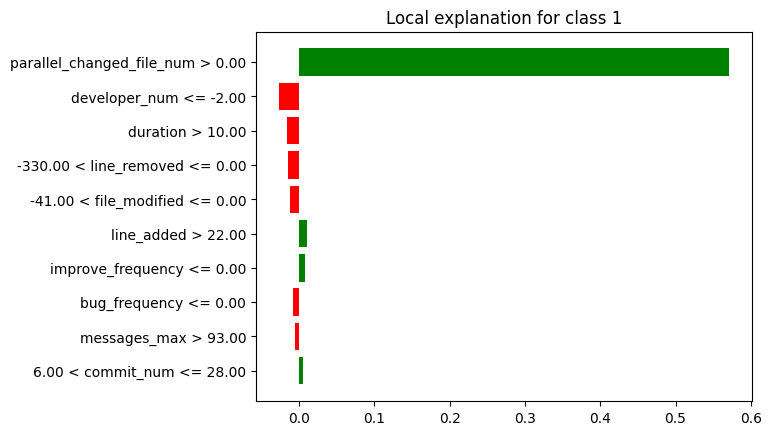

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[3, 'Variable'] = 'line_removed'
lime_vn_df_min.at[4, 'Variable'] = 'file_modified'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3              file_modified        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2              file_modified        3  Negativo
3                   duration        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3               line_removed        4  Negativo
4              file_modified        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'duration', 'file_modified', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'duration', 'file_removed']
['parallel_changed_file_num', 'developer_num', 'duration', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       5  Negativo       -   
2                   duration         3  Negativo       4  Negativo       3   
3              file_modified         4  Negativo       3  Negativo       5   
4                 commit_num         5  Positivo       -         -       -   
5              developer_num         2  Negativo       2  Negativo       2   
6               line_removed         -         -       -         -       4   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Negativo  
4         -  
5  Negativo  
6  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "file_modified", "commit_num", "file_removed", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
duration                          3  Negativo       4  Negativo       3   
file_modified                     4  Negativo       3  Negativo       5   
commit_num                        5  Positivo       -         -       -   
file_removed                      -         -       5  Negativo       -   
line_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
duration                   Negativo  
file_modified              Negativo  
commit_num                        -  
file_removed                      -  
line_removed               Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('duration', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('file_modified', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 4), ('duration', 5), ('line_removed', 2), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 4), ('file_modified', 3), ('file_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('developer_num', 3), ('duration', 2), ('line_removed', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('deve

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      2           3.0      2   
developer_num                  2.666667      3           3.0      3   
commit_num                          3.0      3           2.5      2   
file_modified                       4.0      1           3.0      1   
line_added                          4.0      1             -      -   
duration                            3.5      2           4.5      2   
file_removed                          -      -           5.0      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                        4.0      3  
developer_num                  2.666667      3  
commit_num                          2.0      1  
file_modified                       5.0      3  
line_added                            -      -  
duration                            2.5      2  
file_removed                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_vn[("General", "Conteo Total")] = df_resumen_rf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      2           3.0      2   
developer_num                  2.666667      3           3.0      3   
commit_num                          3.0      3           2.5      2   
file_modified                       4.0      1           3.0      1   
line_added                          4.0      1             -      -   
duration                            3.5      2           4.5      2   
file_removed                          -      -           5.0      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                        4.0      3  4.000000            7  
developer_num                  2.666667      3  2.777778            9  
commit_num                          2.0      1  2.500000            6  
file_modified                       5.0      3  4.000000            5  
line_added                            -      -  4.000000            1  
duration                            2.5      2  3.500000            6  
file_removed                          -      -  5.000000            2  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_vn[("General", "Peso Conteo")] = df_resumen_rf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_vn[("General", "Puntaje")] = df_resumen_rf_vn[("General", "Peso Rango")] + df_resumen_rf_vn[("General", "Peso Conteo")]
df_resumen_rf_vn[("General", "Ranking")] = df_resumen_rf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      2           3.0      2   
developer_num                  2.666667      3           3.0      3   
commit_num                          3.0      3           2.5      2   
file_modified                       4.0      1           3.0      1   
line_added                          4.0      1             -      -   
duration                            3.5      2           4.5      2   
file_removed                          -      -           5.0      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                        4.0      3     5.0            7  
developer_num                  2.666667      3     2.0            9  
commit_num                          2.0      1     3.0            6  
file_modified                       5.0      3     6.0            5  
line_added                            -      -     7.0            1  
duration                            2.5      2     4.0            6  
file_removed                          -      -     8.0            2  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_vn = df_resumen_rf_vn[new_columns]

In [ ]:
df_resumen_rf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_vn[(tech, "Ranking Medio")] = df_resumen_rf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          2.67      3   
commit_num                    3.0            6          3.00      3   
duration                      4.0            6          3.50      2   
line_removed                  5.0            7          5.00      2   
file_modified                 6.0            5          4.00      1   
line_added                    7.0            1          4.00      1   
file_removed                  8.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      3.00      3          2.67      3  
commit_num                         2.50      2          2.00      1  
duration                           4.50      2          2.50      2  
line_removed                       3.00      2          4.00      3  
file_modified                      3.00      1          5.00      3  
line_added                            -      -             -      -  
file_removed                       5.00      2             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

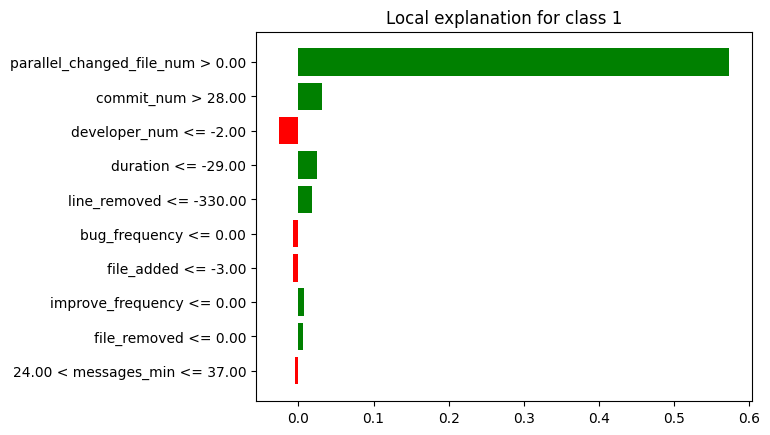

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3                 line_added        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3                   duration        4  Positivo
4               line_removed        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_removed', 'line_added', 'duration']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'line_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       4  Positivo       -   
2                   duration         5  Positivo       -         -       4   
3              file_modified         -         -       5  Positivo       -   
4                 line_added         4  Positivo       -         -       -   
5                 commit_num         2  Positivo       2  Positivo       2   
6              developer_num         -         -       -         -       3   
7               line_removed         3  Positivo       3  Positivo       5   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3         -  
4         -  
5  Positivo  
6  Negativo  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "line_added", "duration", "file_removed", "file_modified", "developer_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_removed                      3  Positivo       3  Positivo       5   
line_added                        4  Positivo       -         -       -   
duration                          5  Positivo       -         -       4   
file_removed                      -         -       4  Positivo       -   
file_modified                     -         -       5  Positivo       -   
developer_num                     -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed               Positivo  
line_added                        -  
duration                   Positivo  
file_removed                      -  
file_modified                     -  
developer_num              Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

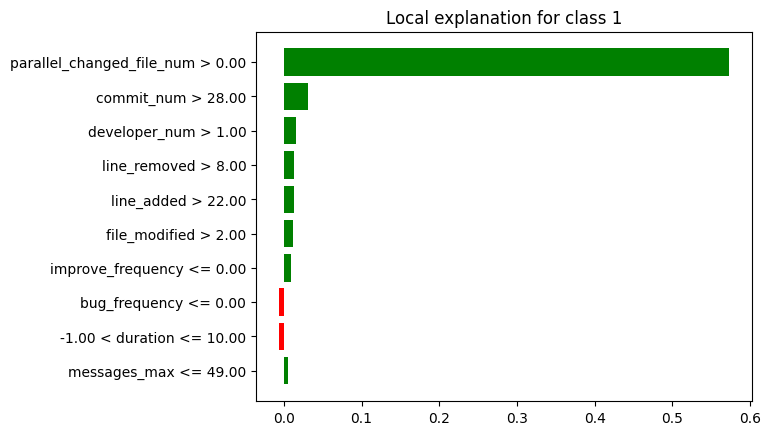

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              developer_num        4  Positivo
4              fix_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              developer_num        4  Positivo
4              fix_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Positivo
4                 line_added        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'line_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'line_added']
['parallel_changed_file_num', 'fix_frequency', 'line_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1              fix_frequency         5  Negativo       5  Negativo       -   
2                 line_added         -         -       -         -       5   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         4  Positivo       4  Positivo       3   
5               line_removed         3  Positivo       3  Positivo       4   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3  Positivo  
4  Positivo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "developer_num", "fix_frequency", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_removed                      3  Positivo       3  Positivo       4   
developer_num                     4  Positivo       4  Positivo       3   
fix_frequency                     5  Negativo       5  Negativo       -   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed               Positivo  
developer_num              Positivo  
fix_frequency                     -  
line_added                 Positivo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

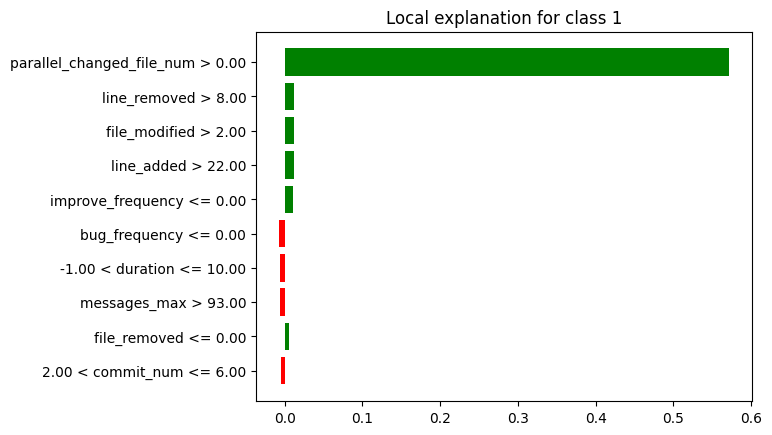

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2              file_modified        3  Positivo
3               line_removed        4  Negativo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2              file_modified        3  Positivo
3                 line_added        4  Positivo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'file_modified', 'line_removed', 'duration']
['parallel_changed_file_num', 'line_removed', 'file_modified', 'line_added', 'improve_frequency']
['parallel_changed_file_num', 'duration', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'improve_frequency', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                   duration         -         -       5  Positivo       -   
2                 line_added         -         -       -         -       4   
3              file_modified         5  Positivo       3  Positivo       3   
4                 commit_num         2  Positivo       -         -       -   
5              developer_num         3  Positivo       2  Positivo       -   
6          improve_frequency         -         -       -         -       5   
7               line_removed         4  Negativo       4  Negativo       2   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3  Positivo  
4         -  
5         -  
6  Positivo  
7  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_removed", "file_modified", "duration" , "line_added", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       -         -       -   
developer_num                     3  Positivo       2  Positivo       -   
line_removed                      4  Negativo       4  Negativo       2   
file_modified                     5  Positivo       3  Positivo       3   
duration                          -         -       5  Positivo       -   
line_added                        -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                        -  
developer_num                     -  
line_removed               Positivo  
file_modified              Positivo  
duration                          -  
line_added                 Positivo  
improve_frequency          Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('line_added', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('developer_num', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_modified', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_removed', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('developer_num', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 4), ('file_modified', 3), ('duration', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 5), ('duration', 4), ('developer_num', 3), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 4), ('developer_num', 3), ('line_added', 5), ('parallel_changed_file_num', 1), ('l

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                   3.333333      3      3.333333      3   
improve_frequency                     -      -             -      -   
developer_num                       3.5      2           3.0      2   
commit_num                          2.0      3           2.0      2   
line_added                          4.0      1             -      -   
file_modified                       5.0      1           4.0      2   
duration                            5.0      1           5.0      1   
fix_frequency                       5.0      1           5.0      1   
file_removed                          -      -           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                   3.666667      3  
improve_frequency                   5.0      1  
developer_num                       3.0      2  
commit_num                          2.0      2  
line_added                          4.5      2  
file_modified                       3.0      1  
duration                            4.0      1  
fix_frequency                         -      -  
file_removed                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fp[("General", "Conteo Total")] = df_resumen_rf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                   3.333333      3      3.333333      3   
improve_frequency                     -      -             -      -   
developer_num                       3.5      2           3.0      2   
commit_num                          2.0      3           2.0      2   
line_added                          4.0      1             -      -   
file_modified                       5.0      1           4.0      2   
duration                            5.0      1           5.0      1   
fix_frequency                       5.0      1           5.0      1   
file_removed                          -      -           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                   3.666667      3  3.444444            9  
improve_frequency                   5.0      1  5.000000            1  
developer_num                       3.0      2  3.166667            6  
commit_num                          2.0      2  2.000000            7  
line_added                          4.5      2  4.250000            3  
file_modified                       3.0      1  4.000000            4  
duration                            4.0      1  4.666667            3  
fix_frequency                         -      -  5.000000            2  
file_removed                          -      -  4.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fp[("General", "Peso Conteo")] = df_resumen_rf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fp[("General", "Puntaje")] = df_resumen_rf_fp[("General", "Peso Rango")] + df_resumen_rf_fp[("General", "Peso Conteo")]
df_resumen_rf_fp[("General", "Ranking")] = df_resumen_rf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                   3.333333      3      3.333333      3   
improve_frequency                     -      -             -      -   
developer_num                       3.5      2           3.0      2   
commit_num                          2.0      3           2.0      2   
line_added                          4.0      1             -      -   
file_modified                       5.0      1           4.0      2   
duration                            5.0      1           5.0      1   
fix_frequency                       5.0      1           5.0      1   
file_removed                          -      -           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                   3.666667      3     3.0            9  
improve_frequency                   5.0      1    10.0            1  
developer_num                       3.0      2     4.0            6  
commit_num                          2.0      2     2.0            7  
line_added                          4.5      2     6.0            3  
file_modified                       3.0      1     5.0            4  
duration                            4.0      1     7.0            3  
fix_frequency                         -      -     9.0            2  
file_removed                          -      -     8.0            1  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fp = df_resumen_rf_fp[new_columns]

In [ ]:
df_resumen_rf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fp[(tech, "Ranking Medio")] = df_resumen_rf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            7          2.00      3   
line_removed                  3.0            9          3.33      3   
developer_num                 4.0            6          3.50      2   
file_modified                 5.0            4          5.00      1   
line_added                    6.0            3          4.00      1   
duration                      7.0            3          5.00      1   
file_removed                  8.0            1             -      -   
fix_frequency                 9.0            2          5.00      1   
improve_frequency            10.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.00      2          2.00      2  
line_removed                       3.33      3          3.67      3  
developer_num                      3.00      2          3.00      2  
file_modified                      4.00      2          3.00      1  
line_added                            -      -          4.50      2  
duration                           5.00      1          4.00      1  
file_removed                       4.00      1             -      -  
fix_frequency                      5.00      1             -      -  
improve_frequency                     -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

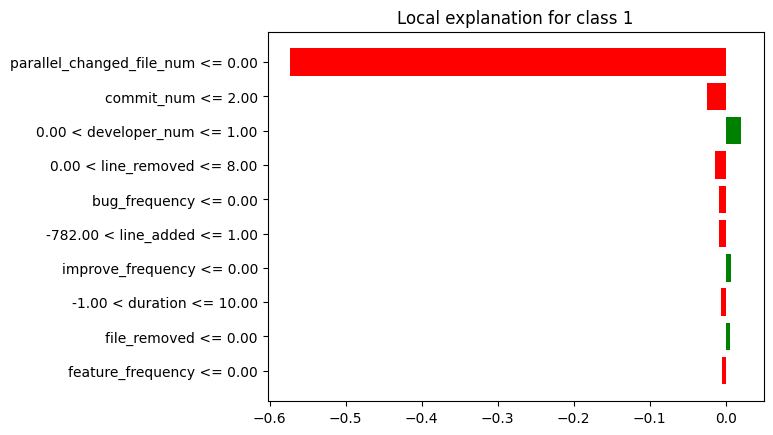

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[2, 'Variable'] = 'developer_num'
lime_fn_df_max.at[3, 'Variable'] = 'line_removed'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3                 line_added        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'bug_frequency', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         -         -       5  Negativo       -   
2              bug_frequency         -         -       -         -       5   
3                 line_added         4  Negativo       -         -       -   
4              file_modified         5  Positivo       -         -       -   
5                 commit_num         2  Negativo       2  Negativo       2   
6              developer_num         3  Positivo       3  Positivo       3   
7               line_removed         -         -       4  Negativo       4   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3         -  
4         -  
5  Negativo  
6  Positivo  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_modified", "line_removed", "file_removed", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       3  Positivo       3   
line_added                        4  Negativo       -         -       -   
file_modified                     5  Positivo       -         -       -   
line_removed                      -         -       4  Negativo       4   
file_removed                      -         -       5  Negativo       -   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
line_added                        -  
file_modified                     -  
line_removed               Negativo  
file_removed                      -  
bug_frequency              Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

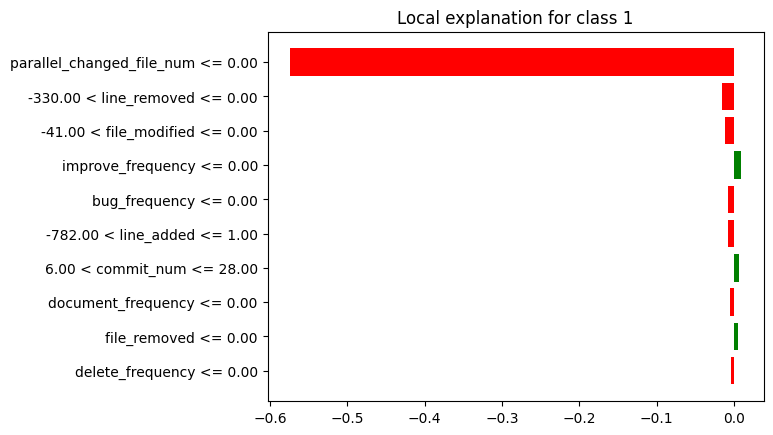

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[1, 'Variable'] = 'line_removed'
lime_fn_df_mediana.at[2, 'Variable'] = 'file_modified'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              developer_num        3  Positivo
3                 file_added        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               line_removed        2  Negativo
2              file_modified        3  Negativo
3          improve_frequency        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'file_removed', 'developer_num', 'file_added', 'duration']
['parallel_changed_file_num', 'file_removed', 'file_added', 'developer_num', 'duration']
['parallel_changed_file_num', 'line_removed', 'file_modified', 'improve_frequency', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'duration', 'bug_frequency', 'file_modified', 'file_added', 'developer_num', 'improve_frequency', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         2  Positivo       2  Positivo       -   
2                   duration         5  Positivo       5  Positivo       -   
3              bug_frequency         -         -       -         -       5   
4              file_modified         -         -       -         -       3   
5                 file_added         4  Positivo       3  Positivo       -   
6              developer_num         3  Positivo       4  Positivo       -   
7          improve_frequency         -         -       -         -       4   
8               line_removed         -         -       -         -       2   

             
      Signo  
0  Negativo  
1         -  
2         -  
3  Negativo  
4  Negativo  
5         -  
6         -  
7  Positivo  
8  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "developer_num", "file_added", "duration", "line_removed", "file_modified", "improve_frequency", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_removed                      2  Positivo       2  Positivo       -   
developer_num                     3  Positivo       4  Positivo       -   
file_added                        4  Positivo       3  Positivo       -   
duration                          5  Positivo       5  Positivo       -   
line_removed                      -         -       -         -       2   
file_modified                     -         -       -         -       3   
improve_frequency                 -         -       -         -       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_removed                      -  
developer_num                     -  
file_added                        -  
duration                          -  
line_removed               Negativo  
file_modified              Negativo  
improve_frequency          Positivo  
bug_frequency              Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

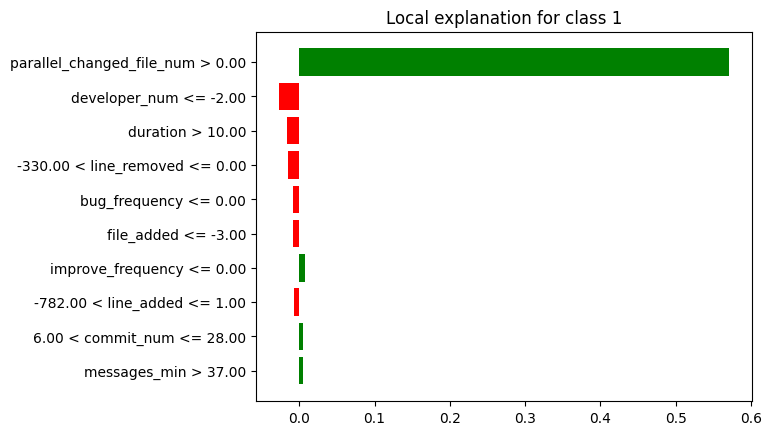

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)
lime_fn_df_min.at[3, 'Variable'] = 'line_removed'

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3                 commit_num        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3                   duration        4  Negativo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3               line_removed        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'duration', 'commit_num', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'line_removed']
['parallel_changed_file_num', 'developer_num', 'duration', 'line_removed', 'bug_frequency']
['parallel_changed_file_num', 'duration', 'bug_frequency', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                   duration         3  Negativo       4  Negativo       3   
2              bug_frequency         -         -       -         -       5   
3                 commit_num         4  Positivo       3  Positivo       -   
4              developer_num         2  Negativo       2  Negativo       2   
5               line_removed         5  Negativo       5  Negativo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Negativo  
3         -  
4  Negativo  
5  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "commit_num", "line_removed", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
duration                          3  Negativo       4  Negativo       3   
commit_num                        4  Positivo       3  Positivo       -   
line_removed                      5  Negativo       5  Negativo       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
duration                   Negativo  
commit_num                        -  
line_removed               Negativo  
bug_frequency              Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 3), ('file_added', 4), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('commit_num', 4), ('line_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 4), ('file_added', 3), ('duration', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 4), ('commit_num', 3), ('line_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('bug_frequency', 5), ('parallel_changed_file_num', 1), ('line_removed', 2), ('file_modified', 3), ('improve_frequency', 4), ('bug_frequency', 5), ('parallel_changed_file_num', 1), 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      1           4.5      2   
improve_frequency                     -      -             -      -   
developer_num                  2.666667      3           3.0      3   
commit_num                          3.0      2           2.5      2   
file_added                          4.0      1           3.0      1   
line_added                          4.0      1             -      -   
file_modified                       5.0      1             -      -   
bug_frequency                         -      -             -      -   
duration                            4.0      2           4.5      2   
file_removed                        2.0      1           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                   3.333333      3  
improve_frequency                   4.0      1  
developer_num                       2.5      2  
commit_num                          2.0      1  
file_added                            -      -  
line_added                            -      -  
file_modified                       3.0      1  
bug_frequency                       5.0      3  
duration                            3.0      1  
file_removed                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf_fn[("General", "Conteo Total")] = df_resumen_rf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      1           4.5      2   
improve_frequency                     -      -             -      -   
developer_num                  2.666667      3           3.0      3   
commit_num                          3.0      2           2.5      2   
file_added                          4.0      1           3.0      1   
line_added                          4.0      1             -      -   
file_modified                       5.0      1             -      -   
bug_frequency                         -      -             -      -   
duration                            4.0      2           4.5      2   
file_removed                        2.0      1           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                   3.333333      3  4.277778            6  
improve_frequency                   4.0      1  4.000000            1  
developer_num                       2.5      2  2.722222            8  
commit_num                          2.0      1  2.500000            5  
file_added                            -      -  3.500000            2  
line_added                            -      -  4.000000            1  
file_modified                       3.0      1  4.000000            2  
bug_frequency                       5.0      3  5.000000            3  
duration                            3.0      1  3.833333            5  
file_removed                          -      -  2.750000            3  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf_fn[("General", "Peso Conteo")] = df_resumen_rf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf_fn[("General", "Puntaje")] = df_resumen_rf_fn[("General", "Peso Rango")] + df_resumen_rf_fn[("General", "Peso Conteo")]
df_resumen_rf_fn[("General", "Ranking")] = df_resumen_rf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        5.0      1           4.5      2   
improve_frequency                     -      -             -      -   
developer_num                  2.666667      3           3.0      3   
commit_num                          3.0      2           2.5      2   
file_added                          4.0      1           3.0      1   
line_added                          4.0      1             -      -   
file_modified                       5.0      1             -      -   
bug_frequency                         -      -             -      -   
duration                            4.0      2           4.5      2   
file_removed                        2.0      1           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                   3.333333      3     6.0            6  
improve_frequency                   4.0      1    10.0            1  
developer_num                       2.5      2     2.0            8  
commit_num                          2.0      1     3.0            5  
file_added                            -      -     7.0            2  
line_added                            -      -    10.0            1  
file_modified                       3.0      1     8.0            2  
bug_frequency                       5.0      3     9.0            3  
duration                            3.0      1     5.0            5  
file_removed                          -      -     4.0            3  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf_fn = df_resumen_rf_fn[new_columns]

In [ ]:
df_resumen_rf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf_fn[(tech, "Ranking Medio")] = df_resumen_rf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            8          2.67      3   
commit_num                    3.0            5          3.00      2   
file_removed                  4.0            3          2.00      1   
duration                      5.0            5          4.00      2   
line_removed                  6.0            6          5.00      1   
file_added                    7.0            2          4.00      1   
file_modified                 8.0            2          5.00      1   
bug_frequency                 9.0            3             -      -   
improve_frequency            10.0            1             -      -   
line_added                   10.0            1          4.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      3.00      3          2.50      2  
commit_num                         2.50      2          2.00      1  
file_removed                       3.50      2             -      -  
duration                           4.50      2          3.00      1  
line_removed                       4.50      2          3.33      3  
file_added                         3.00      1             -      -  
file_modified                         -      -          3.00      1  
bug_frequency                         -      -          5.00      3  
improve_frequency                     -      -          4.00      1  
line_added                            -      -             -      -

## **BalancedRandomForest:**

**FEATURE IMPORTANCE**

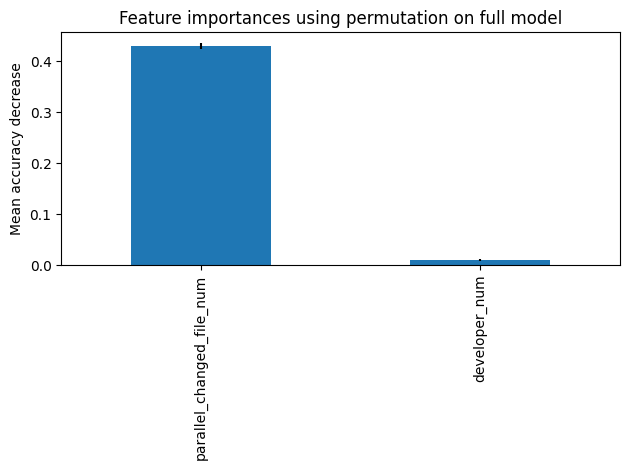

In [ ]:
permu = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(2), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

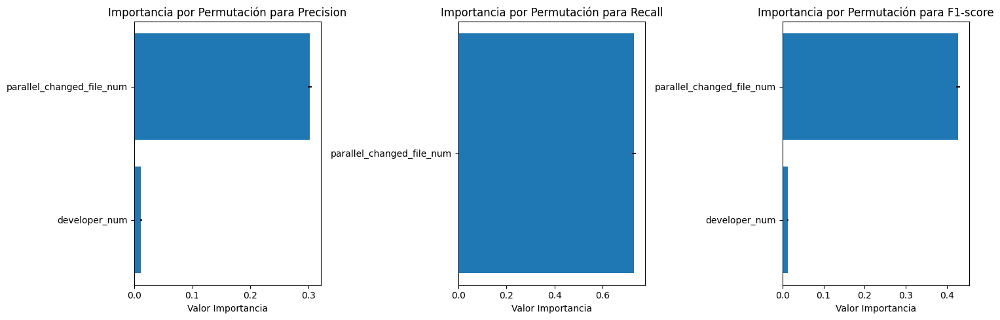

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_brf = {}

permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_brf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_brf['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.302694,0.003769
1,developer_num,0.011822,0.001379


In [ ]:
results_global_brf['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.729838,0.009277


In [ ]:
results_global_brf['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.427921,0.005357
1,developer_num,0.012832,0.001651


In [ ]:
scoring = ['accuracy', 'precision', 'recall','f1']
permu_score = permutation_importance(modelo_brf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for metric in permu_score:
  print(f"\nUsando como referencia: {metric}\n")
  permu = permu_score[metric]
  for i in permu.importances_mean.argsort()[::-1]:
    if abs(permu.importances_mean[i].round(3)) > 0.000:
      print(f"    {feature_names[i]:<30}"
      f"{permu.importances_mean[i]:.3f}"
      f" +/- {permu.importances_std[i]:.3f}")


Usando como referencia: accuracy

    parallel_changed_file_num     0.140 +/- 0.002
    developer_num                 0.007 +/- 0.001
    duration                      0.004 +/- 0.001
    line_added                    0.004 +/- 0.001
    file_modified                 0.003 +/- 0.000
    file_added                    0.003 +/- 0.000
    file_removed                  0.002 +/- 0.000
    line_removed                  0.001 +/- 0.001
    commit_num                    -0.001 +/- 0.001

Usando como referencia: precision

    parallel_changed_file_num     0.303 +/- 0.004
    developer_num                 0.012 +/- 0.001
    line_added                    0.007 +/- 0.001
    duration                      0.007 +/- 0.001
    file_modified                 0.005 +/- 0.001
    file_added                    0.005 +/- 0.001
    file_removed                  0.003 +/- 0.001
    line_removed                  0.002 +/- 0.001
    commit_num                    -0.002 +/- 0.001

Usando como referencia: re

**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_brf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 35239 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 35239 values
  -> model_class       : imblearn.ensemble._forest.BalancedRandomForestClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5310c49b40> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.0, mean = 0.212, max = 1.0
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.988, mean = -0.118, max = 0.752
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

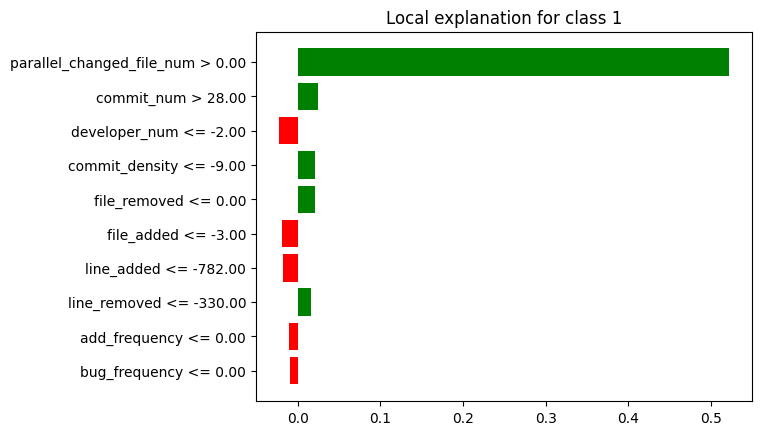

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Positivo
3              file_modified        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              file_modified        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Negativo
3             commit_density        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_added', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'commit_density', 'file_removed']
['parallel_changed_file_num', 'file_removed', 'commit_density', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       5  Positivo       5   
2             commit_density         -         -       -         -       4   
3                 line_added         3  Positivo       -         -       -   
4              file_modified         4  Positivo       4  Positivo       -   
5                 commit_num         2  Positivo       2  Positivo       2   
6              developer_num         5  Positivo       -         -       3   
7               line_removed         -         -       3  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4         -  
5  Positivo  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_added", "file_modified", "developer_num", "line_removed", "file_removed", "commit_density"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_added                        3  Positivo       -         -       -   
file_modified                     4  Positivo       4  Positivo       -   
developer_num                     5  Positivo       -         -       3   
line_removed                      -         -       3  Positivo       -   
file_removed                      -         -       5  Positivo       5   
commit_density                    -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_added                        -  
file_modified                     -  
developer_num              Negativo  
line_removed                      -  
file_removed               Positivo  
commit_density             Positivo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

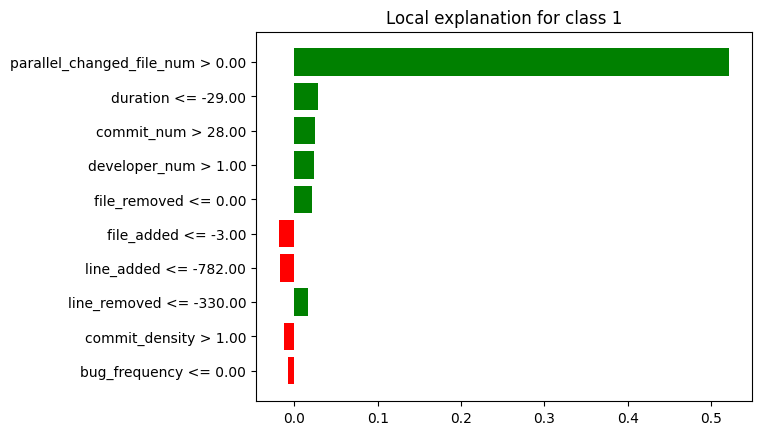

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2             commit_density        3  Negativo
3                   duration        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2             commit_density        3  Negativo
3               line_removed        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'commit_density', 'duration', 'line_removed']
['parallel_changed_file_num', 'commit_num', 'commit_density', 'line_removed', 'duration']
['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'commit_density', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       -         -       5   
2                   duration         4  Positivo       5  Positivo       2   
3             commit_density         3  Negativo       3  Negativo       -   
4                 commit_num         2  Positivo       2  Positivo       3   
5              developer_num         -         -       -         -       4   
6               line_removed         5  Positivo       4  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5  Positivo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "commit_density", "duration", "line_removed", "developer_num", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       3   
commit_density                    3  Negativo       3  Negativo       -   
duration                          4  Positivo       5  Positivo       2   
line_removed                      5  Positivo       4  Positivo       -   
developer_num                     -         -       -         -       4   
file_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
commit_density                    -  
duration                   Positivo  
line_removed                      -  
developer_num              Positivo  
file_removed               Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

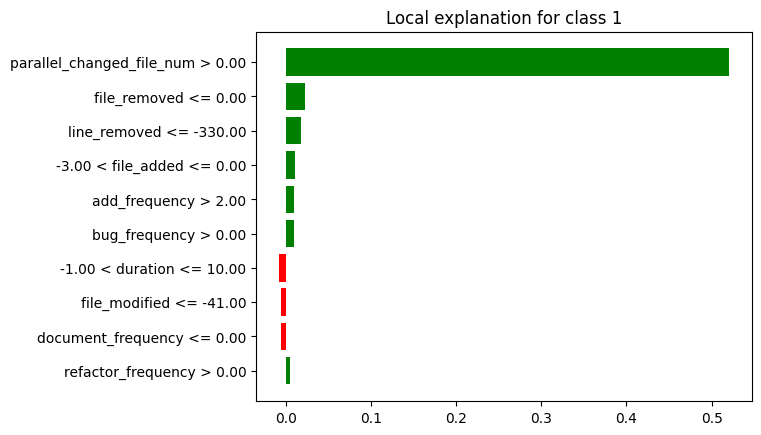

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[3, 'Variable'] = 'file_added'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency        2  Negativo
2          improve_frequency        3  Negativo
3                 commit_num        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              bug_frequency        2  Negativo
2                 commit_num        3  Negativo
3              file_modified        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2               line_removed        3  Positivo
3                 file_added        4  Positivo
4              add_frequency        5  Positivo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'bug_frequency', 'improve_frequency', 'commit_num', 'developer_num']
['parallel_changed_file_num', 'bug_frequency', 'commit_num', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'line_removed', 'file_added', 'add_frequency']
['parallel_changed_file_num', 'file_removed', 'bug_frequency', 'file_modified', 'file_added', 'commit_num', 'add_frequency', 'developer_num', 'improve_frequency', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       -         -       2   
2              bug_frequency         2  Negativo       2  Negativo       -   
3              file_modified         -         -       4  Negativo       -   
4                 file_added         -         -       -         -       4   
5                 commit_num         4  Negativo       3  Negativo       -   
6              add_frequency         -         -       -         -       5   
7              developer_num         5  Positivo       5  Positivo       -   
8          improve_frequency         3  Negativo       -         -       -   
9               line_removed         -         -       -         -       3   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5         -  
6  Positivo  
7         -  
8         -  
9  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "bug_frequency", "improve_frequency", "commit_num", "developer_num", "file_modified", "file_removed", "line_removed", "file_added", "add_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
bug_frequency                     2  Negativo       2  Negativo       -   
improve_frequency                 3  Negativo       -         -       -   
commit_num                        4  Negativo       3  Negativo       -   
developer_num                     5  Positivo       5  Positivo       -   
file_modified                     -         -       4  Negativo       -   
file_removed                      -         -       -         -       2   
line_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   
add_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
bug_frequency                     -  
improve_frequency                 -  
commit_num                        -  
developer_num                     -  
file_modified                     -  
file_removed               Positivo  
line_removed               Positivo  
file_added                 Positivo  
add_frequency              Positivo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_added', 3), ('file_modified', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('commit_density', 3), ('duration', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('bug_frequency', 2), ('improve_frequency', 3), ('commit_num', 4), ('developer_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('file_modified', 4), ('line_removed', 3), ('file_removed', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('commit_density', 3), ('duration', 5), ('line_removed', 4), ('parallel_changed_file_num', 1), ('bug_frequency', 2), ('commit_num', 3), ('developer_num', 5), ('file_modified', 4)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_removed', 5), ('commit_density', 4), ('parallel_changed_file_num', 1), ('commit_num', 3), ('duration', 2), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                   3.0      1             -      -   
add_frequency                         -      -             -      -   
line_added                          3.0      1             -      -   
file_modified                       4.0      1           4.0      2   
commit_density                      3.0      1           3.0      1   
duration                            4.0      1           5.0      1   
bug_frequency                       2.0      1           2.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
line_removed                        5.0      1           3.5      2   
developer_num                       5.0      2           5.0      1   
commit_num                     2.666667      3      2.333333      3   
file_added                            -      -             -      -   
file_removed                          -      -           5.0      1   

                                   Lime         
                          Ranking Medio Conteo  
improve_frequency                     -      -  
add_frequency                       5.0      1  
line_added                            -      -  
file_modified                         -      -  
commit_density                      4.0      1  
duration                            2.0      1  
bug_frequency                         -      -  
parallel_changed_file_num           1.0      3  
line_removed                        3.0      1  
developer_num                       3.5      2  
commit_num                          2.5      2  
file_added                          4.0      1  
file_removed                        4.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vp[("General", "Conteo Total")] = df_resumen_brf_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                   3.0      1             -      -   
add_frequency                         -      -             -      -   
line_added                          3.0      1             -      -   
file_modified                       4.0      1           4.0      2   
commit_density                      3.0      1           3.0      1   
duration                            4.0      1           5.0      1   
bug_frequency                       2.0      1           2.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
line_removed                        5.0      1           3.5      2   
developer_num                       5.0      2           5.0      1   
commit_num                     2.666667      3      2.333333      3   
file_added                            -      -             -      -   
file_removed                          -      -           5.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
improve_frequency                     -      -  3.000000            1  
add_frequency                       5.0      1  5.000000            1  
line_added                            -      -  3.000000            1  
file_modified                         -      -  4.000000            3  
commit_density                      4.0      1  3.333333            3  
duration                            2.0      1  3.666667            3  
bug_frequency                         -      -  2.000000            2  
parallel_changed_file_num           1.0      3  1.000000            9  
line_removed                        3.0      1  3.833333            4  
developer_num                       3.5      2  4.500000            5  
commit_num                          2.5      2  2.500000            8  
file_added                          4.0      1  4.000000            1  
file_removed                        4.0      3  4.500000            4

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vp[("General", "Peso Conteo")] = df_resumen_brf_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vp[("General", "Puntaje")] = df_resumen_brf_vp[("General", "Peso Rango")] + df_resumen_brf_vp[("General", "Peso Conteo")]
df_resumen_brf_vp[("General", "Ranking")] = df_resumen_brf_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                   3.0      1             -      -   
add_frequency                         -      -             -      -   
line_added                          3.0      1             -      -   
file_modified                       4.0      1           4.0      2   
commit_density                      3.0      1           3.0      1   
duration                            4.0      1           5.0      1   
bug_frequency                       2.0      1           2.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
line_removed                        5.0      1           3.5      2   
developer_num                       5.0      2           5.0      1   
commit_num                     2.666667      3      2.333333      3   
file_added                            -      -             -      -   
file_removed                          -      -           5.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
improve_frequency                     -      -     8.0            1  
add_frequency                       5.0      1    13.0            1  
line_added                            -      -     8.0            1  
file_modified                         -      -    11.0            3  
commit_density                      4.0      1     5.0            3  
duration                            2.0      1     6.0            3  
bug_frequency                         -      -     3.0            2  
parallel_changed_file_num           1.0      3     1.0            9  
line_removed                        3.0      1     4.0            4  
developer_num                       3.5      2     7.0            5  
commit_num                          2.5      2     2.0            8  
file_added                          4.0      1    12.0            1  
file_removed                        4.0      3    10.0            4

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vp = df_resumen_brf_vp[new_columns]

In [ ]:
df_resumen_brf_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vp[(tech, "Ranking Medio")] = df_resumen_brf_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          2.67      3   
bug_frequency                 3.0            2          2.00      1   
line_removed                  4.0            4          5.00      1   
commit_density                5.0            3          3.00      1   
duration                      6.0            3          4.00      1   
developer_num                 7.0            5          5.00      2   
improve_frequency             8.0            1          3.00      1   
line_added                    8.0            1          3.00      1   
file_removed                 10.0            4             -      -   
file_modified                11.0            3          4.00      1   
file_added                   12.0            1             -      -   
add_frequency                13.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.33      3          2.50      2  
bug_frequency                      2.00      1             -      -  
line_removed                       3.50      2          3.00      1  
commit_density                     3.00      1          4.00      1  
duration                           5.00      1          2.00      1  
developer_num                      5.00      1          3.50      2  
improve_frequency                     -      -             -      -  
line_added                            -      -             -      -  
file_removed                       5.00      1          4.00      3  
file_modified                      4.00      2             -      -  
file_added                            -      -          4.00      1  
add_frequency                         -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

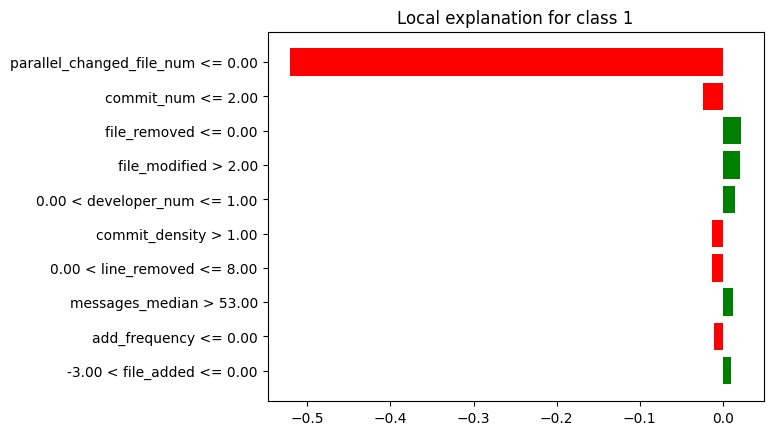

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[4, 'Variable'] = 'developer_num'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4               messages_min        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               line_removed        3  Negativo
3               file_removed        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               file_removed        3  Positivo
3              file_modified        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_removed', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'file_modified', 'developer_num']
['messages_min', 'parallel_changed_file_num', 'file_removed', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               messages_min         5  Negativo       -         -       -   
1  parallel_changed_file_num         1  Negativo       1  Negativo       1   
2               file_removed         -         -       4  Negativo       3   
3              file_modified         -         -       -         -       4   
4                 commit_num         2  Negativo       2  Negativo       2   
5              developer_num         3  Positivo       5  Positivo       5   
6               line_removed         4  Negativo       3  Negativo       -   

             
      Signo  
0         -  
1  Negativo  
2  Positivo  
3  Positivo  
4  Negativo  
5  Positivo  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_removed", "messages_min", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       5  Positivo       5   
line_removed                      4  Negativo       3  Negativo       -   
messages_min                      5  Negativo       -         -       -   
file_removed                      -         -       4  Negativo       3   
file_modified                     -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
line_removed                      -  
messages_min                      -  
file_removed               Positivo  
file_modified              Positivo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

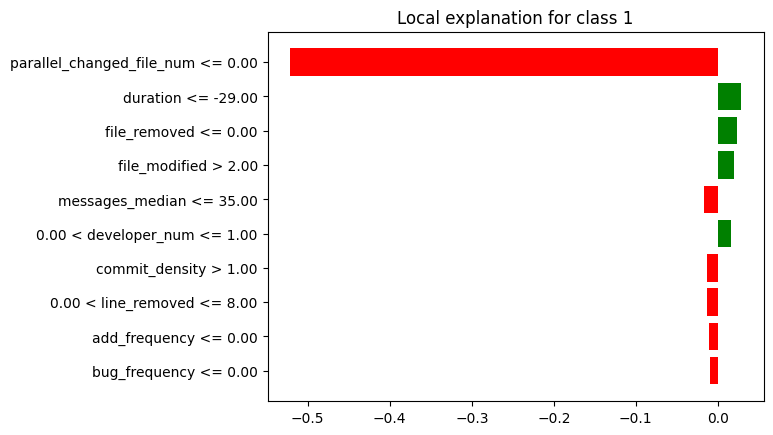

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2                 commit_num        3  Negativo
3               line_removed        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2               line_removed        3  Negativo
3               file_removed        4  Negativo
4                 commit_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2               file_removed        3  Positivo
3              file_modified        4  Positivo
4            messages_median        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'duration', 'commit_num', 'line_removed', 'file_removed']
['parallel_changed_file_num', 'duration', 'line_removed', 'file_removed', 'commit_num']
['parallel_changed_file_num', 'duration', 'file_removed', 'file_modified', 'messages_median']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'messages_median', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         5  Negativo       4  Negativo       3   
2                   duration         2  Positivo       2  Positivo       2   
3              file_modified         -         -       -         -       4   
4                 commit_num         3  Negativo       5  Negativo       -   
5            messages_median         -         -       -         -       5   
6               line_removed         4  Negativo       3  Negativo       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Positivo  
3  Positivo  
4         -  
5  Negativo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "commit_num", "line_removed", "file_removed", "file_modified", "messages_median"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
duration                          2  Positivo       2  Positivo       2   
commit_num                        3  Negativo       5  Negativo       -   
line_removed                      4  Negativo       3  Negativo       -   
file_removed                      5  Negativo       4  Negativo       3   
file_modified                     -         -       -         -       4   
messages_median                   -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
duration                   Positivo  
commit_num                        -  
line_removed                      -  
file_removed               Positivo  
file_modified              Positivo  
messages_median            Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

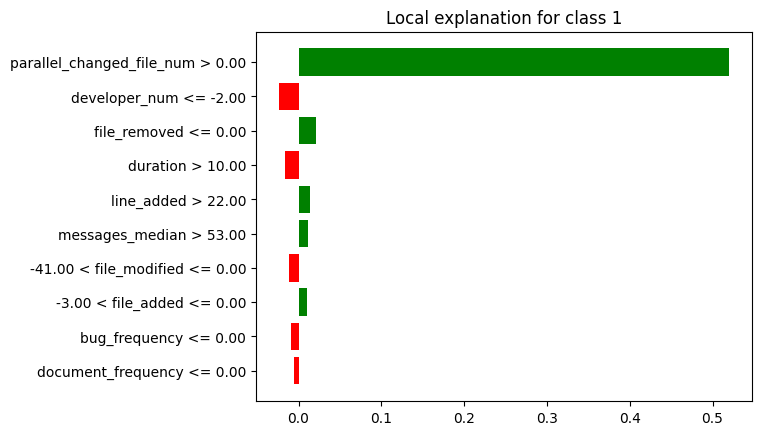

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3                 commit_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3            messages_median        4  Positivo
4               messages_max        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3                   duration        4  Negativo
4                 line_added        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'duration', 'commit_num', 'file_removed']
['parallel_changed_file_num', 'developer_num', 'duration', 'messages_median', 'messages_max']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'duration', 'line_added']
['parallel_changed_file_num', 'messages_max', 'file_removed', 'duration', 'line_added', 'commit_num', 'developer_num', 'messages_median']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               messages_max         -         -       5  Negativo       -   
2               file_removed         5  Negativo       -         -       3   
3                   duration         3  Negativo       3  Negativo       4   
4                 line_added         -         -       -         -       5   
5                 commit_num         4  Positivo       -         -       -   
6              developer_num         2  Negativo       2  Negativo       2   
7            messages_median         -         -       4  Positivo       -   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3  Negativo  
4  Positivo  
5         -  
6  Negativo  
7         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "commit_num", "file_removed", "messages_median", "messages_max", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       2   
duration                          3  Negativo       3  Negativo       4   
commit_num                        4  Positivo       -         -       -   
file_removed                      5  Negativo       -         -       3   
messages_median                   -         -       4  Positivo       -   
messages_max                      -         -       5  Negativo       -   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
duration                   Negativo  
commit_num                        -  
file_removed               Positivo  
messages_median                   -  
messages_max                      -  
line_added                 Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_removed', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('commit_num', 3), ('line_removed', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('commit_num', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 5), ('line_removed', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('commit_num', 5), ('line_removed', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('messages_median', 4), ('messages_max', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 5), ('file_removed', 3), ('file_modified', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('file_modified', 4), ('messages_median', 5), ('parallel_changed_file_num', 1), ('d

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.0      2           3.0      2   
messages_median                       -      -           4.0      1   
developer_num                       2.5      2           3.5      2   
commit_num                          3.0      3           3.5      2   
file_modified                         -      -             -      -   
line_added                            -      -             -      -   
duration                            2.5      2           2.5      2   
file_removed                        5.0      2           4.0      2   
messages_max                          -      -           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1             -      -   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                          -      -  
messages_median                     5.0      1  
developer_num                       3.5      2  
commit_num                          2.0      1  
file_modified                       4.0      2  
line_added                          5.0      1  
duration                            3.0      2  
file_removed                        3.0      3  
messages_max                          -      -  
parallel_changed_file_num           1.0      3  
messages_min                          -      -

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_vn[("General", "Conteo Total")] = df_resumen_brf_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.0      2           3.0      2   
messages_median                       -      -           4.0      1   
developer_num                       2.5      2           3.5      2   
commit_num                          3.0      3           3.5      2   
file_modified                         -      -             -      -   
line_added                            -      -             -      -   
duration                            2.5      2           2.5      2   
file_removed                        5.0      2           4.0      2   
messages_max                          -      -           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                          -      -  3.500000            4  
messages_median                     5.0      1  4.500000            2  
developer_num                       3.5      2  3.166667            6  
commit_num                          2.0      1  2.833333            6  
file_modified                       4.0      2  4.000000            2  
line_added                          5.0      1  5.000000            1  
duration                            3.0      2  2.666667            6  
file_removed                        3.0      3  4.000000            7  
messages_max                          -      -  5.000000            1  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_min                          -      -  5.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_vn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_vn[("General", "Peso Conteo")] = df_resumen_brf_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_vn[("General", "Puntaje")] = df_resumen_brf_vn[("General", "Peso Rango")] + df_resumen_brf_vn[("General", "Peso Conteo")]
df_resumen_brf_vn[("General", "Ranking")] = df_resumen_brf_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.0      2           3.0      2   
messages_median                       -      -           4.0      1   
developer_num                       2.5      2           3.5      2   
commit_num                          3.0      3           3.5      2   
file_modified                         -      -             -      -   
line_added                            -      -             -      -   
duration                            2.5      2           2.5      2   
file_removed                        5.0      2           4.0      2   
messages_max                          -      -           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                        5.0      1             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                          -      -     6.0            4  
messages_median                     5.0      1     8.0            2  
developer_num                       3.5      2     4.0            6  
commit_num                          2.0      1     3.0            6  
file_modified                       4.0      2     7.0            2  
line_added                          5.0      1     9.0            1  
duration                            3.0      2     2.0            6  
file_removed                        3.0      3     5.0            7  
messages_max                          -      -     9.0            1  
parallel_changed_file_num           1.0      3     1.0            9  
messages_min                          -      -     9.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_vn = df_resumen_brf_vn[new_columns]

In [ ]:
df_resumen_brf_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_vn[(tech, "Ranking Medio")] = df_resumen_brf_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
duration                      2.0            6          2.50      2   
commit_num                    3.0            6          3.00      3   
developer_num                 4.0            6          2.50      2   
file_removed                  5.0            7          5.00      2   
line_removed                  6.0            4          4.00      2   
file_modified                 7.0            2             -      -   
messages_median               8.0            2             -      -   
line_added                    9.0            1             -      -   
messages_max                  9.0            1             -      -   
messages_min                  9.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
duration                           2.50      2          3.00      2  
commit_num                         3.50      2          2.00      1  
developer_num                      3.50      2          3.50      2  
file_removed                       4.00      2          3.00      3  
line_removed                       3.00      2             -      -  
file_modified                         -      -          4.00      2  
messages_median                    4.00      1          5.00      1  
line_added                            -      -          5.00      1  
messages_max                       5.00      1             -      -  
messages_min                          -      -             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

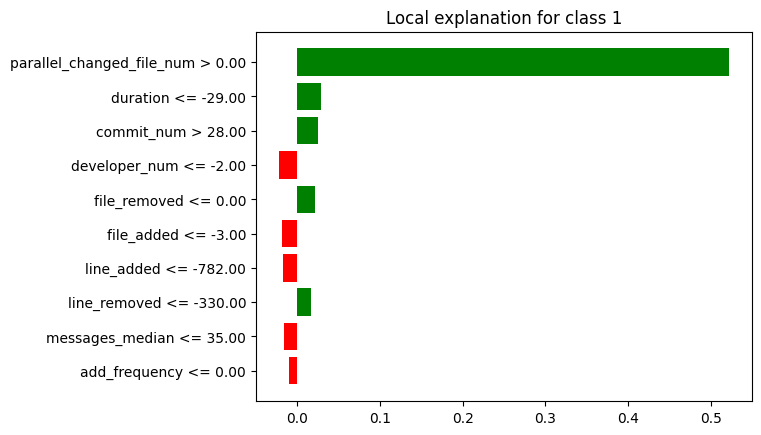

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                 line_added        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                 commit_num        3  Positivo
3               file_removed        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4               file_removed        5  Positivo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'line_added', 'file_modified']
['parallel_changed_file_num', 'line_removed', 'commit_num', 'file_removed', 'file_modified']
['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       4  Positivo       5   
2                   duration         -         -       -         -       2   
3                 line_added         4  Positivo       -         -       -   
4              file_modified         5  Positivo       5  Positivo       -   
5                 commit_num         2  Positivo       3  Positivo       3   
6              developer_num         3  Positivo       -         -       4   
7               line_removed         -         -       2  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4         -  
5  Positivo  
6  Negativo  
7         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "line_added", "file_modified", "line_removed", "file_removed", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       3  Positivo       3   
developer_num                     3  Positivo       -         -       4   
line_added                        4  Positivo       -         -       -   
file_modified                     5  Positivo       5  Positivo       -   
line_removed                      -         -       2  Positivo       -   
file_removed                      -         -       4  Positivo       5   
duration                          -         -       -         -       2   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
developer_num              Negativo  
line_added                        -  
file_modified                     -  
line_removed                      -  
file_removed               Positivo  
duration                   Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

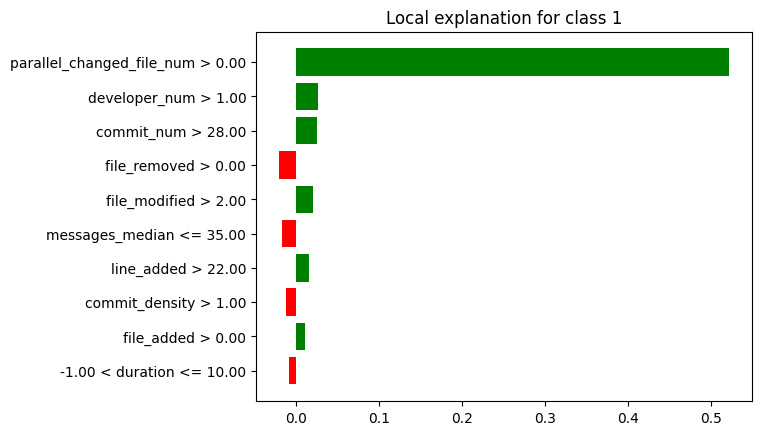

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              file_modified        4  Positivo
4                 file_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3              developer_num        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3               file_removed        4  Negativo
4              file_modified        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_modified', 'file_added']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'developer_num', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'file_removed', 'file_modified']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       -         -       4   
2              file_modified         4  Positivo       5  Positivo       5   
3                 file_added         5  Negativo       -         -       -   
4                 commit_num         2  Positivo       2  Positivo       3   
5              developer_num         -         -       4  Positivo       2   
6               line_removed         3  Positivo       3  Positivo       -   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3         -  
4  Positivo  
5  Positivo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "file_modified", "file_added", "developer_num", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       3   
line_removed                      3  Positivo       3  Positivo       -   
file_modified                     4  Positivo       5  Positivo       5   
file_added                        5  Negativo       -         -       -   
developer_num                     -         -       4  Positivo       2   
file_removed                      -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed                      -  
file_modified              Positivo  
file_added                        -  
developer_num              Positivo  
file_removed               Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

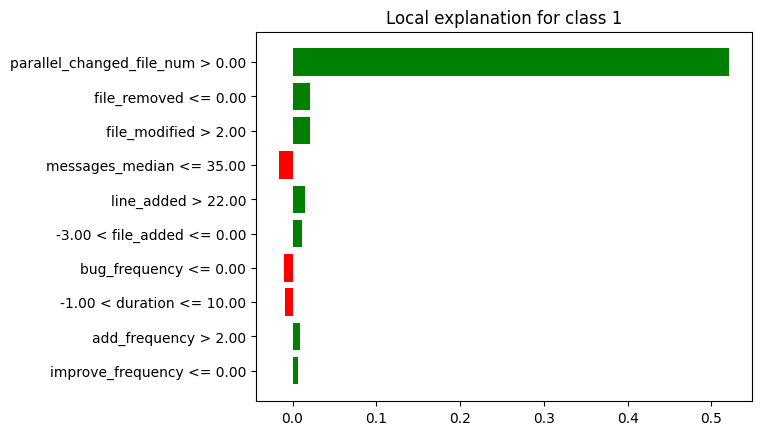

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1          feature_frequency        2  Negativo
2              add_frequency        3  Negativo
3                 line_added        4  Negativo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              add_frequency        2  Negativo
2          feature_frequency        3  Negativo
3               line_removed        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2              file_modified        3  Positivo
3            messages_median        4  Negativo
4                 line_added        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'feature_frequency', 'add_frequency', 'line_added', 'file_removed']
['parallel_changed_file_num', 'add_frequency', 'feature_frequency', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'messages_median', 'line_added']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'line_added', 'feature_frequency', 'add_frequency', 'developer_num', 'messages_median', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         5  Negativo       -         -       2   
2              file_modified         -         -       -         -       3   
3                 line_added         4  Negativo       -         -       5   
4          feature_frequency         2  Negativo       3  Negativo       -   
5              add_frequency         3  Negativo       2  Negativo       -   
6              developer_num         -         -       5  Positivo       -   
7            messages_median         -         -       -         -       4   
8               line_removed         -         -       4  Negativo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3  Positivo  
4         -  
5         -  
6         -  
7  Negativo  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "feature_frequency", "add_frequency", "line_added", "file_removed", "line_removed", "developer_num", "file_modified", "messages_median"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
feature_frequency                 2  Negativo       3  Negativo       -   
add_frequency                     3  Negativo       2  Negativo       -   
line_added                        4  Negativo       -         -       5   
file_removed                      5  Negativo       -         -       2   
line_removed                      -         -       4  Negativo       -   
developer_num                     -         -       5  Positivo       -   
file_modified                     -         -       -         -       3   
messages_median                   -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
feature_frequency                 -  
add_frequency                     -  
line_added                 Positivo  
file_removed               Positivo  
line_removed                      -  
developer_num                     -  
file_modified              Positivo  
messages_median            Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('line_added', 4), ('file_modified', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_modified', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('feature_frequency', 2), ('add_frequency', 3), ('line_added', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 3), ('file_modified', 5), ('line_removed', 2), ('file_removed', 4), ('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_modified', 5), ('developer_num', 4), ('parallel_changed_file_num', 1), ('feature_frequency', 3), ('add_frequency', 2), ('line_removed', 4), ('developer_num', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 4), ('file_removed', 5), ('duration', 2), ('parallel_changed_file_num', 1), ('commit_num', 3), ('file_modified', 5), ('developer_num', 2), ('file_removed', 4), ('parallel_changed

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      3   
messages_median                       -      -             -      -   
developer_num                       3.0      1           4.5      2   
add_frequency                       3.0      1           2.0      1   
commit_num                          2.0      2           2.5      2   
file_added                          5.0      1             -      -   
line_added                          4.0      2             -      -   
file_modified                       4.5      2           5.0      2   
feature_frequency                   2.0      1           3.0      1   
duration                              -      -             -      -   
file_removed                        5.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                          -      -  
messages_median                     4.0      1  
developer_num                       3.0      2  
add_frequency                         -      -  
commit_num                          3.0      2  
file_added                            -      -  
line_added                          5.0      1  
file_modified                       4.0      2  
feature_frequency                     -      -  
duration                            2.0      1  
file_removed                   3.666667      3  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fp[("General", "Conteo Total")] = df_resumen_brf_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      3   
messages_median                       -      -             -      -   
developer_num                       3.0      1           4.5      2   
add_frequency                       3.0      1           2.0      1   
commit_num                          2.0      2           2.5      2   
file_added                          5.0      1             -      -   
line_added                          4.0      2             -      -   
file_modified                       4.5      2           5.0      2   
feature_frequency                   2.0      1           3.0      1   
duration                              -      -             -      -   
file_removed                        5.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                          -      -  3.000000            4  
messages_median                     4.0      1  4.000000            1  
developer_num                       3.0      2  3.500000            5  
add_frequency                         -      -  2.500000            2  
commit_num                          3.0      2  2.500000            6  
file_added                            -      -  5.000000            1  
line_added                          5.0      1  4.500000            3  
file_modified                       4.0      2  4.500000            6  
feature_frequency                     -      -  2.500000            2  
duration                            2.0      1  2.000000            1  
file_removed                   3.666667      3  4.222222            5  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fp[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fp[("General", "Peso Conteo")] = df_resumen_brf_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fp[("General", "Puntaje")] = df_resumen_brf_fp[("General", "Peso Rango")] + df_resumen_brf_fp[("General", "Peso Conteo")]
df_resumen_brf_fp[("General", "Ranking")] = df_resumen_brf_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      3   
messages_median                       -      -             -      -   
developer_num                       3.0      1           4.5      2   
add_frequency                       3.0      1           2.0      1   
commit_num                          2.0      2           2.5      2   
file_added                          5.0      1             -      -   
line_added                          4.0      2             -      -   
file_modified                       4.5      2           5.0      2   
feature_frequency                   2.0      1           3.0      1   
duration                              -      -             -      -   
file_removed                        5.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                          -      -     4.0            4  
messages_median                     4.0      1    11.0            1  
developer_num                       3.0      2     3.0            5  
add_frequency                         -      -     5.0            2  
commit_num                          3.0      2     2.0            6  
file_added                            -      -    12.0            1  
line_added                          5.0      1    10.0            3  
file_modified                       4.0      2     7.0            6  
feature_frequency                     -      -     5.0            2  
duration                            2.0      1     8.0            1  
file_removed                   3.666667      3     9.0            5  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fp = df_resumen_brf_fp[new_columns]

In [ ]:
df_resumen_brf_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fp[(tech, "Ranking Medio")] = df_resumen_brf_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            6          2.00      2   
developer_num                 3.0            5          3.00      1   
line_removed                  4.0            4          3.00      1   
add_frequency                 5.0            2          3.00      1   
feature_frequency             5.0            2          2.00      1   
file_modified                 7.0            6          4.50      2   
duration                      8.0            1             -      -   
file_removed                  9.0            5          5.00      1   
line_added                   10.0            3          4.00      2   
messages_median              11.0            1             -      -   
file_added                   12.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         2.50      2          3.00      2  
developer_num                      4.50      2          3.00      2  
line_removed                       3.00      3             -      -  
add_frequency                      2.00      1             -      -  
feature_frequency                  3.00      1             -      -  
file_modified                      5.00      2          4.00      2  
duration                              -      -          2.00      1  
file_removed                       4.00      1          3.67      3  
line_added                            -      -          5.00      1  
messages_median                       -      -          4.00      1  
file_added                            -      -             -      -

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

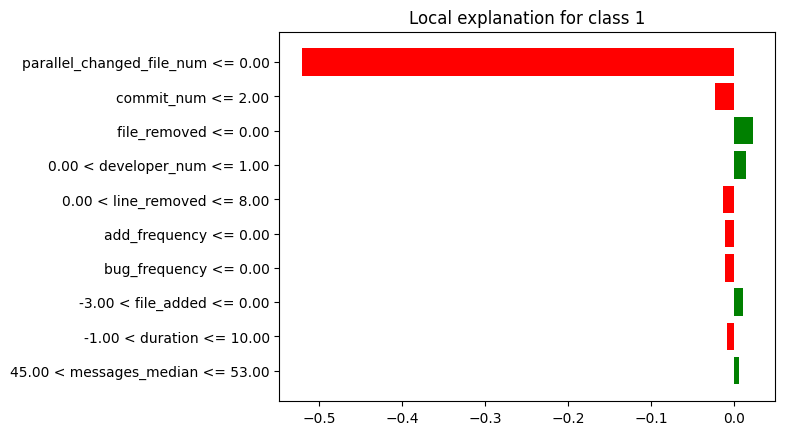

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[3, 'Variable'] = 'developer_num'
lime_fn_df_max.at[4, 'Variable'] = 'line_removed'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               file_removed        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               line_removed        3  Negativo
3              developer_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2               file_removed        3  Positivo
3              developer_num        4  Positivo
4               line_removed        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'line_added']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_removed', 'developer_num', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'line_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         4  Negativo       5  Negativo       3   
2                 line_added         5  Positivo       -         -       -   
3                 commit_num         2  Negativo       2  Negativo       2   
4              developer_num         3  Positivo       4  Positivo       4   
5               line_removed         -         -       3  Negativo       5   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Negativo  
4  Positivo  
5  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_removed", "line_added", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
developer_num                     3  Positivo       4  Positivo       4   
file_removed                      4  Negativo       5  Negativo       3   
line_added                        5  Positivo       -         -       -   
line_removed                      -         -       3  Negativo       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Positivo  
file_removed               Positivo  
line_added                        -  
line_removed               Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

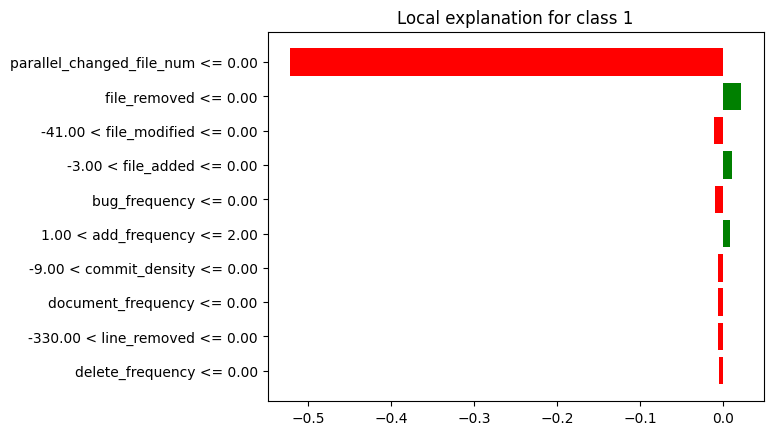

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'file_modified'
lime_fn_df_mediana.at[3, 'Variable'] = 'file_added'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4               line_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                 file_added        3  Positivo
3              developer_num        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              file_modified        3  Negativo
3                 file_added        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'file_removed', 'commit_num', 'developer_num', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'file_added', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'file_added', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'bug_frequency', 'file_modified', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         2  Positivo       2  Positivo       2   
2              bug_frequency         -         -       -         -       5   
3              file_modified         -         -       -         -       3   
4                 file_added         -         -       3  Positivo       4   
5                 commit_num         3  Positivo       5  Positivo       -   
6              developer_num         4  Positivo       4  Positivo       -   
7               line_removed         5  Positivo       -         -       -   

             
      Signo  
0  Negativo  
1  Positivo  
2  Negativo  
3  Negativo  
4  Positivo  
5         -  
6         -  
7         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "commit_num", "developer_num", "line_removed", "file_added", "file_modified", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_removed                      2  Positivo       2  Positivo       2   
commit_num                        3  Positivo       5  Positivo       -   
developer_num                     4  Positivo       4  Positivo       -   
line_removed                      5  Positivo       -         -       -   
file_added                        -         -       3  Positivo       4   
file_modified                     -         -       -         -       3   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_removed               Positivo  
commit_num                        -  
developer_num                     -  
line_removed                      -  
file_added                 Positivo  
file_modified              Negativo  
bug_frequency              Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

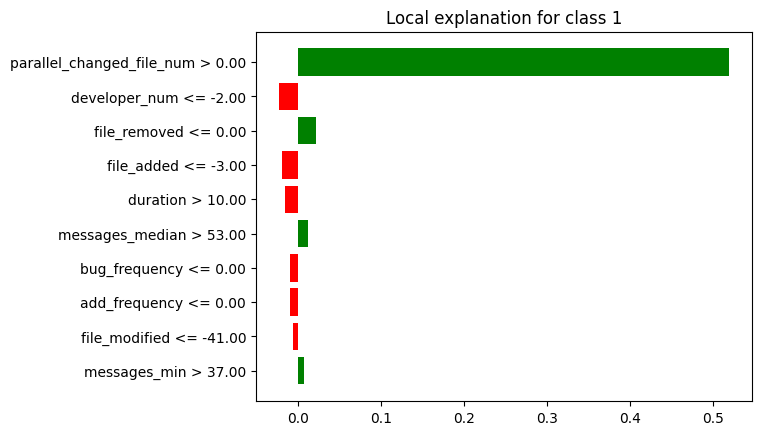

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2              developer_num        3  Negativo
3               line_removed        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 commit_num        3  Positivo
3               line_removed        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               file_removed        3  Positivo
3                 file_added        4  Negativo
4                   duration        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'duration', 'developer_num', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_removed', 'duration']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'file_added', 'duration']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       -         -       3   
2                   duration         2  Negativo       5  Negativo       5   
3                 file_added         -         -       -         -       4   
4                 commit_num         5  Positivo       3  Positivo       -   
5              developer_num         3  Negativo       2  Negativo       2   
6               line_removed         4  Negativo       4  Negativo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3  Negativo  
4         -  
5  Negativo  
6         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "developer_num", "line_removed", "commit_num", "file_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Negativo       5  Negativo       5   
developer_num                     3  Negativo       2  Negativo       2   
line_removed                      4  Negativo       4  Negativo       -   
commit_num                        5  Positivo       3  Positivo       -   
file_removed                      -         -       -         -       3   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Negativo  
developer_num              Negativo  
line_removed                      -  
commit_num                        -  
file_removed               Positivo  
file_added                 Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_removed', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_num', 3), ('developer_num', 4), ('line_removed', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('line_removed', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_removed', 5), ('line_removed', 3), ('parallel_changed_file_num', 1), ('file_removed', 2), ('commit_num', 5), ('developer_num', 4), ('file_added', 3), ('parallel_changed_file_num', 1), ('duration', 5), ('developer_num', 2), ('line_removed', 4), ('commit_num', 3)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 4), ('file_removed', 3), ('line_removed', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('file_added', 4), ('file_modified', 3), ('bug_frequency', 5), ('parallel_changed_file_num', 1), ('d

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_brf_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.5      2           3.5      2   
developer_num                  3.333333      3      3.333333      3   
commit_num                     3.333333      3      3.333333      3   
file_added                            -      -           3.0      1   
line_added                          5.0      1             -      -   
file_modified                         -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            2.0      1           5.0      1   
file_removed                        3.0      2           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                        5.0      1  
developer_num                       3.0      2  
commit_num                          2.0      1  
file_added                          4.0      2  
line_added                            -      -  
file_modified                       3.0      1  
bug_frequency                       5.0      1  
duration                            5.0      1  
file_removed                   2.666667      3  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_brf_fn[("General", "Conteo Total")] = df_resumen_brf_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.5      2           3.5      2   
developer_num                  3.333333      3      3.333333      3   
commit_num                     3.333333      3      3.333333      3   
file_added                            -      -           3.0      1   
line_added                          5.0      1             -      -   
file_modified                         -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            2.0      1           5.0      1   
file_removed                        3.0      2           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                        5.0      1  4.333333            5  
developer_num                       3.0      2  3.222222            8  
commit_num                          2.0      1  2.888889            7  
file_added                          4.0      2  3.500000            3  
line_added                            -      -  5.000000            1  
file_modified                       3.0      1  3.000000            1  
bug_frequency                       5.0      1  5.000000            1  
duration                            5.0      1  4.000000            3  
file_removed                   2.666667      3  3.055556            7  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_brf_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_brf_fn[("General", "Peso Rango")] = 1 - ((df_resumen_brf_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_brf_fn[("General", "Peso Conteo")] = df_resumen_brf_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_brf_fn[("General", "Puntaje")] = df_resumen_brf_fn[("General", "Peso Rango")] + df_resumen_brf_fn[("General", "Peso Conteo")]
df_resumen_brf_fn[("General", "Ranking")] = df_resumen_brf_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_brf_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_brf_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_brf_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.5      2           3.5      2   
developer_num                  3.333333      3      3.333333      3   
commit_num                     3.333333      3      3.333333      3   
file_added                            -      -           3.0      1   
line_added                          5.0      1             -      -   
file_modified                         -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            2.0      1           5.0      1   
file_removed                        3.0      2           3.5      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                        5.0      1     7.0            5  
developer_num                       3.0      2     3.0            8  
commit_num                          2.0      1     2.0            7  
file_added                          4.0      2     6.0            3  
line_added                            -      -     9.0            1  
file_modified                       3.0      1     5.0            1  
bug_frequency                       5.0      1     9.0            1  
duration                            5.0      1     8.0            3  
file_removed                   2.666667      3     4.0            7  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_brf_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_brf_fn = df_resumen_brf_fn[new_columns]

In [ ]:
df_resumen_brf_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_brf_fn[(tech, "Ranking Medio")] = df_resumen_brf_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_brf_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            7          3.33      3   
developer_num                 3.0            8          3.33      3   
file_removed                  4.0            7          3.00      2   
file_modified                 5.0            1             -      -   
file_added                    6.0            3             -      -   
line_removed                  7.0            5          4.50      2   
duration                      8.0            3          2.00      1   
line_added                    9.0            1          5.00      1   
bug_frequency                 9.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.33      3          2.00      1  
developer_num                      3.33      3          3.00      2  
file_removed                       3.50      2          2.67      3  
file_modified                         -      -          3.00      1  
file_added                         3.00      1          4.00      2  
line_removed                       3.50      2          5.00      1  
duration                           5.00      1          5.00      1  
line_added                            -      -             -      -  
bug_frequency                         -      -          5.00      1

## **GradientBoosting:**

**FEATURE IMPORTANCE**

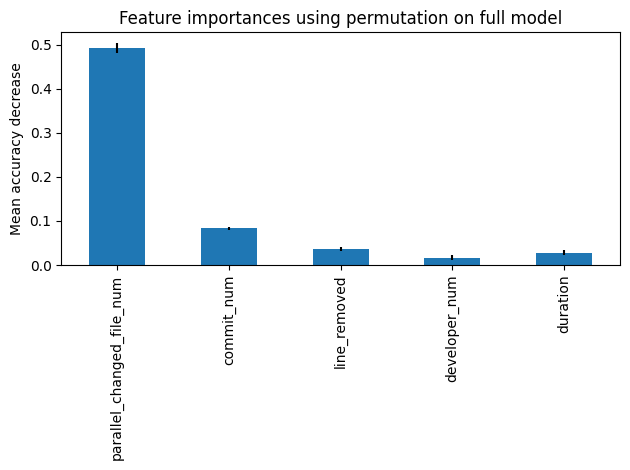

In [ ]:
permu = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

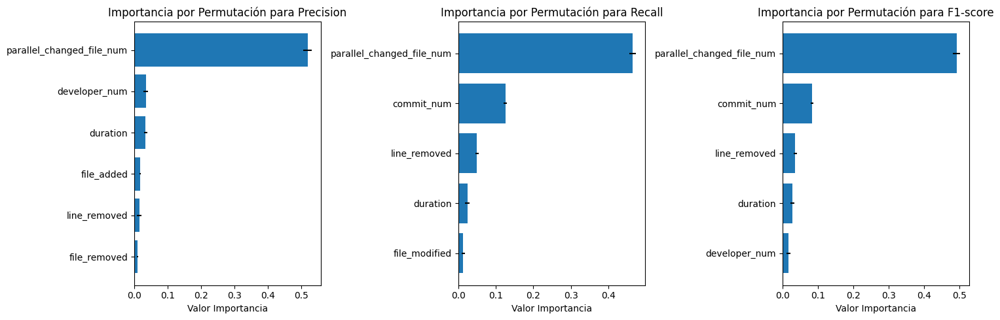

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_gb = {}

permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_gb[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_gb['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.518265,0.013394
4,developer_num,0.034541,0.006125
5,duration,0.034085,0.005487
1,file_added,0.017693,0.002219
3,line_removed,0.015047,0.006311
2,file_removed,0.010154,0.002480


In [ ]:
results_global_gb['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.465658,0.008849
1,commit_num,0.125194,0.004097
3,line_removed,0.049507,0.004706
4,duration,0.023751,0.006061
2,file_modified,0.012984,0.005018


In [ ]:
results_global_gb['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.492446,0.010590
1,commit_num,0.083165,0.004222
2,line_removed,0.035971,0.004654
4,duration,0.028294,0.005394
3,developer_num,0.016750,0.005613


In [ ]:
scoring = ['accuracy', 'precision', 'recall','f1']
permu_score = permutation_importance(modelo_gb, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for metric in permu_score:
  print(f"\nUsando como referencia: {metric}\n")
  permu = permu_score[metric]
  for i in permu.importances_mean.argsort()[::-1]:
    if abs(permu.importances_mean[i].round(3)) > 0.000:
      print(f"    {feature_names[i]:<30}"
      f"{permu.importances_mean[i]:.3f}"
      f" +/- {permu.importances_std[i]:.3f}")


Usando como referencia: accuracy

    parallel_changed_file_num     0.071 +/- 0.002
    commit_num                    0.006 +/- 0.001
    duration                      0.005 +/- 0.001
    developer_num                 0.005 +/- 0.001
    line_removed                  0.004 +/- 0.001
    file_added                    0.001 +/- 0.000
    file_removed                  0.001 +/- 0.000
    line_added                    0.001 +/- 0.001
    file_modified                 0.001 +/- 0.001
    messages_median               0.001 +/- 0.001

Usando como referencia: precision

    parallel_changed_file_num     0.518 +/- 0.013
    developer_num                 0.035 +/- 0.006
    duration                      0.034 +/- 0.005
    file_added                    0.018 +/- 0.002
    line_removed                  0.015 +/- 0.006
    file_removed                  0.010 +/- 0.002
    line_added                    0.006 +/- 0.004
    commit_num                    0.005 +/- 0.006
    messages_median          

**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_gb, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 35239 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 35239 values
  -> model_class       : sklearn.ensemble._gb.GradientBoostingClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5310c49b40> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 4.65e-05, mean = 0.0941, max = 0.995
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.749, mean = -2.36e-05, max = 0.953
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

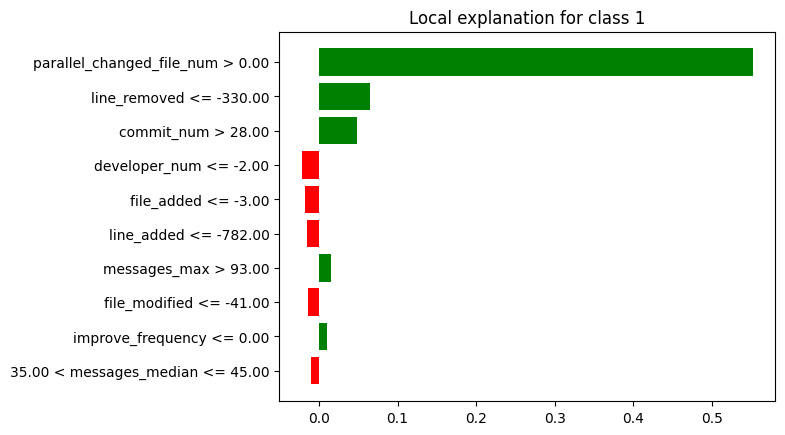

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2              file_modified        3  Positivo
3                 commit_num        4  Positivo
4               messages_max        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Negativo
4                 file_added        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'line_removed', 'file_modified', 'commit_num', 'messages_max']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'file_modified']
['parallel_changed_file_num', 'line_removed', 'commit_num', 'developer_num', 'file_added']
['parallel_changed_file_num', 'messages_max', 'file_removed', 'file_modified', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               messages_max         5  Positivo       -         -       -   
2               file_removed         -         -       4  Positivo       -   
3              file_modified         3  Positivo       5  Positivo       -   
4                 file_added         -         -       -         -       5   
5                 commit_num         4  Positivo       2  Positivo       3   
6              developer_num         -         -       -         -       4   
7               line_removed         2  Positivo       3  Positivo       2   

             
      Signo  
0  Positivo  
1         -  
2         -  
3         -  
4  Negativo  
5  Positivo  
6  Negativo  
7  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "file_modified", "commit_num", "messages_max", "file_removed", "developer_num", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Positivo       3  Positivo       2   
file_modified                     3  Positivo       5  Positivo       -   
commit_num                        4  Positivo       2  Positivo       3   
messages_max                      5  Positivo       -         -       -   
file_removed                      -         -       4  Positivo       -   
developer_num                     -         -       -         -       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed               Positivo  
file_modified                     -  
commit_num                 Positivo  
messages_max                      -  
file_removed                      -  
developer_num              Negativo  
file_added                 Negativo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

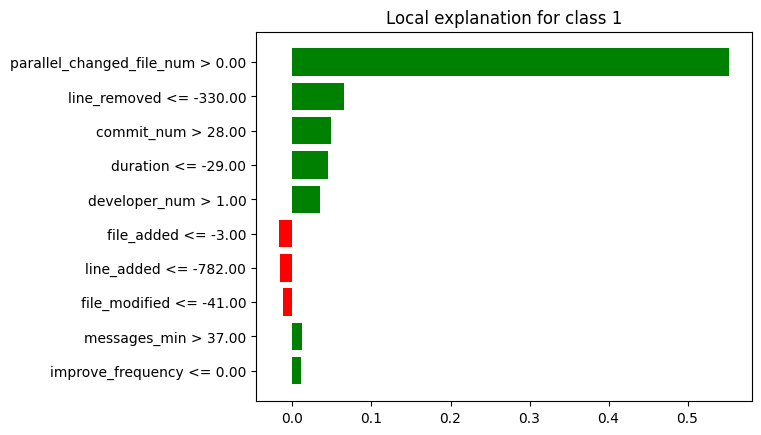

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                   duration        3  Positivo
3               messages_max        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                   duration        3  Positivo
3               line_removed        4  Positivo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                 commit_num        3  Positivo
3                   duration        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'line_removed', 'duration', 'messages_max', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'duration', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'line_removed', 'commit_num', 'duration', 'developer_num']
['parallel_changed_file_num', 'messages_max', 'duration', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               messages_max         4  Positivo       -         -       -   
2                   duration         3  Positivo       3  Positivo       4   
3                 commit_num         -         -       2  Positivo       3   
4              developer_num         5  Positivo       5  Positivo       5   
5               line_removed         2  Positivo       4  Positivo       2   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3  Positivo  
4  Positivo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "duration", "messages_max", "developer_num", "commit_num"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Positivo       4  Positivo       2   
duration                          3  Positivo       3  Positivo       4   
messages_max                      4  Positivo       -         -       -   
developer_num                     5  Positivo       5  Positivo       5   
commit_num                        -         -       2  Positivo       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed               Positivo  
duration                   Positivo  
messages_max                      -  
developer_num              Positivo  
commit_num                 Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

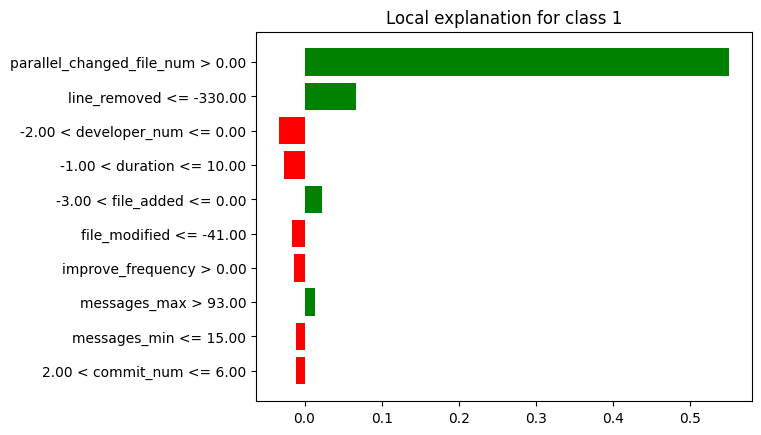

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[2, 'Variable'] = 'developer_num'
lime_vp_df_min.at[3, 'Variable'] = 'duration'
lime_vp_df_min.at[4, 'Variable'] = 'file_added'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2              file_modified        3  Negativo
3              developer_num        4  Negativo
4              add_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2              file_modified        3  Negativo
3         refactor_frequency        4  Negativo
4               messages_max        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2              developer_num        3  Negativo
3                   duration        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'line_removed', 'file_modified', 'developer_num', 'add_frequency']
['parallel_changed_file_num', 'line_removed', 'file_modified', 'refactor_frequency', 'messages_max']
['parallel_changed_file_num', 'line_removed', 'developer_num', 'duration', 'file_added']
['parallel_changed_file_num', 'messages_max', 'refactor_frequency', 'duration', 'file_modified', 'file_added', 'add_frequency', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               messages_max         -         -       5  Positivo       -   
2         refactor_frequency         -         -       4  Negativo       -   
3                   duration         -         -       -         -       4   
4              file_modified         3  Negativo       3  Negativo       -   
5                 file_added         -         -       -         -       5   
6              add_frequency         5  Negativo       -         -       -   
7              developer_num         4  Negativo       -         -       3   
8               line_removed         2  Positivo       2  Positivo       2   

             
      Signo  
0  Positivo  
1         -  
2         -  
3  Negativo  
4         -  
5  Positivo  
6         -  
7  Negativo  
8  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "file_modified", "developer_num", "add_frequency", "refactor_frequency", "messages_max", "duration", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Positivo       2  Positivo       2   
file_modified                     3  Negativo       3  Negativo       -   
developer_num                     4  Negativo       -         -       3   
add_frequency                     5  Negativo       -         -       -   
refactor_frequency                -         -       4  Negativo       -   
messages_max                      -         -       5  Positivo       -   
duration                          -         -       -         -       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed               Positivo  
file_modified                     -  
developer_num              Negativo  
add_frequency                     -  
refactor_frequency                -  
messages_max                      -  
duration                   Negativo  
file_added                 Positivo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('line_removed', 2), ('file_modified', 3), ('commit_num', 4), ('messages_max', 5), ('parallel_changed_file_num', 1), ('line_removed', 2), ('duration', 3), ('messages_max', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('line_removed', 2), ('file_modified', 3), ('developer_num', 4), ('add_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('line_removed', 3), ('file_modified', 5), ('commit_num', 2), ('file_removed', 4), ('parallel_changed_file_num', 1), ('line_removed', 4), ('duration', 3), ('developer_num', 5), ('commit_num', 2), ('parallel_changed_file_num', 1), ('line_removed', 2), ('file_modified', 3), ('refactor_frequency', 4), ('messages_max', 5)], 'Lime': [('parallel_changed_file_num', 1), ('line_removed', 2), ('commit_num', 3), ('developer_num', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('line_removed', 2), ('duration', 4), ('developer_num', 5), ('commit_num', 3), ('parallel_changed_file_nu

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        2.0      3           3.0      3   
developer_num                       4.5      2           5.0      1   
add_frequency                       5.0      1             -      -   
commit_num                          4.0      1           2.0      2   
file_added                            -      -             -      -   
file_modified                       3.0      2           4.0      2   
duration                            3.0      1           3.0      1   
refactor_frequency                    -      -           4.0      1   
file_removed                          -      -           4.0      1   
messages_max                        4.5      2           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                        2.0      3  
developer_num                       4.0      3  
add_frequency                         -      -  
commit_num                          3.0      2  
file_added                          5.0      2  
file_modified                         -      -  
duration                            4.0      2  
refactor_frequency                    -      -  
file_removed                          -      -  
messages_max                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vp[("General", "Conteo Total")] = df_resumen_gb_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        2.0      3           3.0      3   
developer_num                       4.5      2           5.0      1   
add_frequency                       5.0      1             -      -   
commit_num                          4.0      1           2.0      2   
file_added                            -      -             -      -   
file_modified                       3.0      2           4.0      2   
duration                            3.0      1           3.0      1   
refactor_frequency                    -      -           4.0      1   
file_removed                          -      -           4.0      1   
messages_max                        4.5      2           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                        2.0      3  2.333333            9  
developer_num                       4.0      3  4.500000            6  
add_frequency                         -      -  5.000000            1  
commit_num                          3.0      2  3.000000            5  
file_added                          5.0      2  5.000000            2  
file_modified                         -      -  3.500000            4  
duration                            4.0      2  3.333333            4  
refactor_frequency                    -      -  4.000000            1  
file_removed                          -      -  4.000000            1  
messages_max                          -      -  4.750000            3  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vp[("General", "Peso Conteo")] = df_resumen_gb_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vp[("General", "Puntaje")] = df_resumen_gb_vp[("General", "Peso Rango")] + df_resumen_gb_vp[("General", "Peso Conteo")]
df_resumen_gb_vp[("General", "Ranking")] = df_resumen_gb_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        2.0      3           3.0      3   
developer_num                       4.5      2           5.0      1   
add_frequency                       5.0      1             -      -   
commit_num                          4.0      1           2.0      2   
file_added                            -      -             -      -   
file_modified                       3.0      2           4.0      2   
duration                            3.0      1           3.0      1   
refactor_frequency                    -      -           4.0      1   
file_removed                          -      -           4.0      1   
messages_max                        4.5      2           5.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                        2.0      3     2.0            9  
developer_num                       4.0      3     6.0            6  
add_frequency                         -      -    11.0            1  
commit_num                          3.0      2     3.0            5  
file_added                          5.0      2    10.0            2  
file_modified                         -      -     5.0            4  
duration                            4.0      2     4.0            4  
refactor_frequency                    -      -     8.0            1  
file_removed                          -      -     8.0            1  
messages_max                          -      -     7.0            3  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vp = df_resumen_gb_vp[new_columns]

In [ ]:
df_resumen_gb_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vp[(tech, "Ranking Medio")] = df_resumen_gb_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
line_removed                  2.0            9          2.00      3   
commit_num                    3.0            5          4.00      1   
duration                      4.0            4          3.00      1   
file_modified                 5.0            4          3.00      2   
developer_num                 6.0            6          4.50      2   
messages_max                  7.0            3          4.50      2   
refactor_frequency            8.0            1             -      -   
file_removed                  8.0            1             -      -   
file_added                   10.0            2             -      -   
add_frequency                11.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
line_removed                       3.00      3          2.00      3  
commit_num                         2.00      2          3.00      2  
duration                           3.00      1          4.00      2  
file_modified                      4.00      2             -      -  
developer_num                      5.00      1          4.00      3  
messages_max                       5.00      1             -      -  
refactor_frequency                 4.00      1             -      -  
file_removed                       4.00      1             -      -  
file_added                            -      -          5.00      2  
add_frequency                         -      -             -      -

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

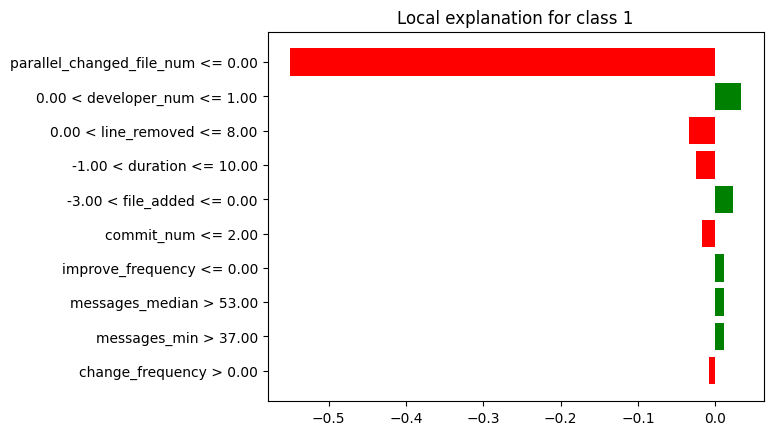

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[1, 'Variable'] = 'developer_num'
lime_vn_df_max.at[2, 'Variable'] = 'line_removed'
lime_vn_df_max.at[3, 'Variable'] = 'duration'
lime_vn_df_max.at[4, 'Variable'] = 'file_added'


print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 line_added        2  Positivo
2                   duration        3  Negativo
3              developer_num        4  Positivo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2                 commit_num        3  Negativo
3               line_removed        4  Negativo
4                   duration        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2               line_removed        3  Negativo
3                   duration        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'line_added', 'duration', 'developer_num', 'file_added']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'line_removed', 'duration']
['parallel_changed_file_num', 'developer_num', 'line_removed', 'duration', 'file_added']
['parallel_changed_file_num', 'duration', 'line_added', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1                   duration         3  Negativo       5  Negativo       4   
2                 line_added         2  Positivo       -         -       -   
3                 file_added         5  Positivo       -         -       5   
4                 commit_num         -         -       3  Negativo       -   
5              developer_num         4  Positivo       2  Positivo       2   
6               line_removed         -         -       4  Negativo       3   

             
      Signo  
0  Negativo  
1  Negativo  
2         -  
3  Positivo  
4         -  
5  Positivo  
6  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_added", "duration", "developer_num", "file_added", "commit_num", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
line_added                        2  Positivo       -         -       -   
duration                          3  Negativo       5  Negativo       4   
developer_num                     4  Positivo       2  Positivo       2   
file_added                        5  Positivo       -         -       5   
commit_num                        -         -       3  Negativo       -   
line_removed                      -         -       4  Negativo       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
line_added                        -  
duration                   Negativo  
developer_num              Positivo  
file_added                 Positivo  
commit_num                        -  
line_removed               Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

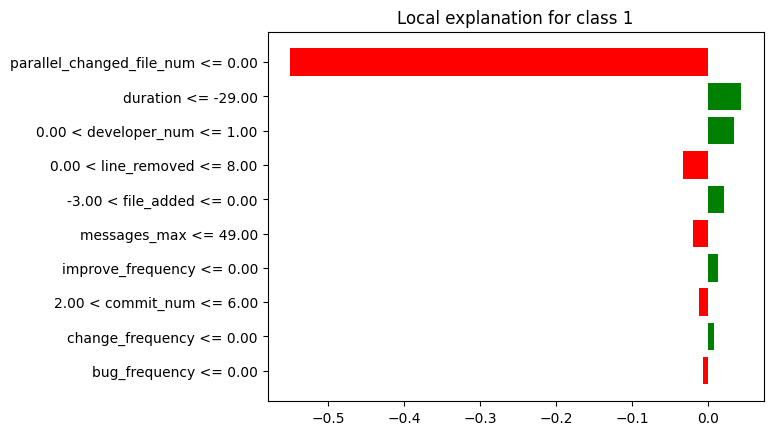

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[2, 'Variable'] = 'developer_num'
lime_vn_df_mediana.at[3, 'Variable'] = 'line_removed'
lime_vn_df_mediana.at[4, 'Variable'] = 'file_added'


print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2               line_removed        3  Negativo
3                 commit_num        4  Negativo
4            messages_median        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4                 commit_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3               line_removed        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'duration', 'line_removed', 'commit_num', 'messages_median']
['parallel_changed_file_num', 'duration', 'developer_num', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'duration', 'developer_num', 'line_removed', 'file_added']
['parallel_changed_file_num', 'duration', 'file_added', 'commit_num', 'developer_num', 'messages_median', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1                   duration         2  Positivo       2  Positivo       2   
2                 file_added         -         -       -         -       5   
3                 commit_num         4  Negativo       5  Negativo       -   
4              developer_num         -         -       3  Positivo       3   
5            messages_median         5  Negativo       -         -       -   
6               line_removed         3  Negativo       4  Negativo       4   

             
      Signo  
0  Negativo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5         -  
6  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "line_removed", "commit_num", "messages_median", "developer_num", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
duration                          2  Positivo       2  Positivo       2   
line_removed                      3  Negativo       4  Negativo       4   
commit_num                        4  Negativo       5  Negativo       -   
messages_median                   5  Negativo       -         -       -   
developer_num                     -         -       3  Positivo       3   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
duration                   Positivo  
line_removed               Negativo  
commit_num                        -  
messages_median                   -  
developer_num              Positivo  
file_added                 Positivo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

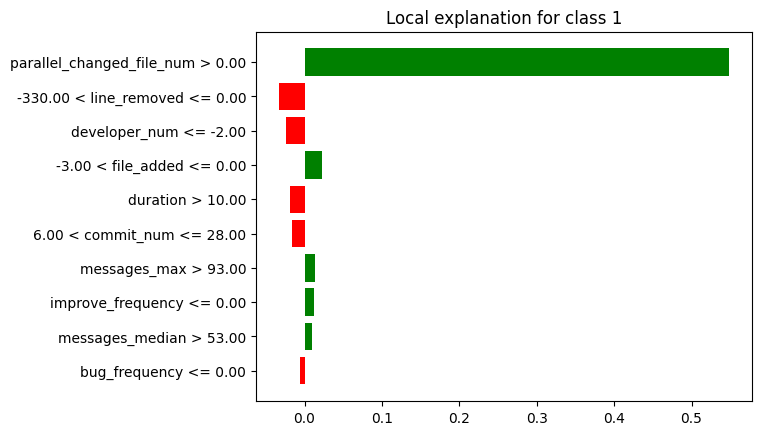

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[1, 'Variable'] = 'line_removed'
lime_vn_df_min.at[3, 'Variable'] = 'file_added'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               messages_max        2  Positivo
2              developer_num        3  Negativo
3                   duration        4  Negativo
4            messages_median        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               messages_max        3  Positivo
3                   duration        4  Negativo
4                 line_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                   duration        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'messages_max', 'developer_num', 'duration', 'messages_median']
['parallel_changed_file_num', 'developer_num', 'messages_max', 'duration', 'line_added']
['parallel_changed_file_num', 'line_removed', 'developer_num', 'file_added', 'duration']
['parallel_changed_file_num', 'messages_max', 'duration', 'line_added', 'file_added', 'developer_num', 'messages_median', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               messages_max         2  Positivo       3  Positivo       -   
2                   duration         4  Negativo       4  Negativo       5   
3                 line_added         -         -       5  Positivo       -   
4                 file_added         -         -       -         -       4   
5              developer_num         3  Negativo       2  Negativo       3   
6            messages_median         5  Negativo       -         -       -   
7               line_removed         -         -       -         -       2   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3         -  
4  Positivo  
5  Negativo  
6         -  
7  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "messages_max", "developer_num", "duration", "messages_median", "line_added", "line_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
messages_max                      2  Positivo       3  Positivo       -   
developer_num                     3  Negativo       2  Negativo       3   
duration                          4  Negativo       4  Negativo       5   
messages_median                   5  Negativo       -         -       -   
line_added                        -         -       5  Positivo       -   
line_removed                      -         -       -         -       2   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
messages_max                      -  
developer_num              Negativo  
duration                   Negativo  
messages_median                   -  
line_added                        -  
line_removed               Negativo  
file_added                 Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('line_added', 2), ('duration', 3), ('developer_num', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('line_removed', 3), ('commit_num', 4), ('messages_median', 5), ('parallel_changed_file_num', 1), ('messages_max', 2), ('developer_num', 3), ('duration', 4), ('messages_median', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('duration', 5), ('developer_num', 2), ('commit_num', 3), ('line_removed', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('line_removed', 4), ('commit_num', 5), ('developer_num', 3), ('parallel_changed_file_num', 1), ('messages_max', 3), ('developer_num', 2), ('duration', 4), ('line_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('duration', 4), ('developer_num', 2), ('file_added', 5), ('line_removed', 3), ('parallel_changed_file_num', 1), ('duration', 2), ('line_removed', 4), ('developer_num', 3), ('file_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 3

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           4.0      2   
messages_median                     5.0      2             -      -   
developer_num                       3.5      2      2.333333      3   
commit_num                          4.0      1           4.0      2   
file_added                          5.0      1             -      -   
line_added                          2.0      1           5.0      1   
duration                            3.0      3      3.666667      3   
messages_max                        2.0      1           3.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                        3.0      3  
messages_median                       -      -  
developer_num                  2.666667      3  
commit_num                            -      -  
file_added                     4.666667      3  
line_added                            -      -  
duration                       3.666667      3  
messages_max                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_vn[("General", "Conteo Total")] = df_resumen_gb_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           4.0      2   
messages_median                     5.0      2             -      -   
developer_num                       3.5      2      2.333333      3   
commit_num                          4.0      1           4.0      2   
file_added                          5.0      1             -      -   
line_added                          2.0      1           5.0      1   
duration                            3.0      3      3.666667      3   
messages_max                        2.0      1           3.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                        3.0      3  3.333333            6  
messages_median                       -      -  5.000000            2  
developer_num                  2.666667      3  2.833333            8  
commit_num                            -      -  4.000000            3  
file_added                     4.666667      3  4.833333            4  
line_added                            -      -  3.500000            2  
duration                       3.666667      3  3.444444            9  
messages_max                          -      -  2.500000            2  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_vn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_vn[("General", "Peso Conteo")] = df_resumen_gb_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_vn[("General", "Puntaje")] = df_resumen_gb_vn[("General", "Peso Rango")] + df_resumen_gb_vn[("General", "Peso Conteo")]
df_resumen_gb_vn[("General", "Ranking")] = df_resumen_gb_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           4.0      2   
messages_median                     5.0      2             -      -   
developer_num                       3.5      2      2.333333      3   
commit_num                          4.0      1           4.0      2   
file_added                          5.0      1             -      -   
line_added                          2.0      1           5.0      1   
duration                            3.0      3      3.666667      3   
messages_max                        2.0      1           3.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                        3.0      3     4.0            6  
messages_median                       -      -     9.0            2  
developer_num                  2.666667      3     2.0            8  
commit_num                            -      -     6.0            3  
file_added                     4.666667      3     6.0            4  
line_added                            -      -     8.0            2  
duration                       3.666667      3     3.0            9  
messages_max                          -      -     5.0            2  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_vn = df_resumen_gb_vn[new_columns]

In [ ]:
df_resumen_gb_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_vn[(tech, "Ranking Medio")] = df_resumen_gb_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            8          3.50      2   
duration                      3.0            9          3.00      3   
line_removed                  4.0            6          3.00      1   
messages_max                  5.0            2          2.00      1   
commit_num                    6.0            3          4.00      1   
file_added                    6.0            4          5.00      1   
line_added                    8.0            2          2.00      1   
messages_median               9.0            2          5.00      2   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.33      3          2.67      3  
duration                           3.67      3          3.67      3  
line_removed                       4.00      2          3.00      3  
messages_max                       3.00      1             -      -  
commit_num                         4.00      2             -      -  
file_added                            -      -          4.67      3  
line_added                         5.00      1             -      -  
messages_median                       -      -             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

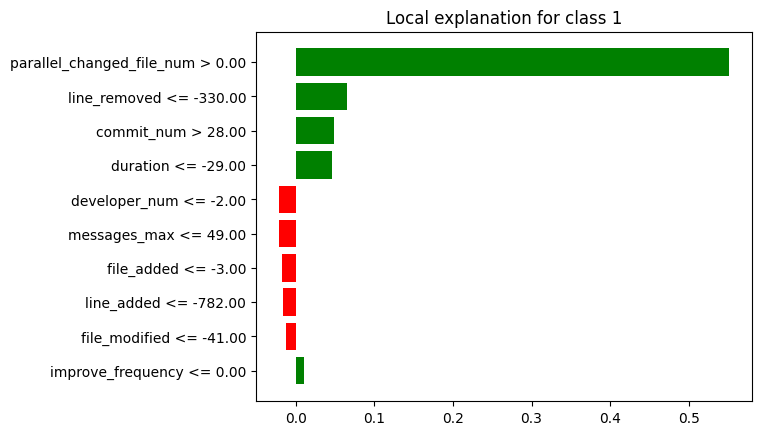

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2              file_modified        3  Positivo
3              developer_num        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              file_modified        3  Positivo
3               line_removed        4  Positivo
4               file_removed        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                 commit_num        3  Positivo
3                   duration        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'line_removed', 'file_modified', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'file_modified', 'line_removed', 'file_removed']
['parallel_changed_file_num', 'line_removed', 'commit_num', 'duration', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         5  Positivo       5  Positivo       -   
2                   duration         -         -       -         -       4   
3              file_modified         3  Positivo       3  Positivo       -   
4                 commit_num         -         -       2  Positivo       3   
5              developer_num         4  Positivo       -         -       5   
6               line_removed         2  Positivo       4  Positivo       2   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3         -  
4  Positivo  
5  Negativo  
6  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "line_removed", "file_modified", "developer_num", "file_removed", "commit_num", "duration"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
line_removed                      2  Positivo       4  Positivo       2   
file_modified                     3  Positivo       3  Positivo       -   
developer_num                     4  Positivo       -         -       5   
file_removed                      5  Positivo       5  Positivo       -   
commit_num                        -         -       2  Positivo       3   
duration                          -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
line_removed               Positivo  
file_modified                     -  
developer_num              Negativo  
file_removed                      -  
commit_num                 Positivo  
duration                   Positivo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

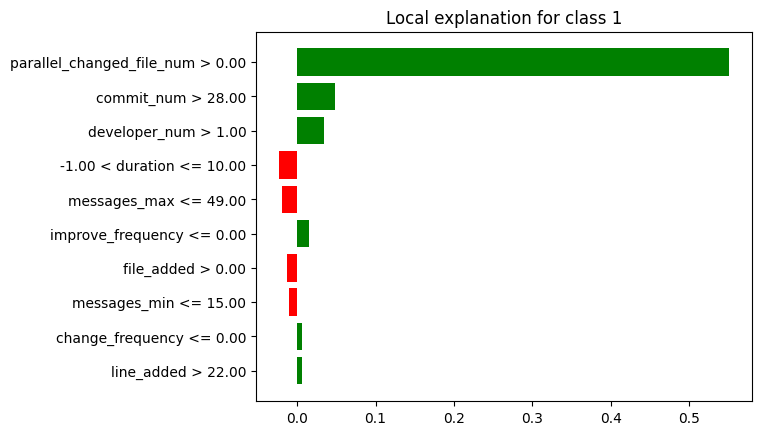

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)
lime_fp_df_mediana.at[3, 'Variable'] = 'duration'

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                   duration        3  Negativo
3                 commit_num        4  Positivo
4              fix_frequency        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2              developer_num        3  Positivo
3                 commit_num        4  Positivo
4               messages_min        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2              developer_num        3  Positivo
3                   duration        4  Negativo
4               messages_max        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'duration', 'commit_num', 'fix_frequency']
['parallel_changed_file_num', 'duration', 'developer_num', 'commit_num', 'messages_min']
['parallel_changed_file_num', 'commit_num', 'developer_num', 'duration', 'messages_max']
['messages_min', 'parallel_changed_file_num', 'messages_max', 'fix_frequency', 'duration', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0               messages_min         -         -       5  Positivo       -   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2               messages_max         -         -       -         -       5   
3              fix_frequency         5  Negativo       -         -       -   
4                   duration         3  Negativo       2  Negativo       4   
5                 commit_num         4  Positivo       4  Positivo       2   
6              developer_num         2  Positivo       3  Positivo       3   

             
      Signo  
0         -  
1  Positivo  
2  Negativo  
3         -  
4  Negativo  
5  Positivo  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "commit_num", "fix_frequency", "messages_min", "messages_max"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       3  Positivo       3   
duration                          3  Negativo       2  Negativo       4   
commit_num                        4  Positivo       4  Positivo       2   
fix_frequency                     5  Negativo       -         -       -   
messages_min                      -         -       5  Positivo       -   
messages_max                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
duration                   Negativo  
commit_num                 Positivo  
fix_frequency                     -  
messages_min                      -  
messages_max               Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

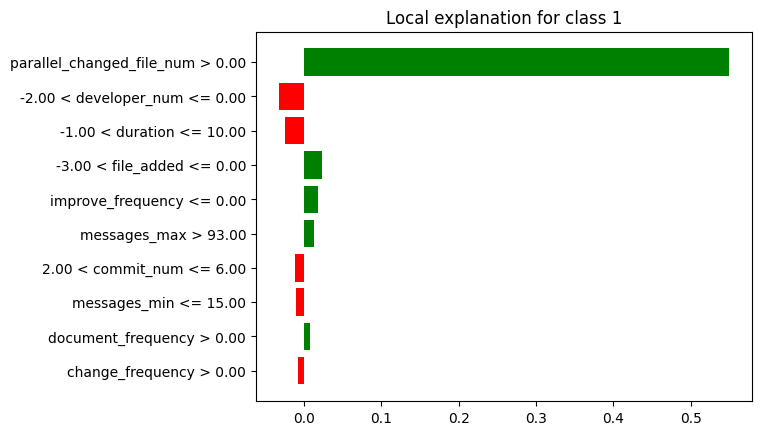

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[1, 'Variable'] = 'developer_num'
lime_fp_df_min.at[2, 'Variable'] = 'duration'
lime_fp_df_min.at[3, 'Variable'] = 'file_added'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2         document_frequency        3  Positivo
3               messages_max        4  Positivo
4              add_frequency        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2               messages_max        3  Positivo
3         document_frequency        4  Positivo
4              add_frequency        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                   duration        3  Negativo
3                 file_added        4  Positivo
4          improve_frequency        5  Positivo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'document_frequency', 'messages_max', 'add_frequency']
['parallel_changed_file_num', 'line_removed', 'messages_max', 'document_frequency', 'add_frequency']
['parallel_changed_file_num', 'developer_num', 'duration', 'file_added', 'improve_frequency']
['parallel_changed_file_num', 'messages_max', 'duration', 'file_added', 'document_frequency', 'add_frequency', 'developer_num', 'improve_frequency', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               messages_max         4  Positivo       3  Positivo       -   
2                   duration         -         -       -         -       3   
3                 file_added         -         -       -         -       4   
4         document_frequency         3  Positivo       4  Positivo       -   
5              add_frequency         5  Positivo       5  Positivo       -   
6              developer_num         2  Negativo       -         -       2   
7          improve_frequency         -         -       -         -       5   
8               line_removed         -         -       2  Negativo       -   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4         -  
5         -  
6  Negativo  
7  Positivo  
8         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "document_frequency", "messages_max", "add_frequency", "line_removed", "duration", "file_added", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       -         -       2   
document_frequency                3  Positivo       4  Positivo       -   
messages_max                      4  Positivo       3  Positivo       -   
add_frequency                     5  Positivo       5  Positivo       -   
line_removed                      -         -       2  Negativo       -   
duration                          -         -       -         -       3   
file_added                        -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
document_frequency                -  
messages_max                      -  
add_frequency                     -  
line_removed                      -  
duration                   Negativo  
file_added                 Positivo  
improve_frequency          Positivo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('line_removed', 2), ('file_modified', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('commit_num', 4), ('fix_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('document_frequency', 3), ('messages_max', 4), ('add_frequency', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('line_removed', 4), ('file_modified', 3), ('file_removed', 5), ('commit_num', 2), ('parallel_changed_file_num', 1), ('developer_num', 3), ('duration', 2), ('commit_num', 4), ('messages_min', 5), ('parallel_changed_file_num', 1), ('document_frequency', 4), ('messages_max', 3), ('add_frequency', 5), ('line_removed', 2)], 'Lime': [('parallel_changed_file_num', 1), ('line_removed', 2), ('developer_num', 5), ('commit_num', 3), ('duration', 4), ('parallel_changed_file_num', 1), ('developer_num', 3), ('duration', 4), ('commit_num', 2), ('messages_max', 5), ('parallel_changed_fi

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                     -      -             -      -   
add_frequency                       5.0      1           5.0      1   
document_frequency                  3.0      1           4.0      1   
file_modified                       3.0      1           3.0      1   
duration                            3.0      1           2.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                          -      -           5.0      1   
line_removed                        2.0      1           3.0      2   
developer_num                  2.666667      3           3.0      1   
commit_num                          4.0      1           3.0      2   
file_added                            -      -             -      -   
fix_frequency                       5.0      1             -      -   
file_removed                        5.0      1           5.0      1   
messages_max                        4.0      1           3.0      1   

                                   Lime         
                          Ranking Medio Conteo  
improve_frequency                   5.0      1  
add_frequency                         -      -  
document_frequency                    -      -  
file_modified                         -      -  
duration                       3.666667      3  
parallel_changed_file_num           1.0      3  
messages_min                          -      -  
line_removed                        2.0      1  
developer_num                  3.333333      3  
commit_num                          2.5      2  
file_added                          4.0      1  
fix_frequency                         -      -  
file_removed                          -      -  
messages_max                        5.0      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fp[("General", "Conteo Total")] = df_resumen_gb_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                     -      -             -      -   
add_frequency                       5.0      1           5.0      1   
document_frequency                  3.0      1           4.0      1   
file_modified                       3.0      1           3.0      1   
duration                            3.0      1           2.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                          -      -           5.0      1   
line_removed                        2.0      1           3.0      2   
developer_num                  2.666667      3           3.0      1   
commit_num                          4.0      1           3.0      2   
file_added                            -      -             -      -   
fix_frequency                       5.0      1             -      -   
file_removed                        5.0      1           5.0      1   
messages_max                        4.0      1           3.0      1   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
improve_frequency                   5.0      1  5.000000            1  
add_frequency                         -      -  5.000000            2  
document_frequency                    -      -  3.500000            2  
file_modified                         -      -  3.000000            2  
duration                       3.666667      3  2.888889            5  
parallel_changed_file_num           1.0      3  1.000000            9  
messages_min                          -      -  5.000000            1  
line_removed                        2.0      1  2.333333            4  
developer_num                  3.333333      3  3.000000            7  
commit_num                          2.5      2  3.166667            5  
file_added                          4.0      1  4.000000            1  
fix_frequency                         -      -  5.000000            1  
file_removed                          -      -  5.000000            2  
messages_max                        5.0      1  4.000000            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fp[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fp[("General", "Peso Conteo")] = df_resumen_gb_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fp[("General", "Puntaje")] = df_resumen_gb_fp[("General", "Peso Rango")] + df_resumen_gb_fp[("General", "Peso Conteo")]
df_resumen_gb_fp[("General", "Ranking")] = df_resumen_gb_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                     -      -             -      -   
add_frequency                       5.0      1           5.0      1   
document_frequency                  3.0      1           4.0      1   
file_modified                       3.0      1           3.0      1   
duration                            3.0      1           2.0      1   
parallel_changed_file_num           1.0      3           1.0      3   
messages_min                          -      -           5.0      1   
line_removed                        2.0      1           3.0      2   
developer_num                  2.666667      3           3.0      1   
commit_num                          4.0      1           3.0      2   
file_added                            -      -             -      -   
fix_frequency                       5.0      1             -      -   
file_removed                        5.0      1           5.0      1   
messages_max                        4.0      1           3.0      1   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
improve_frequency                   5.0      1    12.0            1  
add_frequency                         -      -     9.0            2  
document_frequency                    -      -     8.0            2  
file_modified                         -      -     6.0            2  
duration                       3.666667      3     2.0            5  
parallel_changed_file_num           1.0      3     1.0            9  
messages_min                          -      -    12.0            1  
line_removed                        2.0      1     4.0            4  
developer_num                  3.333333      3     2.0            7  
commit_num                          2.5      2     5.0            5  
file_added                          4.0      1    11.0            1  
fix_frequency                         -      -    12.0            1  
file_removed                          -      -     9.0            2  
messages_max                        5.0      1     7.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fp = df_resumen_gb_fp[new_columns]

In [ ]:
df_resumen_gb_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fp[(tech, "Ranking Medio")] = df_resumen_gb_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
duration                      2.0            5          3.00      1   
developer_num                 2.0            7          2.67      3   
line_removed                  4.0            4          2.00      1   
commit_num                    5.0            5          4.00      1   
file_modified                 6.0            2          3.00      1   
messages_max                  7.0            3          4.00      1   
document_frequency            8.0            2          3.00      1   
add_frequency                 9.0            2          5.00      1   
file_removed                  9.0            2          5.00      1   
file_added                   11.0            1             -      -   
improve_frequency            12.0            1             -      -   
messages_min                 12.0            1             -      -   
fix_frequency                12.0            1          5.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
duration                           2.00      1          3.67      3  
developer_num                      3.00      1          3.33      3  
line_removed                       3.00      2          2.00      1  
commit_num                         3.00      2          2.50      2  
file_modified                      3.00      1             -      -  
messages_max                       3.00      1          5.00      1  
document_frequency                 4.00      1             -      -  
add_frequency                      5.00      1             -      -  
file_removed                       5.00      1             -      -  
file_added                            -      -          4.00      1  
improve_frequency                     -      -          5.00      1  
messages_min                       5.00      1             -      -  
fix_frequency                         -      -             -      -

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

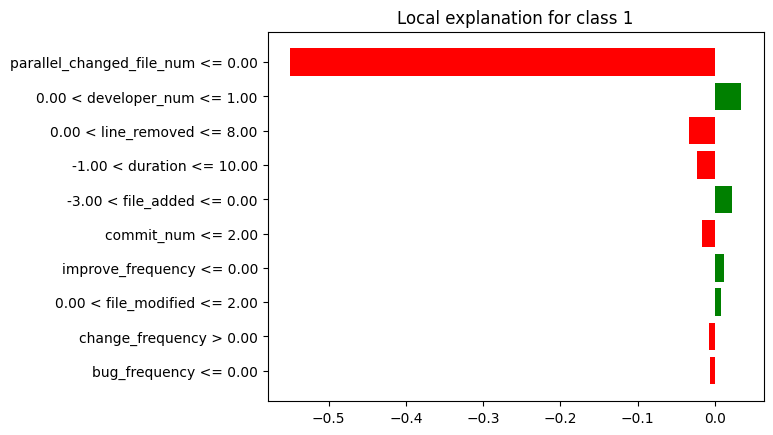

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[1, 'Variable'] = 'developer_num'
lime_fn_df_max.at[2, 'Variable'] = 'line_removed'
lime_fn_df_max.at[3, 'Variable'] = 'duration'
lime_fn_df_max.at[4, 'Variable'] = 'file_added'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               messages_max        2  Negativo
2              file_modified        3  Positivo
3                 commit_num        4  Negativo
4              developer_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2               messages_max        3  Negativo
3                 commit_num        4  Negativo
4              file_modified        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              developer_num        2  Positivo
2               line_removed        3  Negativo
3                   duration        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'messages_max', 'file_modified', 'commit_num', 'developer_num']
['parallel_changed_file_num', 'developer_num', 'messages_max', 'commit_num', 'file_modified']
['parallel_changed_file_num', 'developer_num', 'line_removed', 'duration', 'file_added']
['parallel_changed_file_num', 'messages_max', 'duration', 'file_modified', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               messages_max         2  Negativo       3  Negativo       -   
2                   duration         -         -       -         -       4   
3              file_modified         3  Positivo       5  Positivo       -   
4                 file_added         -         -       -         -       5   
5                 commit_num         4  Negativo       4  Negativo       -   
6              developer_num         5  Positivo       2  Positivo       2   
7               line_removed         -         -       -         -       3   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3         -  
4  Positivo  
5         -  
6  Positivo  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "messages_max", "file_modified", "commit_num", "developer_num", "line_removed", "duration",  "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
messages_max                      2  Negativo       3  Negativo       -   
file_modified                     3  Positivo       5  Positivo       -   
commit_num                        4  Negativo       4  Negativo       -   
developer_num                     5  Positivo       2  Positivo       2   
line_removed                      -         -       -         -       3   
duration                          -         -       -         -       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
messages_max                      -  
file_modified                     -  
commit_num                        -  
developer_num              Positivo  
line_removed               Negativo  
duration                   Negativo  
file_added                 Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

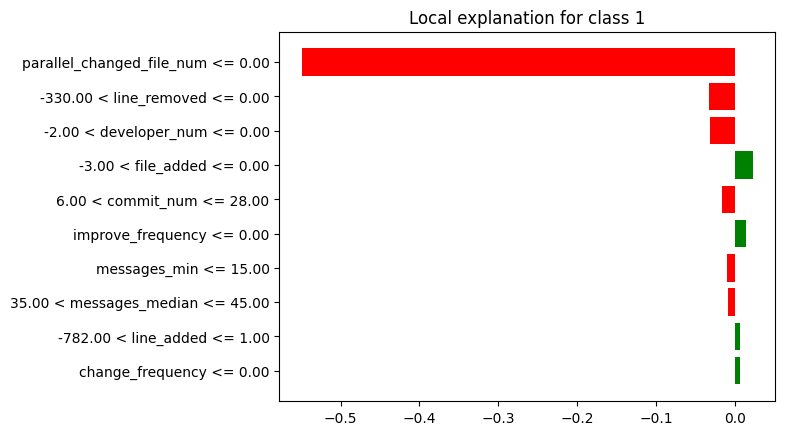

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[1, 'Variable'] = 'line_removed'
lime_fn_df_mediana.at[2, 'Variable'] = 'developer_num'
lime_fn_df_mediana.at[3, 'Variable'] = 'file_added'
lime_fn_df_mediana.at[4, 'Variable'] = 'commit_num'

print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2              developer_num        3  Positivo
3               file_removed        4  Positivo
4                 line_added        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                 commit_num        3  Negativo
3              developer_num        4  Positivo
4               line_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               line_removed        2  Negativo
2              developer_num        3  Negativo
3                 file_added        4  Positivo
4                 commit_num        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'commit_num', 'developer_num', 'file_removed', 'line_added']
['parallel_changed_file_num', 'file_removed', 'commit_num', 'developer_num', 'line_removed']
['parallel_changed_file_num', 'line_removed', 'developer_num', 'file_added', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'line_added', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         4  Positivo       2  Positivo       -   
2                 line_added         5  Negativo       -         -       -   
3                 file_added         -         -       -         -       4   
4                 commit_num         2  Negativo       3  Negativo       5   
5              developer_num         3  Positivo       4  Positivo       3   
6               line_removed         -         -       5  Negativo       2   

             
      Signo  
0  Negativo  
1         -  
2         -  
3  Positivo  
4  Negativo  
5  Negativo  
6  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "developer_num", "file_removed", "line_added", "line_removed", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       3  Negativo       5   
developer_num                     3  Positivo       4  Positivo       3   
file_removed                      4  Positivo       2  Positivo       -   
line_added                        5  Negativo       -         -       -   
line_removed                      -         -       5  Negativo       2   
file_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
developer_num              Negativo  
file_removed                      -  
line_added                        -  
line_removed               Negativo  
file_added                 Positivo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

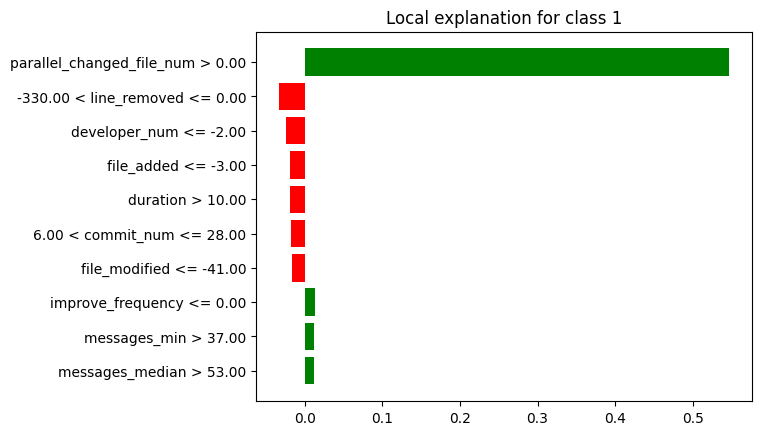

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)
lime_fn_df_min.at[1, 'Variable'] = 'line_removed'

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2                 line_added        3  Negativo
3               line_removed        4  Negativo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Negativo
2               line_removed        3  Negativo
3                   duration        4  Negativo
4                 file_added        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Negativo
2              developer_num        3  Negativo
3                 file_added        4  Negativo
4                   duration        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'line_added', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'line_removed', 'duration', 'file_added']
['parallel_changed_file_num', 'line_removed', 'developer_num', 'file_added', 'duration']
['parallel_changed_file_num', 'duration', 'line_added', 'file_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                   duration         -         -       4  Negativo       5   
2                 line_added         3  Negativo       -         -       -   
3                 file_added         -         -       5  Positivo       4   
4                 commit_num         5  Positivo       -         -       -   
5              developer_num         2  Negativo       2  Negativo       3   
6               line_removed         4  Negativo       3  Negativo       2   

             
      Signo  
0  Positivo  
1  Negativo  
2         -  
3  Negativo  
4         -  
5  Negativo  
6  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "line_added", "line_removed", "commit_num", "duration", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Negativo       2  Negativo       3   
line_added                        3  Negativo       -         -       -   
line_removed                      4  Negativo       3  Negativo       2   
commit_num                        5  Positivo       -         -       -   
duration                          -         -       4  Negativo       5   
file_added                        -         -       5  Positivo       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Negativo  
line_added                        -  
line_removed               Negativo  
commit_num                        -  
duration                   Negativo  
file_added                 Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('messages_max', 2), ('file_modified', 3), ('commit_num', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('commit_num', 2), ('developer_num', 3), ('file_removed', 4), ('line_added', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_added', 3), ('line_removed', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('messages_max', 3), ('file_modified', 5), ('commit_num', 4), ('developer_num', 2), ('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 4), ('file_removed', 2), ('line_removed', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 3), ('duration', 4), ('file_added', 5)], 'Lime': [('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 3), ('duration', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('commit_num', 5), ('developer_num', 3), ('line_removed', 2), ('file_added', 4), ('parallel_changed_file_num', 1), ('de

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gb_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.0      1           4.0      2   
developer_num                  3.333333      3      2.666667      3   
commit_num                     3.666667      3           3.5      2   
file_added                            -      -           5.0      1   
file_modified                       3.0      1           5.0      1   
line_added                          4.0      2             -      -   
duration                              -      -           4.0      1   
file_removed                        4.0      1           2.0      1   
messages_max                        2.0      1           3.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                   2.333333      3  
developer_num                  2.666667      3  
commit_num                          5.0      1  
file_added                     4.333333      3  
file_modified                         -      -  
line_added                            -      -  
duration                            4.5      2  
file_removed                          -      -  
messages_max                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gb_fn[("General", "Conteo Total")] = df_resumen_gb_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.0      1           4.0      2   
developer_num                  3.333333      3      2.666667      3   
commit_num                     3.666667      3           3.5      2   
file_added                            -      -           5.0      1   
file_modified                       3.0      1           5.0      1   
line_added                          4.0      2             -      -   
duration                              -      -           4.0      1   
file_removed                        4.0      1           2.0      1   
messages_max                        2.0      1           3.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                   2.333333      3  3.444444            6  
developer_num                  2.666667      3  2.888889            9  
commit_num                          5.0      1  4.055556            6  
file_added                     4.333333      3  4.666667            4  
file_modified                         -      -  4.000000            2  
line_added                            -      -  4.000000            2  
duration                            4.5      2  4.250000            3  
file_removed                          -      -  3.000000            2  
messages_max                          -      -  2.500000            2  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gb_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gb_fn[("General", "Peso Rango")] = 1 - ((df_resumen_gb_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gb_fn[("General", "Peso Conteo")] = df_resumen_gb_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gb_fn[("General", "Puntaje")] = df_resumen_gb_fn[("General", "Peso Rango")] + df_resumen_gb_fn[("General", "Peso Conteo")]
df_resumen_gb_fn[("General", "Ranking")] = df_resumen_gb_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gb_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gb_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gb_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        4.0      1           4.0      2   
developer_num                  3.333333      3      2.666667      3   
commit_num                     3.666667      3           3.5      2   
file_added                            -      -           5.0      1   
file_modified                       3.0      1           5.0      1   
line_added                          4.0      2             -      -   
duration                              -      -           4.0      1   
file_removed                        4.0      1           2.0      1   
messages_max                        2.0      1           3.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                   2.333333      3     3.0            6  
developer_num                  2.666667      3     2.0            9  
commit_num                          5.0      1     5.0            6  
file_added                     4.333333      3     7.0            4  
file_modified                         -      -     7.0            2  
line_added                            -      -     7.0            2  
duration                            4.5      2     7.0            3  
file_removed                          -      -     6.0            2  
messages_max                          -      -     4.0            2  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gb_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gb_fn = df_resumen_gb_fn[new_columns]

In [ ]:
df_resumen_gb_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gb_fn[(tech, "Ranking Medio")] = df_resumen_gb_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gb_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
developer_num                 2.0            9          3.33      3   
line_removed                  3.0            6          4.00      1   
messages_max                  4.0            2          2.00      1   
commit_num                    5.0            6          3.67      3   
file_removed                  6.0            2          4.00      1   
file_added                    7.0            4             -      -   
file_modified                 7.0            2          3.00      1   
line_added                    7.0            2          4.00      2   
duration                      7.0            3             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
developer_num                      2.67      3          2.67      3  
line_removed                       4.00      2          2.33      3  
messages_max                       3.00      1             -      -  
commit_num                         3.50      2          5.00      1  
file_removed                       2.00      1             -      -  
file_added                         5.00      1          4.33      3  
file_modified                      5.00      1             -      -  
line_added                            -      -             -      -  
duration                           4.00      1          4.50      2

## **AdaBoosting:**

**FEATURE IMPORTANCE**

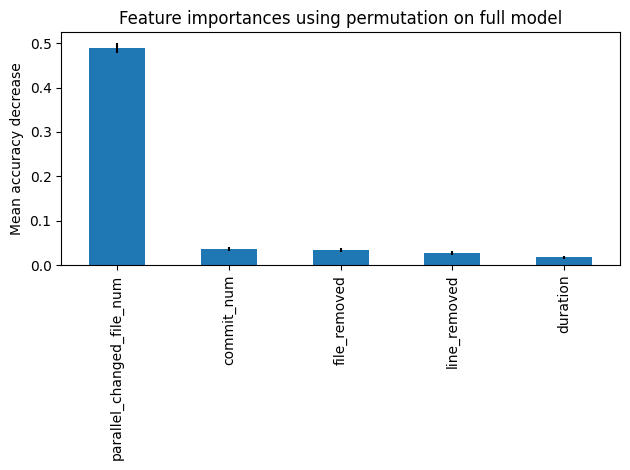

In [ ]:
permu = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

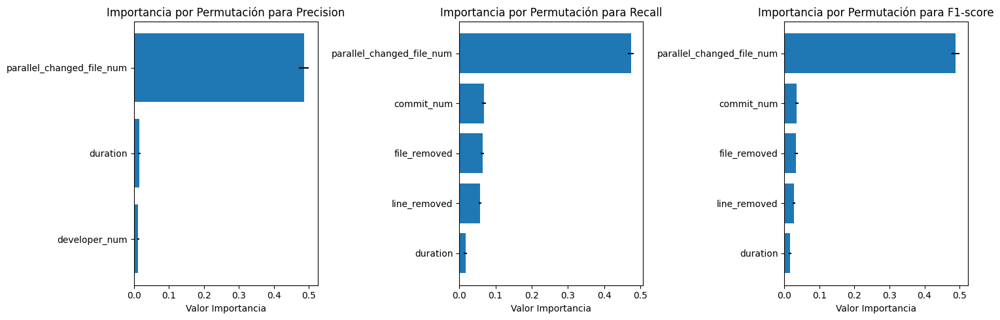

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()

In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_ada = {}

permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_ada[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_ada['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.486148,0.014325
2,duration,0.015286,0.004348
1,developer_num,0.011902,0.002419


In [ ]:
results_global_ada['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.474068,0.008410
1,commit_num,0.068227,0.004832
2,file_removed,0.064075,0.004358
3,line_removed,0.057460,0.004334
4,duration,0.017417,0.004560


In [ ]:
results_global_ada['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.488601,0.010517
1,commit_num,0.035823,0.004049
2,file_removed,0.033871,0.004173
3,line_removed,0.027422,0.004164
4,duration,0.016617,0.003905


In [ ]:
scoring = ['accuracy', 'precision', 'recall','f1']
permu_score = permutation_importance(modelo_ada, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for metric in permu_score:
  print(f"\nUsando como referencia: {metric}\n")
  permu = permu_score[metric]
  for i in permu.importances_mean.argsort()[::-1]:
    if abs(permu.importances_mean[i].round(3)) > 0.000:
      print(f"    {feature_names[i]:<30}"
      f"{permu.importances_mean[i]:.3f}"
      f" +/- {permu.importances_std[i]:.3f}")


Usando como referencia: accuracy

    parallel_changed_file_num     0.059 +/- 0.002
    duration                      0.003 +/- 0.001
    developer_num                 0.001 +/- 0.000
    file_removed                  0.001 +/- 0.001
    commit_num                    0.001 +/- 0.001
    line_added                    0.001 +/- 0.000

Usando como referencia: precision

    parallel_changed_file_num     0.486 +/- 0.014
    duration                      0.015 +/- 0.004
    developer_num                 0.012 +/- 0.002
    line_added                    0.008 +/- 0.002
    file_modified                 0.003 +/- 0.001
    refactor_frequency            0.001 +/- 0.001
    messages_max                  -0.001 +/- 0.001
    file_removed                  -0.014 +/- 0.005
    commit_num                    -0.016 +/- 0.005
    line_removed                  -0.020 +/- 0.004

Usando como referencia: recall

    parallel_changed_file_num     0.474 +/- 0.008
    commit_num                    0.068 +/

**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_ada, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 35239 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 35239 values
  -> model_class       : sklearn.ensemble._weight_boosting.AdaBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5310c49b40> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.414, mean = 0.445, max = 0.535
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.53, mean = -0.351, max = 0.574
  -> model_info        : package sklearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

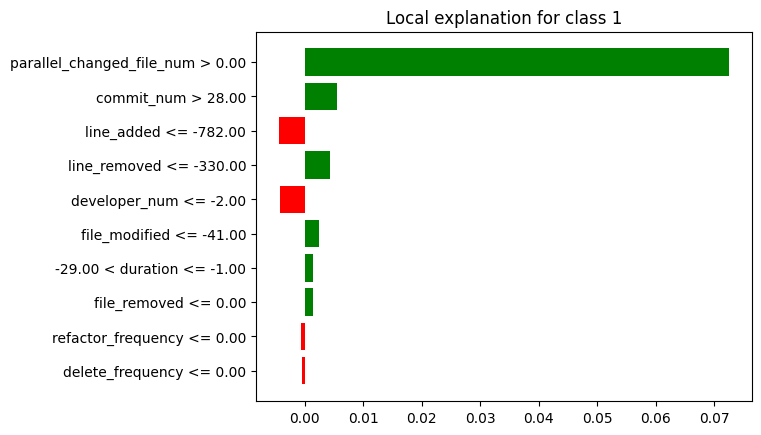

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2                 line_added        3  Negativo
3               line_removed        4  Positivo
4              developer_num        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'line_added', 'line_removed', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'line_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         4  Positivo       4  Positivo       -   
2                 line_added         -         -       -         -       3   
3                 commit_num         2  Positivo       2  Positivo       2   
4              developer_num         5  Negativo       5  Negativo       5   
5               line_removed         3  Positivo       3  Positivo       4   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Negativo  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "file_removed", "developer_num",  "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       2   
line_removed                      3  Positivo       3  Positivo       4   
file_removed                      4  Positivo       4  Positivo       -   
developer_num                     5  Negativo       5  Negativo       5   
line_added                        -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed               Positivo  
file_removed                      -  
developer_num              Negativo  
line_added                 Negativo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

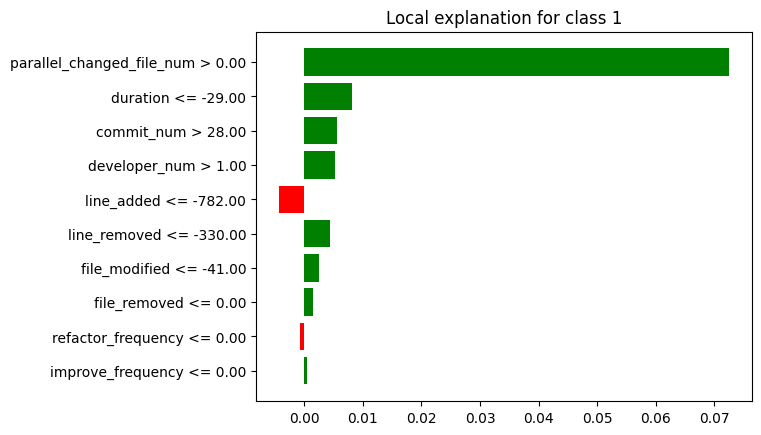

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                   duration        3  Positivo
3               line_removed        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                   duration        3  Positivo
3               line_removed        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4                 line_added        5  Negativo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'duration', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'duration', 'line_removed', 'commit_num']
['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'line_added']
['parallel_changed_file_num', 'duration', 'line_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                   duration         3  Positivo       3  Positivo       2   
2                 line_added         -         -       -         -       5   
3                 commit_num         5  Positivo       5  Positivo       3   
4              developer_num         2  Positivo       2  Positivo       4   
5               line_removed         4  Positivo       4  Positivo       -   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3  Positivo  
4  Positivo  
5         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "line_removed", "commit_num", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       4   
duration                          3  Positivo       3  Positivo       2   
line_removed                      4  Positivo       4  Positivo       -   
commit_num                        5  Positivo       5  Positivo       3   
line_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
duration                   Positivo  
line_removed                      -  
commit_num                 Positivo  
line_added                 Negativo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

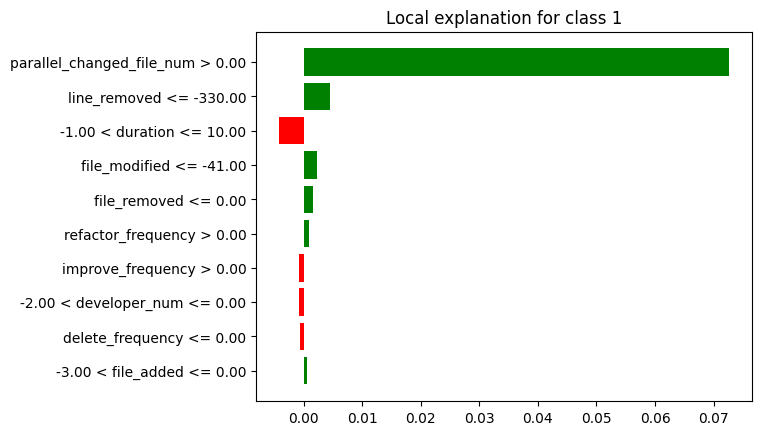

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[2, 'Variable'] = 'duration'


print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               line_removed        3  Positivo
3                 commit_num        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               line_removed        3  Positivo
3                 commit_num        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               line_removed        2  Positivo
2                   duration        3  Negativo
3              file_modified        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'line_removed', 'commit_num', 'duration']
['parallel_changed_file_num', 'developer_num', 'line_removed', 'commit_num', 'duration']
['parallel_changed_file_num', 'line_removed', 'duration', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         -         -       -         -       5   
2                   duration         5  Positivo       5  Positivo       3   
3              file_modified         -         -       -         -       4   
4                 commit_num         4  Positivo       4  Positivo       -   
5              developer_num         2  Positivo       2  Positivo       -   
6               line_removed         3  Positivo       3  Positivo       2   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3  Positivo  
4         -  
5         -  
6  Positivo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "line_removed", "commit_num", "duration", "file_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       -   
line_removed                      3  Positivo       3  Positivo       2   
commit_num                        4  Positivo       4  Positivo       -   
duration                          5  Positivo       5  Positivo       3   
file_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num                     -  
line_removed               Positivo  
commit_num                        -  
duration                   Negativo  
file_removed               Positivo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('line_removed', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 3), ('commit_num', 4), ('duration', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('line_removed', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_removed', 3), ('commit_num', 4), ('duration', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 4), ('developer_num', 5), ('line_added', 3), ('parallel_changed_file_num', 1), ('developer_num', 4), ('duration', 2), ('commit_num', 3), ('line_added', 5), ('parallel_changed_file_num', 1), ('line_removed',

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                   3.333333      3      3.333333      3   
developer_num                       3.0      3           3.0      3   
commit_num                     3.666667      3      3.666667      3   
line_added                            -      -             -      -   
duration                            4.0      2           4.0      2   
file_removed                        4.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                        3.0      2  
developer_num                       4.5      2  
commit_num                          2.5      2  
line_added                          4.0      2  
duration                            2.5      2  
file_removed                        5.0      1  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vp[("General", "Conteo Total")] = df_resumen_ada_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                   3.333333      3      3.333333      3   
developer_num                       3.0      3           3.0      3   
commit_num                     3.666667      3      3.666667      3   
line_added                            -      -             -      -   
duration                            4.0      2           4.0      2   
file_removed                        4.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                        3.0      2  3.222222            8  
developer_num                       4.5      2  3.500000            8  
commit_num                          2.5      2  3.277778            8  
line_added                          4.0      2  4.000000            2  
duration                            2.5      2  3.500000            6  
file_removed                        5.0      1  4.333333            3  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vp[("General", "Peso Conteo")] = df_resumen_ada_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vp[("General", "Puntaje")] = df_resumen_ada_vp[("General", "Peso Rango")] + df_resumen_ada_vp[("General", "Peso Conteo")]
df_resumen_ada_vp[("General", "Ranking")] = df_resumen_ada_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                   3.333333      3      3.333333      3   
developer_num                       3.0      3           3.0      3   
commit_num                     3.666667      3      3.666667      3   
line_added                            -      -             -      -   
duration                            4.0      2           4.0      2   
file_removed                        4.0      1           4.0      1   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                        3.0      2     2.0            8  
developer_num                       4.5      2     4.0            8  
commit_num                          2.5      2     3.0            8  
line_added                          4.0      2     7.0            2  
duration                            2.5      2     5.0            6  
file_removed                        5.0      1     6.0            3  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vp = df_resumen_ada_vp[new_columns]

In [ ]:
df_resumen_ada_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vp[(tech, "Ranking Medio")] = df_resumen_ada_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
line_removed                  2.0            8          3.33      3   
commit_num                    3.0            8          3.67      3   
developer_num                 4.0            8          3.00      3   
duration                      5.0            6          4.00      2   
file_removed                  6.0            3          4.00      1   
line_added                    7.0            2             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
line_removed                       3.33      3          3.00      2  
commit_num                         3.67      3          2.50      2  
developer_num                      3.00      3          4.50      2  
duration                           4.00      2          2.50      2  
file_removed                       4.00      1          5.00      1  
line_added                            -      -          4.00      2

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

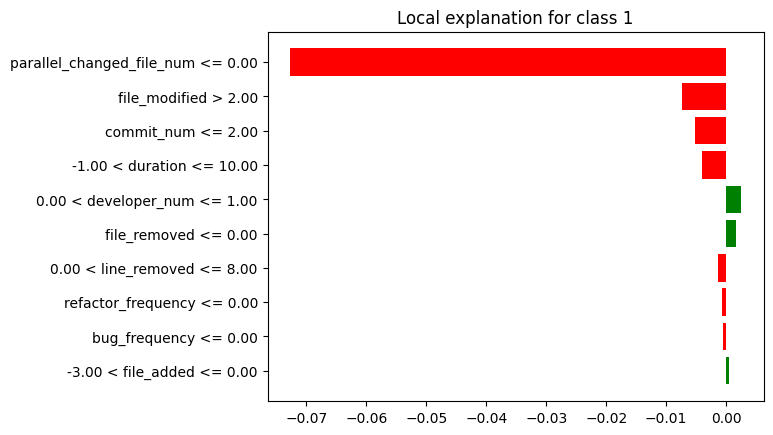

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[3, 'Variable'] = 'duration'
lime_vn_df_max.at[4, 'Variable'] = 'developer_num'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Negativo
2                 commit_num        3  Negativo
3              developer_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Negativo
2                 commit_num        3  Negativo
3              developer_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              file_modified        2  Negativo
2                 commit_num        3  Negativo
3                   duration        4  Negativo
4              developer_num        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'duration', 'commit_num', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'file_modified', 'commit_num', 'duration', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         5  Negativo       5  Negativo       -   
2                   duration         2  Negativo       2  Negativo       4   
3              file_modified         -         -       -         -       2   
4                 commit_num         3  Negativo       3  Negativo       3   
5              developer_num         4  Positivo       4  Positivo       5   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3  Negativo  
4  Negativo  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "commit_num", "developer_num", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
duration                          2  Negativo       2  Negativo       4   
commit_num                        3  Negativo       3  Negativo       3   
developer_num                     4  Positivo       4  Positivo       5   
file_removed                      5  Negativo       5  Negativo       -   
file_modified                     -         -       -         -       2   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
duration                   Negativo  
commit_num                 Negativo  
developer_num              Positivo  
file_removed                      -  
file_modified              Negativo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

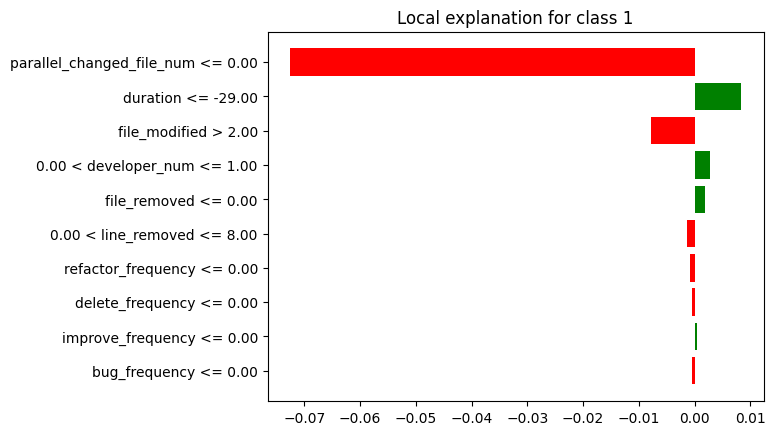

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[3, 'Variable'] = 'developer_num'


print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3                 commit_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2              developer_num        3  Positivo
3                 commit_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2              file_modified        3  Negativo
3              developer_num        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'duration', 'developer_num', 'commit_num', 'file_removed']
['parallel_changed_file_num', 'duration', 'developer_num', 'commit_num', 'file_removed']
['parallel_changed_file_num', 'duration', 'file_modified', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         5  Negativo       5  Negativo       5   
2                   duration         2  Positivo       2  Positivo       2   
3              file_modified         -         -       -         -       3   
4                 commit_num         4  Positivo       4  Positivo       -   
5              developer_num         3  Positivo       3  Positivo       4   

             
      Signo  
0  Negativo  
1  Positivo  
2  Positivo  
3  Negativo  
4         -  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "developer_num", "commit_num", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
duration                          2  Positivo       2  Positivo       2   
developer_num                     3  Positivo       3  Positivo       4   
commit_num                        4  Positivo       4  Positivo       -   
file_removed                      5  Negativo       5  Negativo       5   
file_modified                     -         -       -         -       3   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
duration                   Positivo  
developer_num              Positivo  
commit_num                        -  
file_removed               Positivo  
file_modified              Negativo

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

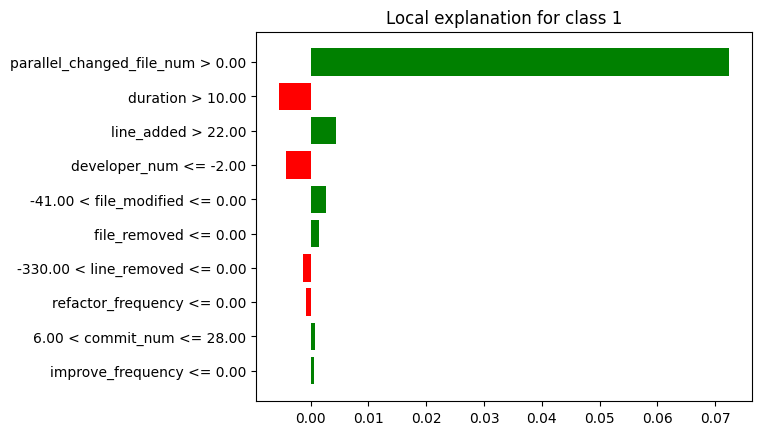

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)
lime_vn_df_min.at[4, 'Variable'] = 'file_modified'

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2              developer_num        3  Negativo
3                 line_added        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2              developer_num        3  Negativo
3                 line_added        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2                 line_added        3  Positivo
3              developer_num        4  Negativo
4              file_modified        5  Positivo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'duration', 'developer_num', 'line_added', 'commit_num']
['parallel_changed_file_num', 'duration', 'developer_num', 'line_added', 'commit_num']
['parallel_changed_file_num', 'duration', 'line_added', 'developer_num', 'file_modified']
['parallel_changed_file_num', 'duration', 'file_modified', 'line_added', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1                   duration         2  Negativo       2  Negativo       2   
2              file_modified         -         -       -         -       5   
3                 line_added         4  Positivo       4  Positivo       3   
4                 commit_num         5  Positivo       5  Positivo       -   
5              developer_num         3  Negativo       3  Negativo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3  Positivo  
4         -  
5  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "developer_num", "line_added", "commit_num", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Negativo       2  Negativo       2   
developer_num                     3  Negativo       3  Negativo       4   
line_added                        4  Positivo       4  Positivo       3   
commit_num                        5  Positivo       5  Positivo       -   
file_modified                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Negativo  
developer_num              Negativo  
line_added                 Positivo  
commit_num                        -  
file_modified              Positivo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('duration', 2), ('commit_num', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('commit_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('line_added', 4), ('commit_num', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('duration', 2), ('commit_num', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('commit_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('line_added', 4), ('commit_num', 5)], 'Lime': [('parallel_changed_file_num', 1), ('duration', 4), ('commit_num', 3), ('developer_num', 5), ('file_modified', 2), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 4), ('file_removed', 5), ('file_modified', 3), ('parallel_changed_file_num', 1), ('duration', 2), ('devel

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                  3.333333      3      3.333333      3   
commit_num                          4.0      3           4.0      3   
line_added                          4.0      1           4.0      1   
file_modified                         -      -             -      -   
duration                            2.0      3           2.0      3   
file_removed                        5.0      2           5.0      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
developer_num                  4.333333      3  
commit_num                     3.000000      1  
line_added                     3.000000      1  
file_modified                  3.333333      3  
duration                       2.666667      3  
file_removed                   5.000000      1  
parallel_changed_file_num      1.000000      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_vn[("General", "Conteo Total")] = df_resumen_ada_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                  3.333333      3      3.333333      3   
commit_num                          4.0      3           4.0      3   
line_added                          4.0      1           4.0      1   
file_modified                         -      -             -      -   
duration                            2.0      3           2.0      3   
file_removed                        5.0      2           5.0      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
developer_num                  4.333333      3  3.666667            9  
commit_num                     3.000000      1  3.666667            7  
line_added                     3.000000      1  3.666667            3  
file_modified                  3.333333      3  3.333333            3  
duration                       2.666667      3  2.222222            9  
file_removed                   5.000000      1  5.000000            5  
parallel_changed_file_num      1.000000      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_vn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_vn[("General", "Peso Conteo")] = df_resumen_ada_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_vn[("General", "Puntaje")] = df_resumen_ada_vn[("General", "Peso Rango")] + df_resumen_ada_vn[("General", "Peso Conteo")]
df_resumen_ada_vn[("General", "Ranking")] = df_resumen_ada_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                  3.333333      3      3.333333      3   
commit_num                          4.0      3           4.0      3   
line_added                          4.0      1           4.0      1   
file_modified                         -      -             -      -   
duration                            2.0      3           2.0      3   
file_removed                        5.0      2           5.0      2   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
developer_num                  4.333333      3     3.0            9  
commit_num                     3.000000      1     4.0            7  
line_added                     3.000000      1     6.0            3  
file_modified                  3.333333      3     5.0            3  
duration                       2.666667      3     2.0            9  
file_removed                   5.000000      1     7.0            5  
parallel_changed_file_num      1.000000      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_vn = df_resumen_ada_vn[new_columns]

In [ ]:
df_resumen_ada_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_vn[(tech, "Ranking Medio")] = df_resumen_ada_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
duration                      2.0            9          2.00      3   
developer_num                 3.0            9          3.33      3   
commit_num                    4.0            7          4.00      3   
file_modified                 5.0            3             -      -   
line_added                    6.0            3          4.00      1   
file_removed                  7.0            5          5.00      2   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
duration                           2.00      3          2.67      3  
developer_num                      3.33      3          4.33      3  
commit_num                         4.00      3          3.00      1  
file_modified                         -      -          3.33      3  
line_added                         4.00      1          3.00      1  
file_removed                       5.00      2          5.00      1

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

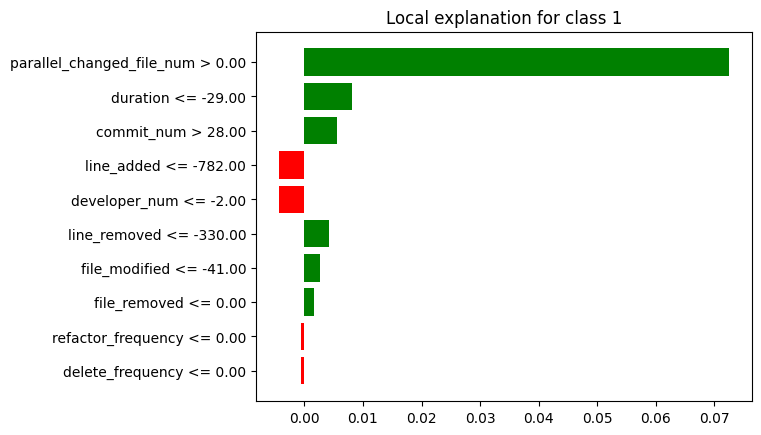

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                 commit_num        2  Positivo
2               line_removed        3  Positivo
3               file_removed        4  Positivo
4              developer_num        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2                 commit_num        3  Positivo
3                 line_added        4  Negativo
4              developer_num        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'developer_num']
['parallel_changed_file_num', 'commit_num', 'line_removed', 'file_removed', 'developer_num']
['parallel_changed_file_num', 'duration', 'commit_num', 'line_added', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'duration', 'line_added', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         4  Positivo       4  Positivo       -   
2                   duration         -         -       -         -       2   
3                 line_added         -         -       -         -       4   
4                 commit_num         2  Positivo       2  Positivo       3   
5              developer_num         5  Negativo       5  Negativo       5   
6               line_removed         3  Positivo       3  Positivo       -   

             
      Signo  
0  Positivo  
1         -  
2  Positivo  
3  Negativo  
4  Positivo  
5  Negativo  
6         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "line_removed", "file_removed", "developer_num", "duration", "line_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
commit_num                        2  Positivo       2  Positivo       3   
line_removed                      3  Positivo       3  Positivo       -   
file_removed                      4  Positivo       4  Positivo       -   
developer_num                     5  Negativo       5  Negativo       5   
duration                          -         -       -         -       2   
line_added                        -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
commit_num                 Positivo  
line_removed                      -  
file_removed                      -  
developer_num              Negativo  
duration                   Positivo  
line_added                 Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

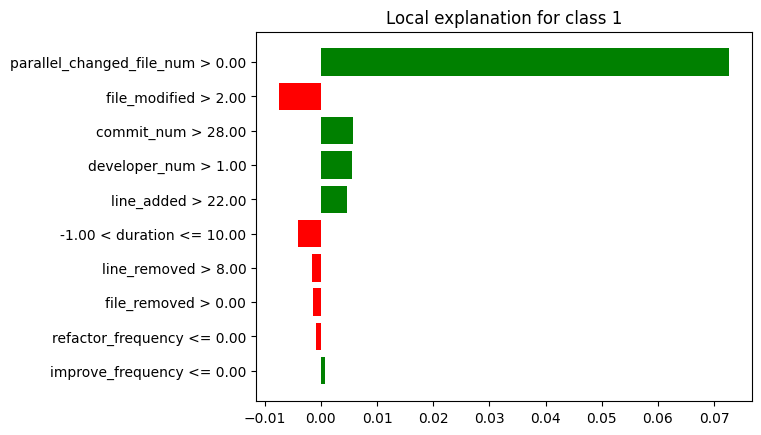

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 line_added        3  Positivo
3               file_removed        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 line_added        3  Positivo
3               file_removed        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Negativo
2                 commit_num        3  Positivo
3              developer_num        4  Positivo
4                 line_added        5  Positivo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'line_added', 'file_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'line_added', 'file_removed', 'commit_num']
['parallel_changed_file_num', 'file_modified', 'commit_num', 'developer_num', 'line_added']
['parallel_changed_file_num', 'file_removed', 'file_modified', 'line_added', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         4  Positivo       4  Positivo       -   
2              file_modified         -         -       -         -       2   
3                 line_added         3  Positivo       3  Positivo       5   
4                 commit_num         5  Positivo       5  Positivo       3   
5              developer_num         2  Positivo       2  Positivo       4   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Positivo  
5  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "line_added", "file_removed", "commit_num", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       4   
line_added                        3  Positivo       3  Positivo       5   
file_removed                      4  Positivo       4  Positivo       -   
commit_num                        5  Positivo       5  Positivo       3   
file_modified                     -         -       -         -       2   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
line_added                 Positivo  
file_removed                      -  
commit_num                 Positivo  
file_modified              Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

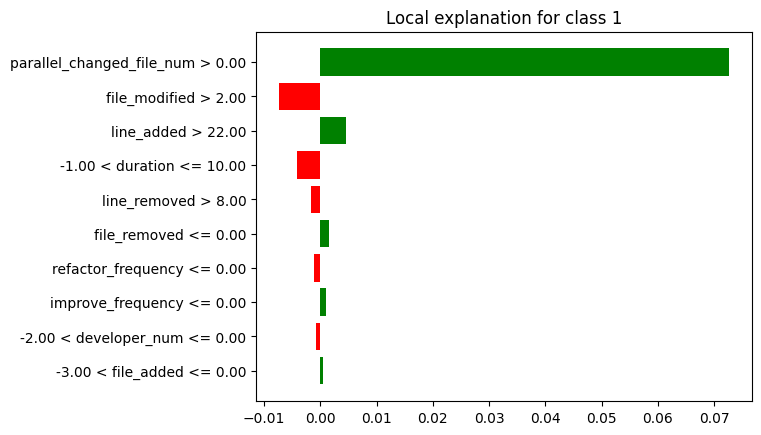

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[3, 'Variable'] = 'duration'


print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3                   duration        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                 commit_num        3  Positivo
3                   duration        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              file_modified        2  Negativo
2                 line_added        3  Positivo
3                   duration        4  Negativo
4               line_removed        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'file_removed']
['parallel_changed_file_num', 'developer_num', 'commit_num', 'duration', 'file_removed']
['parallel_changed_file_num', 'file_modified', 'line_added', 'duration', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'line_added', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         5  Negativo       5  Negativo       -   
2                   duration         4  Positivo       4  Positivo       4   
3                 line_added         -         -       -         -       3   
4              file_modified         -         -       -         -       2   
5                 commit_num         3  Positivo       3  Positivo       -   
6              developer_num         2  Positivo       2  Positivo       -   
7               line_removed         -         -       -         -       5   

             
      Signo  
0  Positivo  
1         -  
2  Negativo  
3  Positivo  
4  Negativo  
5         -  
6         -  
7  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "commit_num", "duration", "file_removed", "file_modified", "line_added", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       -   
commit_num                        3  Positivo       3  Positivo       -   
duration                          4  Positivo       4  Positivo       4   
file_removed                      5  Negativo       5  Negativo       -   
file_modified                     -         -       -         -       2   
line_added                        -         -       -         -       3   
line_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num                     -  
commit_num                        -  
duration                   Negativo  
file_removed                      -  
file_modified              Negativo  
line_added                 Positivo  
line_removed               Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_added', 3), ('file_removed', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('duration', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('line_removed', 3), ('file_removed', 4), ('developer_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('line_added', 3), ('file_removed', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('commit_num', 3), ('duration', 4), ('file_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 3), ('developer_num', 5), ('duration', 2), ('line_added', 4), ('parallel_changed_file_num', 1), ('developer_num', 4), ('line_added', 5), ('commit_num', 3), ('file_modified', 2), ('parallel_changed_file_num', 1), ('duration'

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
developer_num                       3.0      3           3.0      3   
commit_num                     3.333333      3      3.333333      3   
line_added                          3.0      1           3.0      1   
file_modified                         -      -             -      -   
duration                            4.0      1           4.0      1   
file_removed                   4.333333      3      4.333333      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                        5.0      1  
developer_num                       4.5      2  
commit_num                          3.0      2  
line_added                          4.0      3  
file_modified                       2.0      2  
duration                            3.0      2  
file_removed                          -      -  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fp[("General", "Conteo Total")] = df_resumen_ada_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
developer_num                       3.0      3           3.0      3   
commit_num                     3.333333      3      3.333333      3   
line_added                          3.0      1           3.0      1   
file_modified                         -      -             -      -   
duration                            4.0      1           4.0      1   
file_removed                   4.333333      3      4.333333      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                        5.0      1  3.666667            3  
developer_num                       4.5      2  3.500000            8  
commit_num                          3.0      2  3.222222            8  
line_added                          4.0      3  3.333333            5  
file_modified                       2.0      2  2.000000            2  
duration                            3.0      2  3.666667            4  
file_removed                          -      -  4.333333            6  
parallel_changed_file_num           1.0      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fp[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fp[("General", "Peso Conteo")] = df_resumen_ada_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fp[("General", "Puntaje")] = df_resumen_ada_fp[("General", "Peso Rango")] + df_resumen_ada_fp[("General", "Peso Conteo")]
df_resumen_ada_fp[("General", "Ranking")] = df_resumen_ada_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                        3.0      1           3.0      1   
developer_num                       3.0      3           3.0      3   
commit_num                     3.333333      3      3.333333      3   
line_added                          3.0      1           3.0      1   
file_modified                         -      -             -      -   
duration                            4.0      1           4.0      1   
file_removed                   4.333333      3      4.333333      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                        5.0      1     8.0            3  
developer_num                       4.5      2     3.0            8  
commit_num                          3.0      2     2.0            8  
line_added                          4.0      3     4.0            5  
file_modified                       2.0      2     5.0            2  
duration                            3.0      2     7.0            4  
file_removed                          -      -     6.0            6  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fp = df_resumen_ada_fp[new_columns]

In [ ]:
df_resumen_ada_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fp[(tech, "Ranking Medio")] = df_resumen_ada_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
commit_num                    2.0            8          3.33      3   
developer_num                 3.0            8          3.00      3   
line_added                    4.0            5          3.00      1   
file_modified                 5.0            2             -      -   
file_removed                  6.0            6          4.33      3   
duration                      7.0            4          4.00      1   
line_removed                  8.0            3          3.00      1   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
commit_num                         3.33      3          3.00      2  
developer_num                      3.00      3          4.50      2  
line_added                         3.00      1          4.00      3  
file_modified                         -      -          2.00      2  
file_removed                       4.33      3             -      -  
duration                           4.00      1          3.00      2  
line_removed                       3.00      1          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

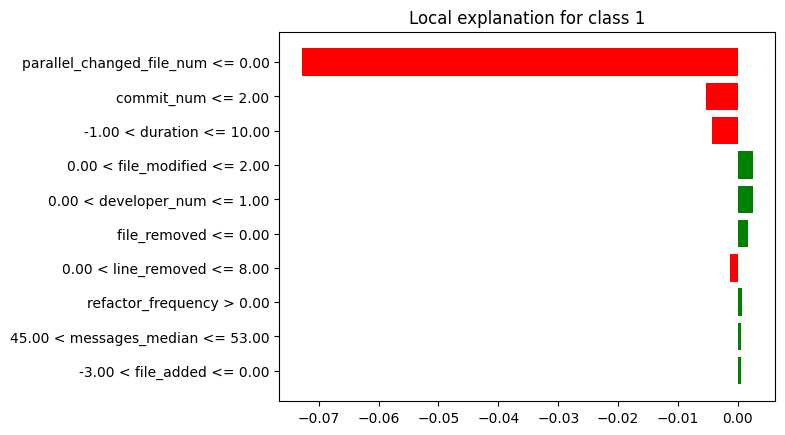

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[2, 'Variable'] = 'duration'
lime_fn_df_max.at[3, 'Variable'] = 'file_modified'
lime_fn_df_max.at[4, 'Variable'] = 'developer_num'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2                   duration        3  Negativo
3              developer_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2                   duration        3  Negativo
3              developer_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                 commit_num        2  Negativo
2                   duration        3  Negativo
3              file_modified        4  Positivo
4              developer_num        5  Positivo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'commit_num', 'duration', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'duration', 'developer_num', 'file_removed']
['parallel_changed_file_num', 'commit_num', 'duration', 'file_modified', 'developer_num']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         5  Negativo       5  Negativo       -   
2                   duration         3  Negativo       3  Negativo       3   
3              file_modified         -         -       -         -       4   
4                 commit_num         2  Negativo       2  Negativo       2   
5              developer_num         4  Positivo       4  Positivo       5   

             
      Signo  
0  Negativo  
1         -  
2  Negativo  
3  Positivo  
4  Negativo  
5  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "commit_num", "duration", "developer_num", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
commit_num                        2  Negativo       2  Negativo       2   
duration                          3  Negativo       3  Negativo       3   
developer_num                     4  Positivo       4  Positivo       5   
file_removed                      5  Negativo       5  Negativo       -   
file_modified                     -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
commit_num                 Negativo  
duration                   Negativo  
developer_num              Positivo  
file_removed                      -  
file_modified              Positivo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

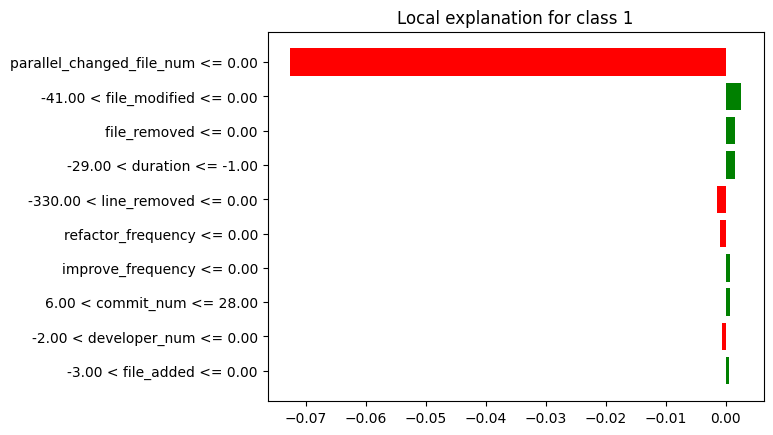

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[1, 'Variable'] = 'file_modified'
lime_fn_df_mediana.at[3, 'Variable'] = 'duration'
lime_fn_df_mediana.at[4, 'Variable'] = 'line_removed'


print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              developer_num        3  Positivo
3                   duration        4  Positivo
4                 commit_num        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              developer_num        3  Positivo
3                 commit_num        4  Positivo
4                   duration        5  Positivo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1              file_modified        2  Positivo
2               file_removed        3  Positivo
3                   duration        4  Positivo
4               line_removed        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'file_removed', 'developer_num', 'duration', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'developer_num', 'commit_num', 'duration']
['parallel_changed_file_num', 'file_modified', 'file_removed', 'duration', 'line_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num', 'line_removed']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         2  Positivo       2  Positivo       3   
2                   duration         4  Positivo       5  Positivo       4   
3              file_modified         -         -       -         -       2   
4                 commit_num         5  Positivo       4  Positivo       -   
5              developer_num         3  Positivo       3  Positivo       -   
6               line_removed         -         -       -         -       5   

             
      Signo  
0  Negativo  
1  Positivo  
2  Positivo  
3  Positivo  
4         -  
5         -  
6  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed","developer_num", "duration", "commit_num", "file_modified", "line_removed"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_removed                      2  Positivo       2  Positivo       3   
developer_num                     3  Positivo       3  Positivo       -   
duration                          4  Positivo       5  Positivo       4   
commit_num                        5  Positivo       4  Positivo       -   
file_modified                     -         -       -         -       2   
line_removed                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_removed               Positivo  
developer_num                     -  
duration                   Positivo  
commit_num                        -  
file_modified              Positivo  
line_removed               Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

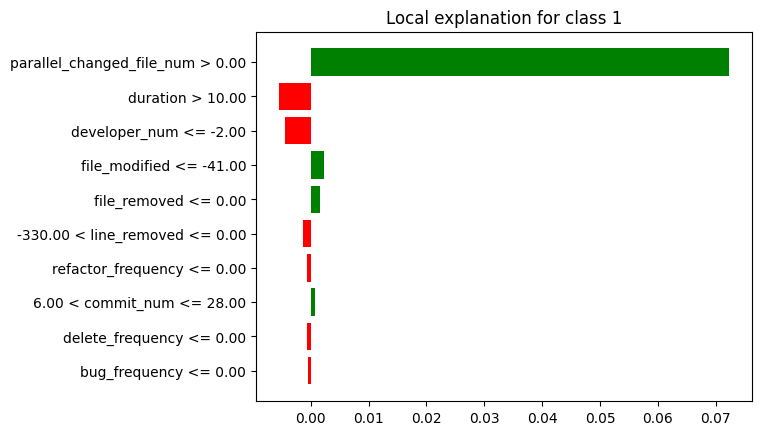

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2              developer_num        3  Negativo
3                 commit_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2              developer_num        3  Negativo
3                 commit_num        4  Positivo
4               file_removed        5  Negativo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2              developer_num        3  Negativo
3              file_modified        4  Positivo
4               file_removed        5  Positivo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'duration', 'developer_num', 'commit_num', 'file_removed']
['parallel_changed_file_num', 'duration', 'developer_num', 'commit_num', 'file_removed']
['parallel_changed_file_num', 'duration', 'developer_num', 'file_modified', 'file_removed']
['parallel_changed_file_num', 'file_removed', 'duration', 'file_modified', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         5  Negativo       5  Negativo       5   
2                   duration         2  Negativo       2  Negativo       2   
3              file_modified         -         -       -         -       4   
4                 commit_num         4  Positivo       4  Positivo       -   
5              developer_num         3  Negativo       3  Negativo       3   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3  Positivo  
4         -  
5  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "developer_num", "commit_num", "file_removed", "file_modified"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Negativo       2  Negativo       2   
developer_num                     3  Negativo       3  Negativo       3   
commit_num                        4  Positivo       4  Positivo       -   
file_removed                      5  Negativo       5  Negativo       5   
file_modified                     -         -       -         -       4   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Negativo  
developer_num              Negativo  
commit_num                        -  
file_removed               Positivo  
file_modified              Positivo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('commit_num', 2), ('duration', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 3), ('duration', 4), ('commit_num', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('commit_num', 4), ('file_removed', 5)], 'Shapley': [('parallel_changed_file_num', 1), ('commit_num', 2), ('duration', 3), ('developer_num', 4), ('file_removed', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 3), ('duration', 5), ('commit_num', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('developer_num', 3), ('commit_num', 4), ('file_removed', 5)], 'Lime': [('parallel_changed_file_num', 1), ('commit_num', 2), ('duration', 3), ('developer_num', 5), ('file_modified', 4), ('parallel_changed_file_num', 1), ('file_removed', 3), ('duration', 4), ('file_modified', 2), ('line_removed', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('de

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_ada_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                          -      -             -      -   
developer_num                  3.333333      3      3.333333      3   
commit_num                     3.666667      3      3.333333      3   
file_modified                         -      -             -      -   
duration                            3.0      3      3.333333      3   
file_removed                        4.0      3           4.0      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
line_removed                   5.000000      1  
developer_num                  4.000000      2  
commit_num                     2.000000      1  
file_modified                  3.333333      3  
duration                       3.000000      3  
file_removed                   4.000000      2  
parallel_changed_file_num      1.000000      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_ada_fn[("General", "Conteo Total")] = df_resumen_ada_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                          -      -             -      -   
developer_num                  3.333333      3      3.333333      3   
commit_num                     3.666667      3      3.333333      3   
file_modified                         -      -             -      -   
duration                            3.0      3      3.333333      3   
file_removed                        4.0      3           4.0      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
line_removed                   5.000000      1  5.000000            1  
developer_num                  4.000000      2  3.555556            8  
commit_num                     2.000000      1  3.000000            7  
file_modified                  3.333333      3  3.333333            3  
duration                       3.000000      3  3.111111            9  
file_removed                   4.000000      2  4.000000            8  
parallel_changed_file_num      1.000000      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_ada_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_ada_fn[("General", "Peso Rango")] = 1 - ((df_resumen_ada_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_ada_fn[("General", "Peso Conteo")] = df_resumen_ada_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_ada_fn[("General", "Puntaje")] = df_resumen_ada_fn[("General", "Peso Rango")] + df_resumen_ada_fn[("General", "Peso Conteo")]
df_resumen_ada_fn[("General", "Ranking")] = df_resumen_ada_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_ada_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_ada_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_ada_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
line_removed                          -      -             -      -   
developer_num                  3.333333      3      3.333333      3   
commit_num                     3.666667      3      3.333333      3   
file_modified                         -      -             -      -   
duration                            3.0      3      3.333333      3   
file_removed                        4.0      3           4.0      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
line_removed                   5.000000      1     7.0            1  
developer_num                  4.000000      2     4.0            8  
commit_num                     2.000000      1     3.0            7  
file_modified                  3.333333      3     6.0            3  
duration                       3.000000      3     2.0            9  
file_removed                   4.000000      2     5.0            8  
parallel_changed_file_num      1.000000      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_ada_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_ada_fn = df_resumen_ada_fn[new_columns]

In [ ]:
df_resumen_ada_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_ada_fn[(tech, "Ranking Medio")] = df_resumen_ada_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_ada_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
duration                      2.0            9          3.00      3   
commit_num                    3.0            7          3.67      3   
developer_num                 4.0            8          3.33      3   
file_removed                  5.0            8          4.00      3   
file_modified                 6.0            3             -      -   
line_removed                  7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
duration                           3.33      3          3.00      3  
commit_num                         3.33      3          2.00      1  
developer_num                      3.33      3          4.00      2  
file_removed                       4.00      3          4.00      2  
file_modified                         -      -          3.33      3  
line_removed                          -      -          5.00      1

## **RUSBoost:**

**FEATURE IMPORTANCE**

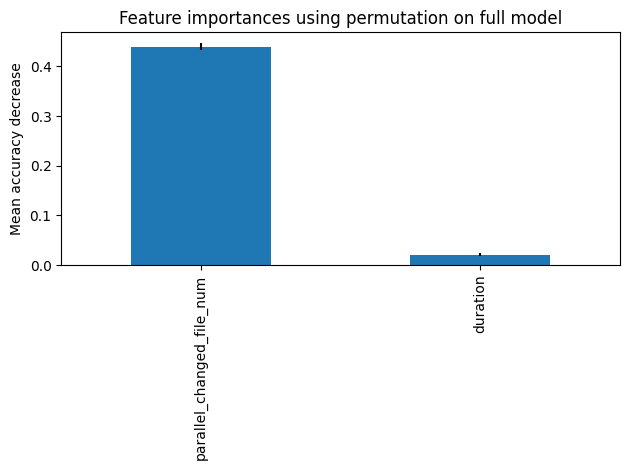

In [ ]:
permu = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2, scoring='f1')

# Umbral para valores significativos
importance_threshold = 0.01

# Filtrar los caracteristicas
significant_indices = permu.importances_mean > importance_threshold
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[significant_indices]
permu_std = permu.importances_std[significant_indices]

# Crear la representación gráfica
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

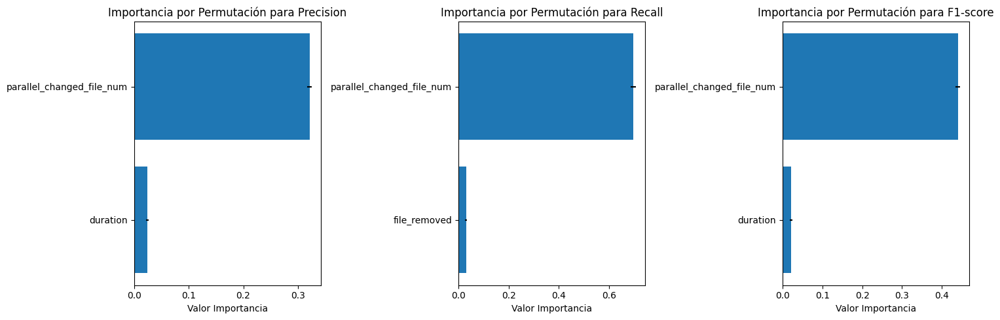

In [ ]:
scoring = ['precision', 'recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Umbral para importancias significativas
importance_threshold = 0.01

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición del umbral
    significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
    sorted_feature_names = [feature_names[j] for j in significant_indices]
    importances_mean = permu.importances_mean[significant_indices]
    importances_std = permu.importances_std[significant_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()


In [ ]:
scoring = ['precision','recall','f1']
metric_names = ['Precision', 'Recall', 'F1-score']

# Umbral para importancias significativas
importance_threshold = 0.01

# Crea un diccionario para almacenar los DataFrames
results_global_rus = {}

permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  significant_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j] > importance_threshold]
  sorted_feature_names = [feature_names[j] for j in significant_indices]
  importances_mean = permu.importances_mean[significant_indices]
  importances_std = permu.importances_std[significant_indices]

  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rus[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rus['df_global_Precision']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.321474,0.004538
1,duration,0.023812,0.002520


In [ ]:
results_global_rus['df_global_Recall']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.696974,0.010341
1,file_removed,0.030049,0.003164


In [ ]:
results_global_rus['df_global_F1-score']

,Feature,Importance_Mean,Importance_Std
0,parallel_changed_file_num,0.440049,0.006301
1,duration,0.021398,0.003255


In [ ]:
scoring = ['accuracy', 'precision', 'recall','f1']
permu_score = permutation_importance(modelo_rus, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for metric in permu_score:
  print(f"\nUsando como referencia: {metric}\n")
  permu = permu_score[metric]
  for i in permu.importances_mean.argsort()[::-1]:
    if abs(permu.importances_mean[i].round(3)) > 0.000:
      print(f"    {feature_names[i]:<30}"
      f"{permu.importances_mean[i]:.3f}"
      f" +/- {permu.importances_std[i]:.3f}")


Usando como referencia: accuracy

    parallel_changed_file_num     0.138 +/- 0.002
    duration                      0.013 +/- 0.001
    developer_num                 0.001 +/- 0.000
    file_removed                  -0.006 +/- 0.001

Usando como referencia: precision

    parallel_changed_file_num     0.321 +/- 0.005
    duration                      0.024 +/- 0.003
    developer_num                 0.002 +/- 0.001
    file_removed                  -0.010 +/- 0.002

Usando como referencia: recall

    parallel_changed_file_num     0.697 +/- 0.010
    file_removed                  0.030 +/- 0.003
    developer_num                 0.004 +/- 0.002
    duration                      -0.008 +/- 0.006

Usando como referencia: f1

    parallel_changed_file_num     0.440 +/- 0.006
    duration                      0.021 +/- 0.003
    developer_num                 0.002 +/- 0.001
    file_removed                  -0.003 +/- 0.002


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rus, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 35239 rows 25 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 35239 values
  -> model_class       : imblearn.ensemble._weight_boosting.RUSBoostClassifier (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_proba_default at 0x7f5310c49b40> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 0.464, mean = 0.481, max = 0.556
  -> model type        : classification will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.55, mean = -0.387, max = 0.536
  -> model_info        : package imblearn

A new explainer has been created!


### **Instancia VP MAX:**

In [ ]:
breakdown_vp_max = exp.predict_parts(df_instancia_vp_max, type="break_down",random_state=42)
shap_vp_max = exp.predict_parts(df_instancia_vp_max, type="shap",random_state=42)
lime_vp_max = exp.predict_surrogate(df_instancia_vp_max, random_state=42)

breakdown_vp_df_max = breakdown_vp_max.result
shap_vp_df_max = shap_vp_max.result
lime_vp_df_max=lime_vp_max.result

In [ ]:
breakdown_vp_max.plot()

In [ ]:
shap_vp_max.plot()

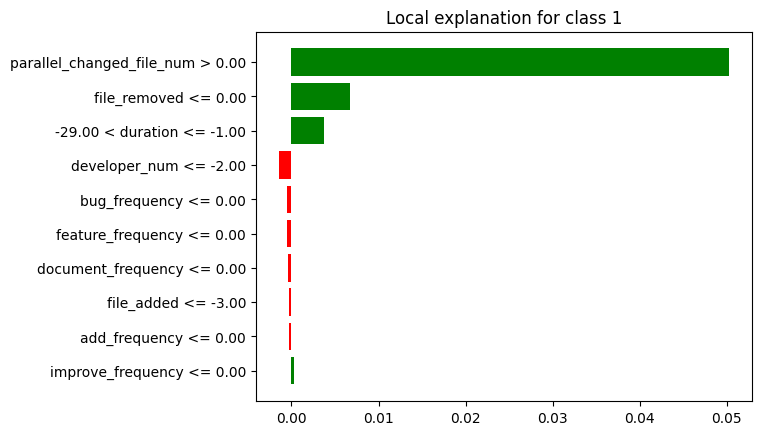

In [ ]:
lime_vp_max.plot()

In [ ]:
breakdown_vp_df_max = breakdown_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_max = breakdown_vp_df_max.drop(index=[0, 26])
breakdown_vp_df_max['sign'] = breakdown_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_max = breakdown_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_max = shap_vp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_max = shap_vp_df_max.tail(25)
shap_vp_df_max['sign'] = shap_vp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_max = shap_vp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_max["Variable"] = lime_vp_df_max["variable"].str.split(" ").str[0]
lime_vp_df_max["Signo"] = lime_vp_df_max["effect"].apply(evaluar_valor)
lime_vp_df_max = lime_vp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_max = lime_vp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_max['Ranking'] = breakdown_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_max = breakdown_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_max['Ranking'] = shap_vp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_max = shap_vp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_max['Ranking'] = lime_vp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_max = lime_vp_df_max.head(5)
lime_vp_df_max = lime_vp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_max = breakdown_vp_df_max.drop(columns=['contribution'])
shap_vp_df_max = shap_vp_df_max.drop(columns=['contribution'])
lime_vp_df_max = lime_vp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_max = breakdown_vp_df_max.head(5)
breakdown_vp_df_max = breakdown_vp_df_max.reset_index(drop=True)

shap_vp_df_max = shap_vp_df_max.head(5)
shap_vp_df_max = shap_vp_df_max.reset_index(drop=True)

lime_vp_df_max = lime_vp_df_max.reset_index(drop=True)
lime_vp_df_max.at[2, 'Variable'] = 'duration'

print(breakdown_vp_df_max)
print(shap_vp_df_max)
print(lime_vp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_max['Variable'])
shapley_features = list(shap_vp_df_max['Variable'])
lime_features = list(lime_vp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_max[breakdown_vp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_max[shap_vp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_max[lime_vp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'bug_frequency', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         2  Positivo       2  Positivo       2   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         3  Positivo       3  Positivo       3   
4              bug_frequency         -         -       -         -       5   
5                 commit_num        15      Nulo       -         -       -   
6              developer_num         4  Negativo       4  Negativo       4   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Positivo  
4  Negativo  
5         -  
6  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "duration", "developer_num", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Positivo       2  Positivo       2   
duration                          3  Positivo       3  Positivo       3   
developer_num                     4  Negativo       4  Negativo       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
duration                   Positivo  
developer_num              Negativo  
bug_frequency              Negativo

### **Instancia VP MEDIANA:**

In [ ]:
breakdown_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="break_down",random_state=42)
shap_vp_mediana = exp.predict_parts(df_instancia_vp_mediana, type="shap",random_state=42)
lime_vp_mediana = exp.predict_surrogate(df_instancia_vp_mediana, random_state=42)

breakdown_vp_df_mediana = breakdown_vp_mediana.result
shap_vp_df_mediana = shap_vp_mediana.result
lime_vp_df_mediana=lime_vp_mediana.result

In [ ]:
breakdown_vp_mediana.plot()

In [ ]:
shap_vp_mediana.plot()

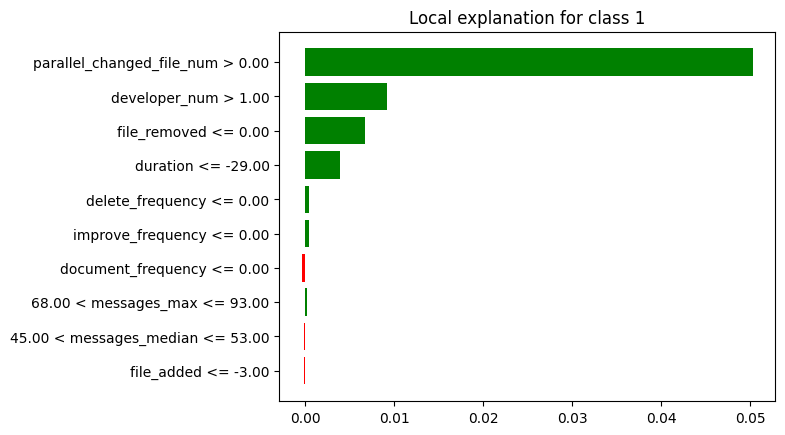

In [ ]:
lime_vp_mediana.plot()

In [ ]:
breakdown_vp_df_mediana = breakdown_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(index=[0, 26])
breakdown_vp_df_mediana['sign'] = breakdown_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_mediana = breakdown_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_mediana = shap_vp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_mediana = shap_vp_df_mediana.tail(25)
shap_vp_df_mediana['sign'] = shap_vp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_mediana = shap_vp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_mediana["Variable"] = lime_vp_df_mediana["variable"].str.split(" ").str[0]
lime_vp_df_mediana["Signo"] = lime_vp_df_mediana["effect"].apply(evaluar_valor)
lime_vp_df_mediana = lime_vp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_mediana['Ranking'] = breakdown_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_mediana = breakdown_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_mediana['Ranking'] = shap_vp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_mediana = shap_vp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_mediana['Ranking'] = lime_vp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_mediana = lime_vp_df_mediana.head(5)
lime_vp_df_mediana = lime_vp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_mediana = breakdown_vp_df_mediana.drop(columns=['contribution'])
shap_vp_df_mediana = shap_vp_df_mediana.drop(columns=['contribution'])
lime_vp_df_mediana = lime_vp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_mediana = breakdown_vp_df_mediana.head(5)
breakdown_vp_df_mediana = breakdown_vp_df_mediana.reset_index(drop=True)

shap_vp_df_mediana = shap_vp_df_mediana.head(5)
shap_vp_df_mediana = shap_vp_df_mediana.reset_index(drop=True)

lime_vp_df_mediana = lime_vp_df_mediana.reset_index(drop=True)

print(breakdown_vp_df_mediana)
print(shap_vp_df_mediana)
print(lime_vp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                   duration        3  Positivo
3               file_removed        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                   duration        3  Positivo
3               file_removed        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Positivo
3                   duration        4  Positivo
4           delete_frequency        5  Positivo


In [ ]:
#lime_vp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_mediana['Variable'])
shapley_features = list(shap_vp_df_mediana['Variable'])
lime_features = list(lime_vp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_mediana[breakdown_vp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_mediana[shap_vp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_mediana[lime_vp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'duration', 'file_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'duration', 'file_removed', 'fix_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'duration', 'delete_frequency']
['delete_frequency', 'parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0           delete_frequency         -         -       -         -       5   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2               file_removed         4  Negativo       4  Negativo       3   
3              fix_frequency         -         -      15      Nulo       -   
4                   duration         3  Positivo       3  Positivo       4   
5                 commit_num        15      Nulo       -         -       -   
6              developer_num         2  Positivo       2  Positivo       2   

             
      Signo  
0  Positivo  
1  Positivo  
2  Positivo  
3         -  
4  Positivo  
5         -  
6  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "file_removed", "delete_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
duration                          3  Positivo       3  Positivo       4   
file_removed                      4  Negativo       4  Negativo       3   
delete_frequency                  -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
duration                   Positivo  
file_removed               Positivo  
delete_frequency           Positivo

### **Instancia VP MIN:**

In [ ]:
breakdown_vp_min = exp.predict_parts(df_instancia_vp_min, type="break_down",random_state=42)
shap_vp_min = exp.predict_parts(df_instancia_vp_min, type="shap",random_state=42)
lime_vp_min = exp.predict_surrogate(df_instancia_vp_min, random_state=42)

breakdown_vp_df_min = breakdown_vp_min.result
shap_vp_df_min = shap_vp_min.result
lime_vp_df_min = lime_vp_min.result

In [ ]:
breakdown_vp_min.plot()

In [ ]:
shap_vp_min.plot()

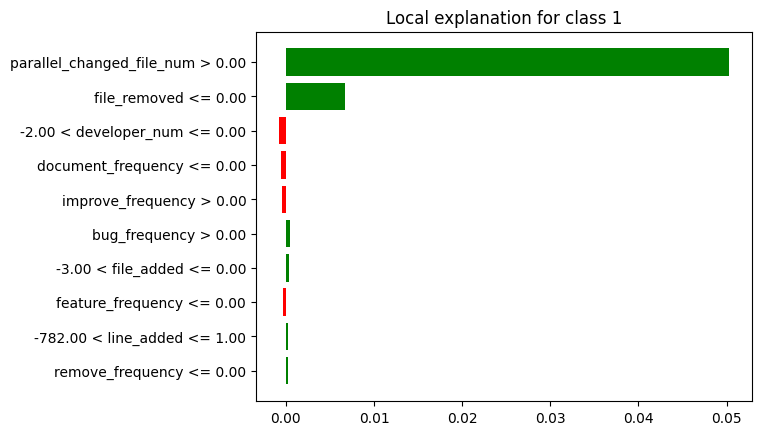

In [ ]:
lime_vp_min.plot()

In [ ]:
breakdown_vp_df_min = breakdown_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vp_df_min = breakdown_vp_df_min.drop(index=[0, 26])
breakdown_vp_df_min['sign'] = breakdown_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vp_df_min = breakdown_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vp_df_min = shap_vp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vp_df_min = shap_vp_df_min.tail(25)
shap_vp_df_min['sign'] = shap_vp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vp_df_min = shap_vp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vp_df_min["Variable"] = lime_vp_df_min["variable"].str.split(" ").str[0]
lime_vp_df_min["Signo"] = lime_vp_df_min["effect"].apply(evaluar_valor)
lime_vp_df_min = lime_vp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vp_df_min = lime_vp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vp_df_min['Ranking'] = breakdown_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vp_df_min = breakdown_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vp_df_min['Ranking'] = shap_vp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vp_df_min = shap_vp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vp_df_min['Ranking'] = lime_vp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vp_df_min = lime_vp_df_min.head(5)
lime_vp_df_min = lime_vp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vp_df_min = breakdown_vp_df_min.drop(columns=['contribution'])
shap_vp_df_min = shap_vp_df_min.drop(columns=['contribution'])
lime_vp_df_min = lime_vp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vp_df_min = breakdown_vp_df_min.head(5)
breakdown_vp_df_min = breakdown_vp_df_min.reset_index(drop=True)

shap_vp_df_min = shap_vp_df_min.head(5)
shap_vp_df_min = shap_vp_df_min.reset_index(drop=True)

lime_vp_df_min = lime_vp_df_min.reset_index(drop=True)
lime_vp_df_min.at[2, 'Variable'] = 'developer_num'

print(breakdown_vp_df_min)
print(shap_vp_df_min)
print(lime_vp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2              developer_num        3  Negativo
3         document_frequency        4  Negativo
4          improve_frequency        5  Negativo


In [ ]:
#lime_vp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vp_df_min['Variable'])
shapley_features = list(shap_vp_df_min['Variable'])
lime_features = list(lime_vp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vp_df_min[breakdown_vp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vp_df_min[shap_vp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vp_df_min[lime_vp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'developer_num', 'document_frequency', 'improve_frequency']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'document_frequency', 'commit_num', 'developer_num', 'improve_frequency']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         2  Positivo       2  Positivo       2   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         3  Positivo       3  Positivo       -   
4         document_frequency         -         -       -         -       4   
5                 commit_num        15      Nulo       -         -       -   
6              developer_num         4  Negativo       4  Negativo       3   
7          improve_frequency         -         -       -         -       5   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3         -  
4  Negativo  
5         -  
6  Negativo  
7  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "duration", "developer_num", "document_frequency", "improve_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Positivo       2  Positivo       2   
duration                          3  Positivo       3  Positivo       -   
developer_num                     4  Negativo       4  Negativo       3   
document_frequency                -         -       -         -       4   
improve_frequency                 -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
duration                          -  
developer_num              Negativo  
document_frequency         Negativo  
improve_frequency          Negativo

### **VP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4)], 'Shapley': [('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('bug_frequency', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 4), ('file_removed', 3), ('delete_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 3), ('document_frequency', 4), ('improve_frequency', 5)]}
{'Breakdown': {'parallel_changed

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                     -      -             -      -   
developer_num                  3.333333      3      3.333333      3   
document_frequency                    -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            3.0      3           3.0      3   
file_removed                   2.666667      3      2.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
delete_frequency                      -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
improve_frequency              5.000000      1  
developer_num                  3.000000      3  
document_frequency             4.000000      1  
bug_frequency                  5.000000      1  
duration                       3.500000      2  
file_removed                   2.333333      3  
parallel_changed_file_num      1.000000      3  
delete_frequency               5.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vp[("General", "Conteo Total")] = df_resumen_rus_vp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                     -      -             -      -   
developer_num                  3.333333      3      3.333333      3   
document_frequency                    -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            3.0      3           3.0      3   
file_removed                   2.666667      3      2.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
delete_frequency                      -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
improve_frequency              5.000000      1  5.000000            1  
developer_num                  3.000000      3  3.222222            9  
document_frequency             4.000000      1  4.000000            1  
bug_frequency                  5.000000      1  5.000000            1  
duration                       3.500000      2  3.166667            8  
file_removed                   2.333333      3  2.555556            9  
parallel_changed_file_num      1.000000      3  1.000000            9  
delete_frequency               5.000000      1  5.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vp[("General", "Peso Conteo")] = df_resumen_rus_vp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vp[("General", "Puntaje")] = df_resumen_rus_vp[("General", "Peso Rango")] + df_resumen_rus_vp[("General", "Peso Conteo")]
df_resumen_rus_vp[("General", "Ranking")] = df_resumen_rus_vp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
improve_frequency                     -      -             -      -   
developer_num                  3.333333      3      3.333333      3   
document_frequency                    -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            3.0      3           3.0      3   
file_removed                   2.666667      3      2.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   
delete_frequency                      -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
improve_frequency              5.000000      1     6.0            1  
developer_num                  3.000000      3     3.0            9  
document_frequency             4.000000      1     5.0            1  
bug_frequency                  5.000000      1     6.0            1  
duration                       3.500000      2     4.0            8  
file_removed                   2.333333      3     2.0            9  
parallel_changed_file_num      1.000000      3     1.0            9  
delete_frequency               5.000000      1     6.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vp = df_resumen_rus_vp[new_columns]

In [ ]:
df_resumen_rus_vp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vp[(tech, "Ranking Medio")] = df_resumen_rus_vp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            9          2.67      3   
developer_num                 3.0            9          3.33      3   
duration                      4.0            8          3.00      3   
document_frequency            5.0            1             -      -   
improve_frequency             6.0            1             -      -   
bug_frequency                 6.0            1             -      -   
delete_frequency              6.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                       2.67      3          2.33      3  
developer_num                      3.33      3          3.00      3  
duration                           3.00      3          3.50      2  
document_frequency                    -      -          4.00      1  
improve_frequency                     -      -          5.00      1  
bug_frequency                         -      -          5.00      1  
delete_frequency                      -      -          5.00      1

### **Instancia VN MAX:**

In [ ]:
breakdown_vn_max = exp.predict_parts(df_instancia_vn_max, type="break_down",random_state=42)
shap_vn_max = exp.predict_parts(df_instancia_vn_max, type="shap",random_state=42)
lime_vn_max = exp.predict_surrogate(df_instancia_vn_max, random_state=42)

breakdown_vn_df_max = breakdown_vn_max.result
shap_vn_df_max = shap_vn_max.result
lime_vn_df_max = lime_vn_max.result

In [ ]:
breakdown_vn_max.plot()

In [ ]:
shap_vn_max.plot()

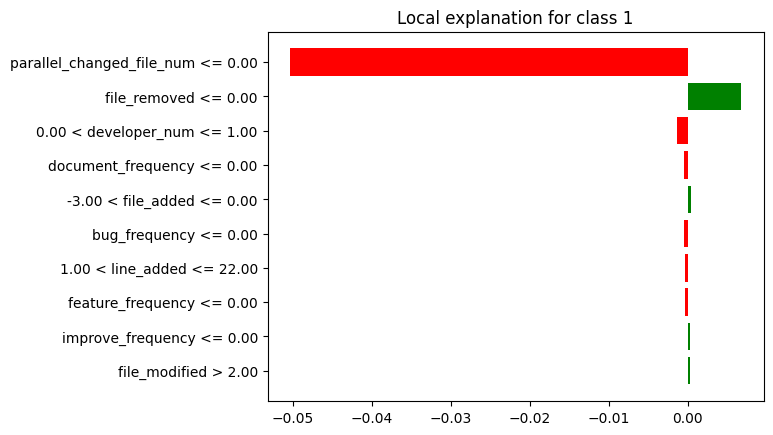

In [ ]:
lime_vn_max.plot()

In [ ]:
breakdown_vn_df_max = breakdown_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_max = breakdown_vn_df_max.drop(index=[0, 26])
breakdown_vn_df_max['sign'] = breakdown_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_max = breakdown_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_max = shap_vn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_max = shap_vn_df_max.tail(25)
shap_vn_df_max['sign'] = shap_vn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_max = shap_vn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_max["Variable"] = lime_vn_df_max["variable"].str.split(" ").str[0]
lime_vn_df_max["Signo"] = lime_vn_df_max["effect"].apply(evaluar_valor)
lime_vn_df_max = lime_vn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_max = lime_vn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_max['Ranking'] = breakdown_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_max = breakdown_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_max['Ranking'] = shap_vn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_max = shap_vn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_max['Ranking'] = lime_vn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_max = lime_vn_df_max.head(5)
lime_vn_df_max = lime_vn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_vn_df_max = breakdown_vn_df_max.drop(columns=['contribution'])
shap_vn_df_max = shap_vn_df_max.drop(columns=['contribution'])
lime_vn_df_max = lime_vn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_max = breakdown_vn_df_max.head(5)
breakdown_vn_df_max = breakdown_vn_df_max.reset_index(drop=True)

shap_vn_df_max = shap_vn_df_max.head(5)
shap_vn_df_max = shap_vn_df_max.reset_index(drop=True)

lime_vn_df_max = lime_vn_df_max.reset_index(drop=True)
lime_vn_df_max.at[2, 'Variable'] = 'developer_num'
lime_vn_df_max.at[4, 'Variable'] = 'file_added'

print(breakdown_vn_df_max)
print(shap_vn_df_max)
print(lime_vn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4          feature_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              developer_num        3  Negativo
3         document_frequency        4  Negativo
4                 file_added        5  Positivo


In [ ]:
#lime_vn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_max['Variable'])
shapley_features = list(shap_vn_df_max['Variable'])
lime_features = list(lime_vn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_max[breakdown_vn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_max[shap_vn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_max[lime_vn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'feature_frequency']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'developer_num', 'document_frequency', 'file_added']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'file_added', 'feature_frequency', 'document_frequency', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         3  Negativo       3  Negativo       2   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         2  Negativo       2  Negativo       -   
4                 file_added         -         -       -         -       5   
5          feature_frequency        15      Nulo       -         -       -   
6         document_frequency         -         -       -         -       4   
7              developer_num         4  Negativo       4  Negativo       3   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3         -  
4  Positivo  
5         -  
6  Negativo  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "file_removed", "developer_num", "document_frequency", "file_added"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
duration                          2  Negativo       2  Negativo       -   
file_removed                      3  Negativo       3  Negativo       2   
developer_num                     4  Negativo       4  Negativo       3   
document_frequency                -         -       -         -       4   
file_added                        -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
duration                          -  
file_removed               Positivo  
developer_num              Negativo  
document_frequency         Negativo  
file_added                 Positivo

### **Instancia VN MEDIANA:**

In [ ]:
breakdown_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="break_down",random_state=42)
shap_vn_mediana = exp.predict_parts(df_instancia_vn_mediana, type="shap",random_state=42)
lime_vn_mediana = exp.predict_surrogate(df_instancia_vn_mediana, random_state=42)

breakdown_vn_df_mediana = breakdown_vn_mediana.result
shap_vn_df_mediana = shap_vn_mediana.result
lime_vn_df_mediana = lime_vn_mediana.result

In [ ]:
breakdown_vn_mediana.plot()

In [ ]:
shap_vn_mediana.plot()

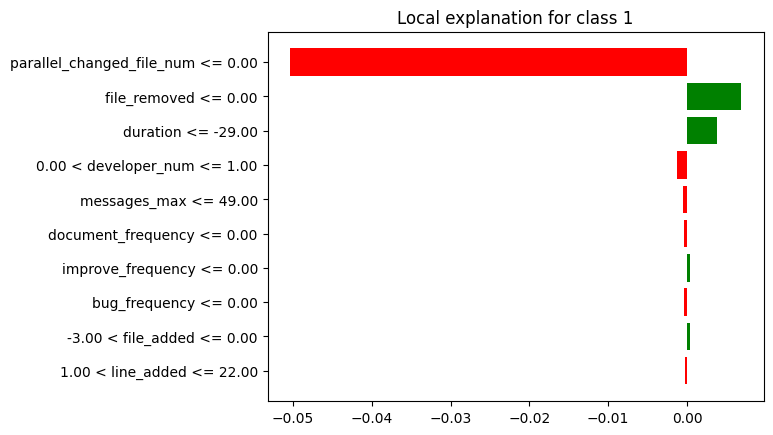

In [ ]:
lime_vn_mediana.plot()

In [ ]:
breakdown_vn_df_mediana = breakdown_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(index=[0, 26])
breakdown_vn_df_mediana['sign'] = breakdown_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_mediana = breakdown_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_mediana = shap_vn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_mediana = shap_vn_df_mediana.tail(25)
shap_vn_df_mediana['sign'] = shap_vn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_mediana = shap_vn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_mediana["Variable"] = lime_vn_df_mediana["variable"].str.split(" ").str[0]
lime_vn_df_mediana["Signo"] = lime_vn_df_mediana["effect"].apply(evaluar_valor)
lime_vn_df_mediana = lime_vn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_mediana['Ranking'] = breakdown_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_mediana = breakdown_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_mediana['Ranking'] = shap_vn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_mediana = shap_vn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_mediana['Ranking'] = lime_vn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_mediana = lime_vn_df_mediana.head(5)
lime_vn_df_mediana = lime_vn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_vn_df_mediana = breakdown_vn_df_mediana.drop(columns=['contribution'])
shap_vn_df_mediana = shap_vn_df_mediana.drop(columns=['contribution'])
lime_vn_df_mediana = lime_vn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_mediana = breakdown_vn_df_mediana.head(5)
breakdown_vn_df_mediana = breakdown_vn_df_mediana.reset_index(drop=True)

shap_vn_df_mediana = shap_vn_df_mediana.head(5)
shap_vn_df_mediana = shap_vn_df_mediana.reset_index(drop=True)

lime_vn_df_mediana = lime_vn_df_mediana.reset_index(drop=True)
lime_vn_df_mediana.at[3, 'Variable'] = 'developer_num'

print(breakdown_vn_df_mediana)
print(shap_vn_df_mediana)
print(lime_vn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4               messages_max       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Positivo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4               messages_max        5  Negativo


In [ ]:
#lime_vn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_mediana['Variable'])
shapley_features = list(shap_vn_df_mediana['Variable'])
lime_features = list(lime_vn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_mediana[breakdown_vn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_mediana[shap_vn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_mediana[lime_vn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'messages_max']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'messages_max']
['parallel_changed_file_num', 'messages_max', 'file_removed', 'fix_frequency', 'duration', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               messages_max        15      Nulo       -         -       5   
2               file_removed         3  Negativo       3  Negativo       2   
3              fix_frequency         -         -      15      Nulo       -   
4                   duration         2  Positivo       2  Positivo       3   
5              developer_num         4  Negativo       4  Negativo       4   

             
      Signo  
0  Negativo  
1  Negativo  
2  Positivo  
3         -  
4  Positivo  
5  Negativo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "file_removed", "developer_num", "fix_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
duration                          2  Positivo       2  Positivo       3   
file_removed                      3  Negativo       3  Negativo       2   
developer_num                     4  Negativo       4  Negativo       4   
fix_frequency                     -         -      15      Nulo       -   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
duration                   Positivo  
file_removed               Positivo  
developer_num              Negativo  
fix_frequency                     -

### **Instancia VN MIN:**

In [ ]:
breakdown_vn_min = exp.predict_parts(df_instancia_vn_min, type="break_down",random_state=42)
shap_vn_min = exp.predict_parts(df_instancia_vn_min, type="shap",random_state=42)
lime_vn_min = exp.predict_surrogate(df_instancia_vn_min, random_state=42)

breakdown_vn_df_min = breakdown_vn_min.result
shap_vn_df_min = shap_vn_min.result
lime_vn_df_min = lime_vn_min.result

In [ ]:
breakdown_vn_min.plot()

In [ ]:
shap_vn_min.plot()

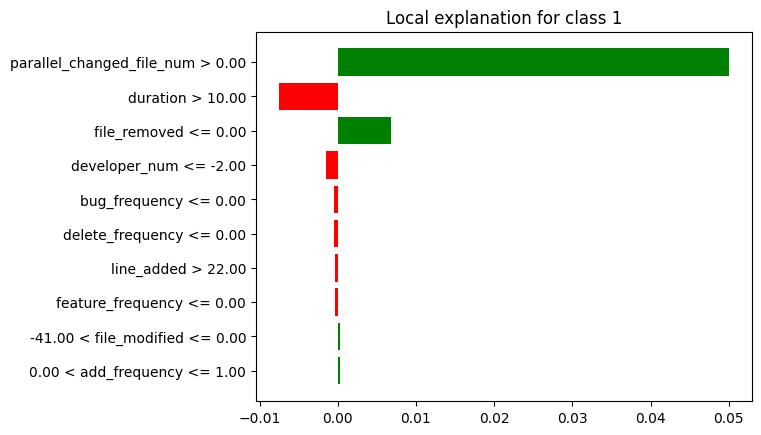

In [ ]:
lime_vn_min.plot()

In [ ]:
breakdown_vn_df_min = breakdown_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_vn_df_min = breakdown_vn_df_min.drop(index=[0, 26])
breakdown_vn_df_min['sign'] = breakdown_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_vn_df_min = breakdown_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_vn_df_min = shap_vn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_vn_df_min = shap_vn_df_min.tail(25)
shap_vn_df_min['sign'] = shap_vn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_vn_df_min = shap_vn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_vn_df_min["Variable"] = lime_vn_df_min["variable"].str.split(" ").str[0]
lime_vn_df_min["Signo"] = lime_vn_df_min["effect"].apply(evaluar_valor)
lime_vn_df_min = lime_vn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_vn_df_min = lime_vn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_vn_df_min['Ranking'] = breakdown_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_vn_df_min = breakdown_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_vn_df_min['Ranking'] = shap_vn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_vn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_vn_df_min = shap_vn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_vn_df_min['Ranking'] = lime_vn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_vn_df_min = lime_vn_df_min.head(5)
lime_vn_df_min = lime_vn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_vn_df_min = breakdown_vn_df_min.drop(columns=['contribution'])
shap_vn_df_min = shap_vn_df_min.drop(columns=['contribution'])
lime_vn_df_min = lime_vn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_vn_df_min = breakdown_vn_df_min.head(5)
breakdown_vn_df_min = breakdown_vn_df_min.reset_index(drop=True)

shap_vn_df_min = shap_vn_df_min.head(5)
shap_vn_df_min = shap_vn_df_min.reset_index(drop=True)

lime_vn_df_min = lime_vn_df_min.reset_index(drop=True)

print(breakdown_vn_df_min)
print(shap_vn_df_min)
print(lime_vn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2               file_removed        3  Positivo
3              developer_num        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_vn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_vn_df_min['Variable'])
shapley_features = list(shap_vn_df_min['Variable'])
lime_features = list(lime_vn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_vn_df_min[breakdown_vn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_vn_df_min[shap_vn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_vn_df_min[lime_vn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'bug_frequency', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         3  Negativo       3  Negativo       3   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         2  Negativo       2  Negativo       2   
4              bug_frequency         -         -       -         -       5   
5                 commit_num        15      Nulo       -         -       -   
6              developer_num         4  Negativo       4  Negativo       4   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Negativo  
4  Negativo  
5         -  
6  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "file_removed", "developer_num", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Negativo       2  Negativo       2   
file_removed                      3  Negativo       3  Negativo       3   
developer_num                     4  Negativo       4  Negativo       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Negativo  
file_removed               Positivo  
developer_num              Negativo  
bug_frequency              Negativo

### **VN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4)], 'Shapley': [('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('fix_frequency', 15), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 3), ('document_frequency', 4), ('file_added', 5), ('parallel_changed_file_num', 1), ('duration', 3), ('file_removed', 2), ('developer_num', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('bug_frequency', 5)]}
{'Breakdown': {'parallel_changed_file_num

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_vn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                       4.0      3           4.0      3   
document_frequency                    -      -             -      -   
file_added                            -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            2.0      3           2.0      3   
fix_frequency                         -      -          15.0      1   
file_removed                        3.0      3           3.0      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
developer_num                  3.666667      3  
document_frequency                  4.0      1  
file_added                          5.0      1  
bug_frequency                       5.0      1  
duration                            2.5      2  
fix_frequency                         -      -  
file_removed                   2.333333      3  
parallel_changed_file_num           1.0      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_vn[("General", "Conteo Total")] = df_resumen_rus_vn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                       4.0      3           4.0      3   
document_frequency                    -      -             -      -   
file_added                            -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            2.0      3           2.0      3   
fix_frequency                         -      -          15.0      1   
file_removed                        3.0      3           3.0      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime           General               
                          Ranking Medio Conteo    Ranking Conteo Total  
developer_num                  3.666667      3   3.888889            9  
document_frequency                  4.0      1   4.000000            1  
file_added                          5.0      1   5.000000            1  
bug_frequency                       5.0      1   5.000000            1  
duration                            2.5      2   2.166667            8  
fix_frequency                         -      -  15.000000            1  
file_removed                   2.333333      3   2.777778            9  
parallel_changed_file_num           1.0      3   1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_vn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_vn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_vn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_vn[("General", "Peso Conteo")] = df_resumen_rus_vn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_vn[("General", "Puntaje")] = df_resumen_rus_vn[("General", "Peso Rango")] + df_resumen_rus_vn[("General", "Peso Conteo")]
df_resumen_rus_vn[("General", "Ranking")] = df_resumen_rus_vn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_vn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_vn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_vn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                       4.0      3           4.0      3   
document_frequency                    -      -             -      -   
file_added                            -      -             -      -   
bug_frequency                         -      -             -      -   
duration                            2.0      3           2.0      3   
fix_frequency                         -      -          15.0      1   
file_removed                        3.0      3           3.0      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
developer_num                  3.666667      3     3.0            9  
document_frequency                  4.0      1     5.0            1  
file_added                          5.0      1     6.0            1  
bug_frequency                       5.0      1     6.0            1  
duration                            2.5      2     3.0            8  
fix_frequency                         -      -     8.0            1  
file_removed                   2.333333      3     2.0            9  
parallel_changed_file_num           1.0      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_vn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_vn = df_resumen_rus_vn[new_columns]

In [ ]:
df_resumen_rus_vn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_vn[(tech, "Ranking Medio")] = df_resumen_rus_vn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_vn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            9          3.00      3   
developer_num                 3.0            9          4.00      3   
duration                      3.0            8          2.00      3   
document_frequency            5.0            1             -      -   
file_added                    6.0            1             -      -   
bug_frequency                 6.0            1             -      -   
fix_frequency                 8.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                       3.00      3          2.33      3  
developer_num                      4.00      3          3.67      3  
duration                           2.00      3          2.50      2  
document_frequency                    -      -          4.00      1  
file_added                            -      -          5.00      1  
bug_frequency                         -      -          5.00      1  
fix_frequency                     15.00      1             -      -

### **Instancia FP MAX:**

In [ ]:
breakdown_fp_max = exp.predict_parts(df_instancia_fp_max, type="break_down",random_state=42)
shap_fp_max = exp.predict_parts(df_instancia_fp_max, type="shap",random_state=42)
lime_fp_max = exp.predict_surrogate(df_instancia_fp_max, random_state=42)

breakdown_fp_df_max = breakdown_fp_max.result
shap_fp_df_max = shap_fp_max.result
lime_fp_df_max=lime_fp_max.result

In [ ]:
breakdown_fp_max.plot()

In [ ]:
shap_fp_max.plot()

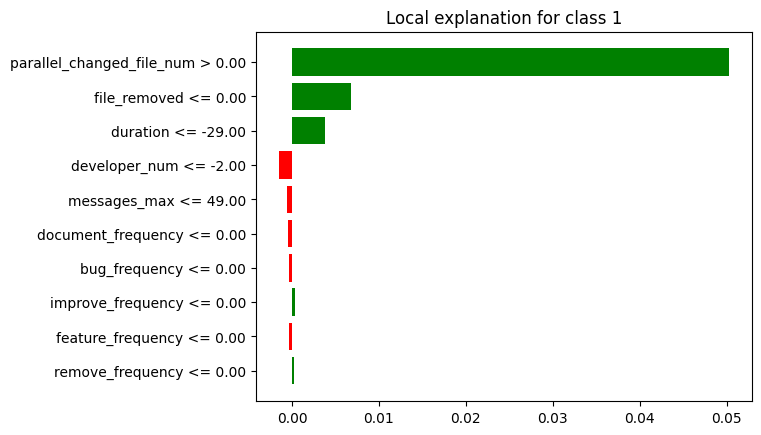

In [ ]:
lime_fp_max.plot()

In [ ]:
breakdown_fp_df_max = breakdown_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_max = breakdown_fp_df_max.drop(index=[0, 26])
breakdown_fp_df_max['sign'] = breakdown_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_max = breakdown_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_max = shap_fp_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_max = shap_fp_df_max.tail(25)
shap_fp_df_max['sign'] = shap_fp_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_max = shap_fp_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_max["Variable"] = lime_fp_df_max["variable"].str.split(" ").str[0]
lime_fp_df_max["Signo"] = lime_fp_df_max["effect"].apply(evaluar_valor)
lime_fp_df_max = lime_fp_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_max = lime_fp_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_max['Ranking'] = breakdown_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_max = breakdown_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_max['Ranking'] = shap_fp_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_max = shap_fp_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_max['Ranking'] = lime_fp_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_max = lime_fp_df_max.head(5)
lime_fp_df_max = lime_fp_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fp_df_max = breakdown_fp_df_max.drop(columns=['contribution'])
shap_fp_df_max = shap_fp_df_max.drop(columns=['contribution'])
lime_fp_df_max = lime_fp_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_max = breakdown_fp_df_max.head(5)
breakdown_fp_df_max = breakdown_fp_df_max.reset_index(drop=True)

shap_fp_df_max = shap_fp_df_max.head(5)
shap_fp_df_max = shap_fp_df_max.reset_index(drop=True)

lime_fp_df_max = lime_fp_df_max.reset_index(drop=True)

print(breakdown_fp_df_max)
print(shap_fp_df_max)
print(lime_fp_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4               messages_max        5  Negativo


In [ ]:
#lime_fp_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_max['Variable'])
shapley_features = list(shap_fp_df_max['Variable'])
lime_features = list(lime_fp_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_max[breakdown_fp_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_max[shap_fp_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_max[lime_fp_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'messages_max']
['parallel_changed_file_num', 'messages_max', 'file_removed', 'fix_frequency', 'duration', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               messages_max         -         -       -         -       5   
2               file_removed         2  Positivo       2  Positivo       2   
3              fix_frequency         -         -      15      Nulo       -   
4                   duration         3  Positivo       3  Positivo       3   
5                 commit_num        15      Nulo       -         -       -   
6              developer_num         4  Negativo       4  Negativo       4   

             
      Signo  
0  Positivo  
1  Negativo  
2  Positivo  
3         -  
4  Positivo  
5         -  
6  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "duration", "developer_num", "messages_max"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
file_removed                      2  Positivo       2  Positivo       2   
duration                          3  Positivo       3  Positivo       3   
developer_num                     4  Negativo       4  Negativo       4   
messages_max                      -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
file_removed               Positivo  
duration                   Positivo  
developer_num              Negativo  
messages_max               Negativo

### **Instancia FP MEDIANA:**

In [ ]:
breakdown_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="break_down",random_state=42)
shap_fp_mediana = exp.predict_parts(df_instancia_fp_mediana, type="shap",random_state=42)
lime_fp_mediana = exp.predict_surrogate(df_instancia_fp_mediana, random_state=42)

breakdown_fp_df_mediana = breakdown_fp_mediana.result
shap_fp_df_mediana = shap_fp_mediana.result
lime_fp_df_mediana=lime_fp_mediana.result

In [ ]:
breakdown_fp_mediana.plot()

In [ ]:
shap_fp_mediana.plot()

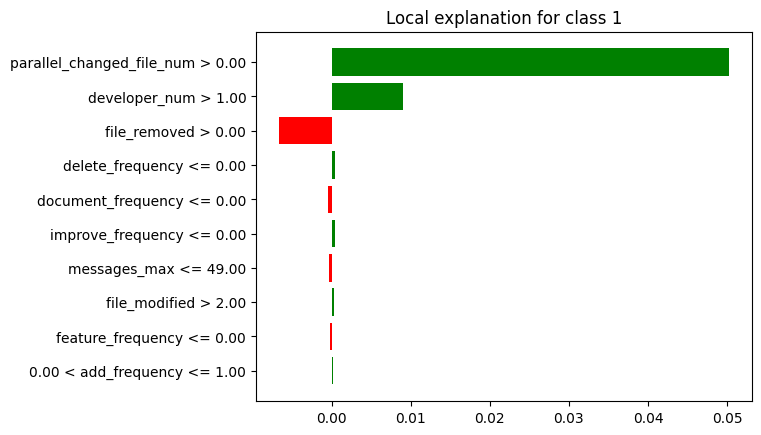

In [ ]:
lime_fp_mediana.plot()

In [ ]:
breakdown_fp_df_mediana = breakdown_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(index=[0, 26])
breakdown_fp_df_mediana['sign'] = breakdown_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_mediana = breakdown_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_mediana = shap_fp_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_mediana = shap_fp_df_mediana.tail(25)
shap_fp_df_mediana['sign'] = shap_fp_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_mediana = shap_fp_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_mediana["Variable"] = lime_fp_df_mediana["variable"].str.split(" ").str[0]
lime_fp_df_mediana["Signo"] = lime_fp_df_mediana["effect"].apply(evaluar_valor)
lime_fp_df_mediana = lime_fp_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_mediana['Ranking'] = breakdown_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_mediana = breakdown_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_mediana['Ranking'] = shap_fp_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_mediana = shap_fp_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_mediana['Ranking'] = lime_fp_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_mediana = lime_fp_df_mediana.head(5)
lime_fp_df_mediana = lime_fp_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fp_df_mediana = breakdown_fp_df_mediana.drop(columns=['contribution'])
shap_fp_df_mediana = shap_fp_df_mediana.drop(columns=['contribution'])
lime_fp_df_mediana = lime_fp_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_mediana = breakdown_fp_df_mediana.head(5)
breakdown_fp_df_mediana = breakdown_fp_df_mediana.reset_index(drop=True)

shap_fp_df_mediana = shap_fp_df_mediana.head(5)
shap_fp_df_mediana = shap_fp_df_mediana.reset_index(drop=True)

lime_fp_df_mediana = lime_fp_df_mediana.reset_index(drop=True)

print(breakdown_fp_df_mediana)
print(shap_fp_df_mediana)
print(lime_fp_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                   duration        3  Positivo
3               file_removed        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2                   duration        3  Positivo
3               file_removed        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1              developer_num        2  Positivo
2               file_removed        3  Negativo
3           delete_frequency        4  Positivo
4         document_frequency        5  Negativo


In [ ]:
#lime_fp_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_mediana['Variable'])
shapley_features = list(shap_fp_df_mediana['Variable'])
lime_features = list(lime_fp_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_mediana[breakdown_fp_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_mediana[shap_fp_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_mediana[lime_fp_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'developer_num', 'duration', 'file_removed', 'commit_num']
['parallel_changed_file_num', 'developer_num', 'duration', 'file_removed', 'fix_frequency']
['parallel_changed_file_num', 'developer_num', 'file_removed', 'delete_frequency', 'document_frequency']
['delete_frequency', 'parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'document_frequency', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0           delete_frequency         -         -       -         -       4   
1  parallel_changed_file_num         1  Positivo       1  Positivo       1   
2               file_removed         4  Negativo       4  Negativo       3   
3              fix_frequency         -         -      15      Nulo       -   
4                   duration         3  Positivo       3  Positivo       -   
5         document_frequency         -         -       -         -       5   
6                 commit_num        15      Nulo       -         -       -   
7              developer_num         2  Positivo       2  Positivo       2   

             
      Signo  
0  Positivo  
1  Positivo  
2  Negativo  
3         -  
4         -  
5  Negativo  
6         -  
7  Positivo

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "developer_num", "duration", "file_removed", "delete_frequency", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
developer_num                     2  Positivo       2  Positivo       2   
duration                          3  Positivo       3  Positivo       -   
file_removed                      4  Negativo       4  Negativo       3   
delete_frequency                  -         -       -         -       4   
document_frequency                -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
developer_num              Positivo  
duration                          -  
file_removed               Negativo  
delete_frequency           Positivo  
document_frequency         Negativo

### **Instancia FP MIN:**

In [ ]:
breakdown_fp_min = exp.predict_parts(df_instancia_fp_min, type="break_down",random_state=42)
shap_fp_min = exp.predict_parts(df_instancia_fp_min, type="shap",random_state=42)
lime_fp_min = exp.predict_surrogate(df_instancia_fp_min, random_state=42)

breakdown_fp_df_min = breakdown_fp_min.result
shap_fp_df_min = shap_fp_min.result
lime_fp_df_min = lime_fp_min.result

In [ ]:
breakdown_fp_min.plot()

In [ ]:
shap_fp_min.plot()

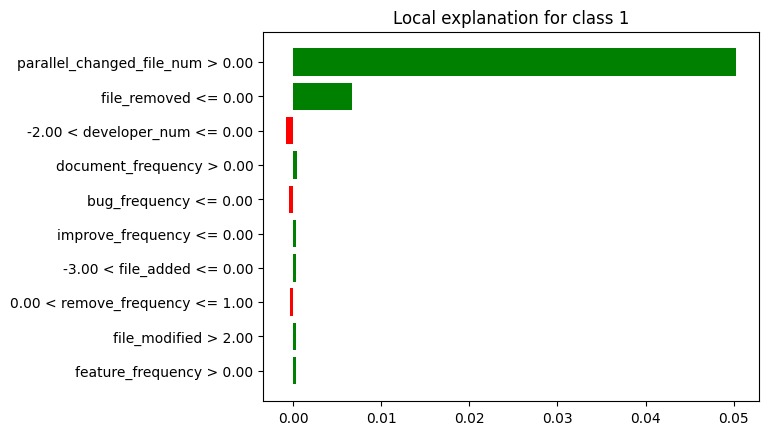

In [ ]:
lime_fp_min.plot()

In [ ]:
breakdown_fp_df_min = breakdown_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fp_df_min = breakdown_fp_df_min.drop(index=[0, 26])
breakdown_fp_df_min['sign'] = breakdown_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fp_df_min = breakdown_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fp_df_min = shap_fp_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fp_df_min = shap_fp_df_min.tail(25)
shap_fp_df_min['sign'] = shap_fp_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fp_df_min = shap_fp_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fp_df_min["Variable"] = lime_fp_df_min["variable"].str.split(" ").str[0]
lime_fp_df_min["Signo"] = lime_fp_df_min["effect"].apply(evaluar_valor)
lime_fp_df_min = lime_fp_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fp_df_min = lime_fp_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fp_df_min['Ranking'] = breakdown_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fp_df_min = breakdown_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fp_df_min['Ranking'] = shap_fp_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fp_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fp_df_min = shap_fp_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fp_df_min['Ranking'] = lime_fp_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fp_df_min = lime_fp_df_min.head(5)
lime_fp_df_min = lime_fp_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fp_df_min = breakdown_fp_df_min.drop(columns=['contribution'])
shap_fp_df_min = shap_fp_df_min.drop(columns=['contribution'])
lime_fp_df_min = lime_fp_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fp_df_min = breakdown_fp_df_min.head(5)
breakdown_fp_df_min = breakdown_fp_df_min.reset_index(drop=True)

shap_fp_df_min = shap_fp_df_min.head(5)
shap_fp_df_min = shap_fp_df_min.reset_index(drop=True)

lime_fp_df_min = lime_fp_df_min.reset_index(drop=True)
lime_fp_df_min.at[2, 'Variable'] = 'developer_num'

print(breakdown_fp_df_min)
print(shap_fp_df_min)
print(lime_fp_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Positivo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1               file_removed        2  Positivo
2              developer_num        3  Negativo
3         document_frequency        4  Positivo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fp_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fp_df_min['Variable'])
shapley_features = list(shap_fp_df_min['Variable'])
lime_features = list(lime_fp_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fp_df_min[breakdown_fp_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fp_df_min[shap_fp_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fp_df_min[lime_fp_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'developer_num', 'document_frequency', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'bug_frequency', 'document_frequency', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         3  Negativo       3  Negativo       2   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         2  Positivo       2  Positivo       -   
4              bug_frequency         -         -       -         -       5   
5         document_frequency         -         -       -         -       4   
6                 commit_num        15      Nulo       -         -       -   
7              developer_num         4  Negativo       4  Negativo       3   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3         -  
4  Negativo  
5  Positivo  
6         -  
7  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "file_removed", "developer_num", "document_frequency", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Positivo       2  Positivo       -   
file_removed                      3  Negativo       3  Negativo       2   
developer_num                     4  Negativo       4  Negativo       3   
document_frequency                -         -       -         -       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                          -  
file_removed               Positivo  
developer_num              Negativo  
document_frequency         Positivo  
bug_frequency              Negativo

### **FP General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4)], 'Shapley': [('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('developer_num', 2), ('duration', 3), ('file_removed', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('messages_max', 5), ('parallel_changed_file_num', 1), ('developer_num', 2), ('file_removed', 3), ('delete_frequency', 4), ('document_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 3), ('document_frequency', 4), ('bug_frequency', 5)]}
{'Breakdown': {'parallel_ch

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fp = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                  3.333333      3      3.333333      3   
document_frequency                    -      -             -      -   
bug_frequency                         -      -             -      -   
duration                       2.666667      3      2.666667      3   
file_removed                        3.0      3           3.0      3   
messages_max                          -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
delete_frequency                      -      -             -      -   

                                   Lime         
                          Ranking Medio Conteo  
developer_num                  3.000000      3  
document_frequency             4.500000      2  
bug_frequency                  5.000000      1  
duration                       3.000000      1  
file_removed                   2.333333      3  
messages_max                   5.000000      1  
parallel_changed_file_num      1.000000      3  
delete_frequency               4.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fp[("General", "Conteo Total")] = df_resumen_rus_fp[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                  3.333333      3      3.333333      3   
document_frequency                    -      -             -      -   
bug_frequency                         -      -             -      -   
duration                       2.666667      3      2.666667      3   
file_removed                        3.0      3           3.0      3   
messages_max                          -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
delete_frequency                      -      -             -      -   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
developer_num                  3.000000      3  3.222222            9  
document_frequency             4.500000      2  4.500000            2  
bug_frequency                  5.000000      1  5.000000            1  
duration                       3.000000      1  2.777778            7  
file_removed                   2.333333      3  2.777778            9  
messages_max                   5.000000      1  5.000000            1  
parallel_changed_file_num      1.000000      3  1.000000            9  
delete_frequency               4.000000      1  4.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fp.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fp[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fp[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fp[("General", "Peso Conteo")] = df_resumen_rus_fp[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fp[("General", "Puntaje")] = df_resumen_rus_fp[("General", "Peso Rango")] + df_resumen_rus_fp[("General", "Peso Conteo")]
df_resumen_rus_fp[("General", "Ranking")] = df_resumen_rus_fp[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fp.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fp.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fp

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                  3.333333      3      3.333333      3   
document_frequency                    -      -             -      -   
bug_frequency                         -      -             -      -   
duration                       2.666667      3      2.666667      3   
file_removed                        3.0      3           3.0      3   
messages_max                          -      -             -      -   
parallel_changed_file_num           1.0      3           1.0      3   
delete_frequency                      -      -             -      -   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
developer_num                  3.000000      3     3.0            9  
document_frequency             4.500000      2     5.0            2  
bug_frequency                  5.000000      1     7.0            1  
duration                       3.000000      1     3.0            7  
file_removed                   2.333333      3     2.0            9  
messages_max                   5.000000      1     7.0            1  
parallel_changed_file_num      1.000000      3     1.0            9  
delete_frequency               4.000000      1     6.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fp.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fp = df_resumen_rus_fp[new_columns]

In [ ]:
df_resumen_rus_fp.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fp[(tech, "Ranking Medio")] = df_resumen_rus_fp[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fp

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            9          3.00      3   
developer_num                 3.0            9          3.33      3   
duration                      3.0            7          2.67      3   
document_frequency            5.0            2             -      -   
delete_frequency              6.0            1             -      -   
bug_frequency                 7.0            1             -      -   
messages_max                  7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                       3.00      3          2.33      3  
developer_num                      3.33      3          3.00      3  
duration                           2.67      3          3.00      1  
document_frequency                    -      -          4.50      2  
delete_frequency                      -      -          4.00      1  
bug_frequency                         -      -          5.00      1  
messages_max                          -      -          5.00      1

### **Instancia FN MAX:**

In [ ]:
breakdown_fn_max = exp.predict_parts(df_instancia_fn_max, type="break_down",random_state=42)
shap_fn_max = exp.predict_parts(df_instancia_fn_max, type="shap",random_state=42)
lime_fn_max = exp.predict_surrogate(df_instancia_fn_max, random_state=42)

breakdown_fn_df_max = breakdown_fn_max.result
shap_fn_df_max = shap_fn_max.result
lime_fn_df_max=lime_fn_max.result

In [ ]:
breakdown_fn_max.plot()

In [ ]:
shap_fn_max.plot()

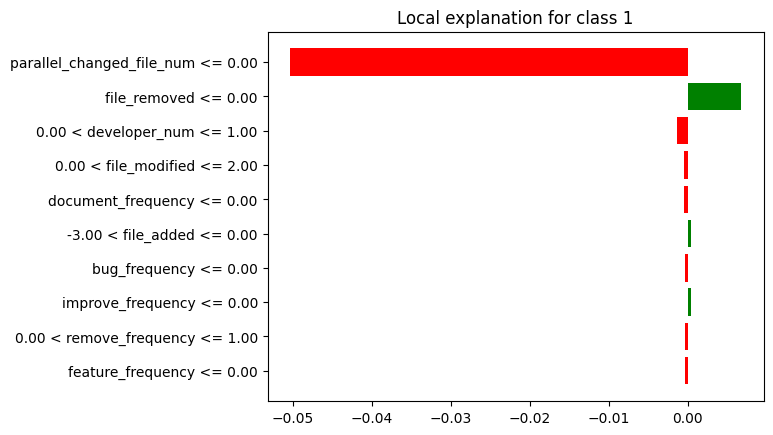

In [ ]:
lime_fn_max.plot()

In [ ]:
breakdown_fn_df_max = breakdown_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_max = breakdown_fn_df_max.drop(index=[0, 26])
breakdown_fn_df_max['sign'] = breakdown_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_max = breakdown_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_max = shap_fn_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_max = shap_fn_df_max.tail(25)
shap_fn_df_max['sign'] = shap_fn_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_max = shap_fn_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_max["Variable"] = lime_fn_df_max["variable"].str.split(" ").str[0]
lime_fn_df_max["Signo"] = lime_fn_df_max["effect"].apply(evaluar_valor)
lime_fn_df_max = lime_fn_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_max = lime_fn_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_max['Ranking'] = breakdown_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_max = breakdown_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_max['Ranking'] = shap_fn_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_max = shap_fn_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_max['Ranking'] = lime_fn_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_max = lime_fn_df_max.head(5)
lime_fn_df_max = lime_fn_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimaxo la columna de la contribucion
breakdown_fn_df_max = breakdown_fn_df_max.drop(columns=['contribution'])
shap_fn_df_max = shap_fn_df_max.drop(columns=['contribution'])
lime_fn_df_max = lime_fn_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_max = breakdown_fn_df_max.head(5)
breakdown_fn_df_max = breakdown_fn_df_max.reset_index(drop=True)

shap_fn_df_max = shap_fn_df_max.head(5)
shap_fn_df_max = shap_fn_df_max.reset_index(drop=True)

lime_fn_df_max = lime_fn_df_max.reset_index(drop=True)
lime_fn_df_max.at[2, 'Variable'] = 'developer_num'
lime_fn_df_max.at[3, 'Variable'] = 'file_modified'

print(breakdown_fn_df_max)
print(shap_fn_df_max)
print(lime_fn_df_max)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4          feature_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2              developer_num        3  Negativo
3              file_modified        4  Negativo
4         document_frequency        5  Negativo


In [ ]:
#lime_fn_max.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_max['Variable'])
shapley_features = list(shap_fn_df_max['Variable'])
lime_features = list(lime_fn_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_max[breakdown_fn_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_max[shap_fn_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_max[lime_fn_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'feature_frequency']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'developer_num', 'file_modified', 'document_frequency']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'file_modified', 'feature_frequency', 'document_frequency', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         3  Negativo       3  Negativo       2   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         2  Negativo       2  Negativo       -   
4              file_modified         -         -       -         -       4   
5          feature_frequency        15      Nulo       -         -       -   
6         document_frequency         -         -       -         -       5   
7              developer_num         4  Negativo       4  Negativo       3   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3         -  
4  Negativo  
5         -  
6  Negativo  
7  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "file_removed", "developer_num", "file_modified", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
duration                          2  Negativo       2  Negativo       -   
file_removed                      3  Negativo       3  Negativo       2   
developer_num                     4  Negativo       4  Negativo       3   
file_modified                     -         -       -         -       4   
document_frequency                -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
duration                          -  
file_removed               Positivo  
developer_num              Negativo  
file_modified              Negativo  
document_frequency         Negativo

### **Instancia FN MEDIANA:**

In [ ]:
breakdown_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="break_down",random_state=42)
shap_fn_mediana = exp.predict_parts(df_instancia_fn_mediana, type="shap",random_state=42)
lime_fn_mediana = exp.predict_surrogate(df_instancia_fn_mediana, random_state=42)

breakdown_fn_df_mediana = breakdown_fn_mediana.result
shap_fn_df_mediana = shap_fn_mediana.result
lime_fn_df_mediana=lime_fn_mediana.result

In [ ]:
breakdown_fn_mediana.plot()

In [ ]:
shap_fn_mediana.plot()

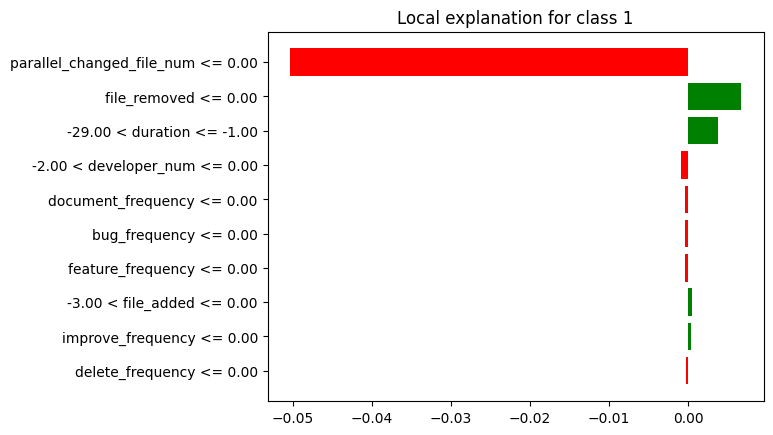

In [ ]:
lime_fn_mediana.plot()

In [ ]:
breakdown_fn_df_mediana = breakdown_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(index=[0, 26])
breakdown_fn_df_mediana['sign'] = breakdown_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_mediana = breakdown_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_mediana = shap_fn_df_mediana.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_mediana = shap_fn_df_mediana.tail(25)
shap_fn_df_mediana['sign'] = shap_fn_df_mediana['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_mediana = shap_fn_df_mediana.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_mediana["Variable"] = lime_fn_df_mediana["variable"].str.split(" ").str[0]
lime_fn_df_mediana["Signo"] = lime_fn_df_mediana["effect"].apply(evaluar_valor)
lime_fn_df_mediana = lime_fn_df_mediana.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_mediana['Ranking'] = breakdown_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_mediana = breakdown_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_mediana['Ranking'] = shap_fn_df_mediana['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_mediana.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_mediana = shap_fn_df_mediana[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_mediana['Ranking'] = lime_fn_df_mediana['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_mediana = lime_fn_df_mediana.head(5)
lime_fn_df_mediana = lime_fn_df_mediana[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimedianao la columna de la contribucion
breakdown_fn_df_mediana = breakdown_fn_df_mediana.drop(columns=['contribution'])
shap_fn_df_mediana = shap_fn_df_mediana.drop(columns=['contribution'])
lime_fn_df_mediana = lime_fn_df_mediana.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_mediana = breakdown_fn_df_mediana.head(5)
breakdown_fn_df_mediana = breakdown_fn_df_mediana.reset_index(drop=True)

shap_fn_df_mediana = shap_fn_df_mediana.head(5)
shap_fn_df_mediana = shap_fn_df_mediana.reset_index(drop=True)

lime_fn_df_mediana = lime_fn_df_mediana.reset_index(drop=True)
lime_fn_df_mediana.at[2, 'Variable'] = 'duration'
lime_fn_df_mediana.at[3, 'Variable'] = 'developer_num'


print(breakdown_fn_df_mediana)
print(shap_fn_df_mediana)
print(lime_fn_df_mediana)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4            messages_median       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Negativo
1               file_removed        2  Positivo
2                   duration        3  Positivo
3              developer_num        4  Negativo
4         document_frequency        5  Negativo


In [ ]:
#lime_fn_mediana.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_mediana['Variable'])
shapley_features = list(shap_fn_df_mediana['Variable'])
lime_features = list(lime_fn_df_mediana['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_mediana = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_mediana['Variable'] = list(all_features)
df_final_mediana= df_final_mediana[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_mediana['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_mediana[breakdown_fn_df_mediana['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_mediana[shap_fn_df_mediana['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_mediana[lime_fn_df_mediana['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_mediana.loc[df_final_mediana['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_mediana

['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'messages_median']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'file_removed', 'duration', 'developer_num', 'document_frequency']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'document_frequency', 'developer_num', 'messages_median']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Negativo       1  Negativo       1   
1               file_removed         2  Positivo       2  Positivo       2   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         3  Positivo       3  Positivo       3   
4         document_frequency         -         -       -         -       5   
5              developer_num         4  Negativo       4  Negativo       4   
6            messages_median        15      Nulo       -         -       -   

             
      Signo  
0  Negativo  
1  Positivo  
2         -  
3  Positivo  
4  Negativo  
5  Negativo  
6         -

In [ ]:
df_final_mediana.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "file_removed", "duration", "developer_num", "document_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_mediana = df_final_mediana.reindex(nuevo_orden)

df_final_mediana

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Negativo       1  Negativo       1   
file_removed                      2  Positivo       2  Positivo       2   
duration                          3  Positivo       3  Positivo       3   
developer_num                     4  Negativo       4  Negativo       4   
document_frequency                -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Negativo  
file_removed               Positivo  
duration                   Positivo  
developer_num              Negativo  
document_frequency         Negativo

### **Instancia FN MIN:**

In [ ]:
breakdown_fn_min = exp.predict_parts(df_instancia_fn_min, type="break_down",random_state=42)
shap_fn_min = exp.predict_parts(df_instancia_fn_min, type="shap",random_state=42)
lime_fn_min = exp.predict_surrogate(df_instancia_fn_min, random_state=42)

breakdown_fn_df_min = breakdown_fn_min.result
shap_fn_df_min = shap_fn_min.result
lime_fn_df_min = lime_fn_min.result

In [ ]:
breakdown_fn_min.plot()

In [ ]:
shap_fn_min.plot()

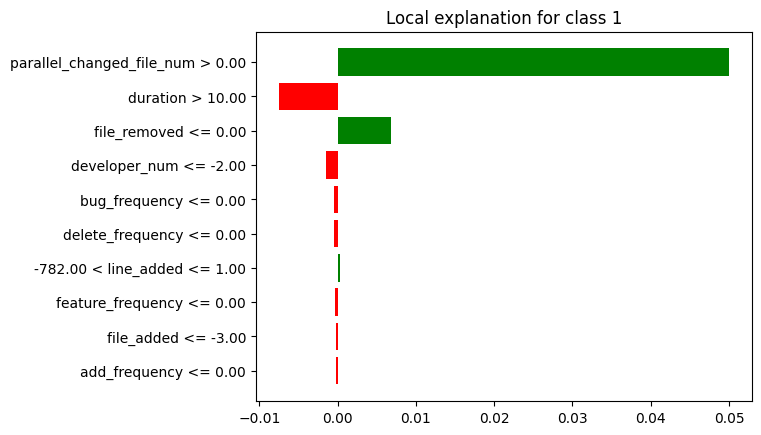

In [ ]:
lime_fn_min.plot()

In [ ]:
breakdown_fn_df_min = breakdown_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_fn_df_min = breakdown_fn_df_min.drop(index=[0, 26])
breakdown_fn_df_min['sign'] = breakdown_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_fn_df_min = breakdown_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_fn_df_min = shap_fn_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_fn_df_min = shap_fn_df_min.tail(25)
shap_fn_df_min['sign'] = shap_fn_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_fn_df_min = shap_fn_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_fn_df_min["Variable"] = lime_fn_df_min["variable"].str.split(" ").str[0]
lime_fn_df_min["Signo"] = lime_fn_df_min["effect"].apply(evaluar_valor)
lime_fn_df_min = lime_fn_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_fn_df_min = lime_fn_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_fn_df_min['Ranking'] = breakdown_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_fn_df_min = breakdown_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_fn_df_min['Ranking'] = shap_fn_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_fn_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_fn_df_min = shap_fn_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_fn_df_min['Ranking'] = lime_fn_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_fn_df_min = lime_fn_df_min.head(5)
lime_fn_df_min = lime_fn_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_fn_df_min = breakdown_fn_df_min.drop(columns=['contribution'])
shap_fn_df_min = shap_fn_df_min.drop(columns=['contribution'])
lime_fn_df_min = lime_fn_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_fn_df_min = breakdown_fn_df_min.head(5)
breakdown_fn_df_min = breakdown_fn_df_min.reset_index(drop=True)

shap_fn_df_min = shap_fn_df_min.head(5)
shap_fn_df_min = shap_fn_df_min.reset_index(drop=True)

lime_fn_df_min = lime_fn_df_min.reset_index(drop=True)

print(breakdown_fn_df_min)
print(shap_fn_df_min)
print(lime_fn_df_min)

                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4                 commit_num       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2               file_removed        3  Negativo
3              developer_num        4  Negativo
4              fix_frequency       15      Nulo
                    Variable  Ranking     Signo
0  parallel_changed_file_num        1  Positivo
1                   duration        2  Negativo
2               file_removed        3  Positivo
3              developer_num        4  Negativo
4              bug_frequency        5  Negativo


In [ ]:
#lime_fn_min.show_in_notebook()

In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_fn_df_min['Variable'])
shapley_features = list(shap_fn_df_min['Variable'])
lime_features = list(lime_fn_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_fn_df_min[breakdown_fn_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_fn_df_min[shap_fn_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_fn_df_min[lime_fn_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'commit_num']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'fix_frequency']
['parallel_changed_file_num', 'duration', 'file_removed', 'developer_num', 'bug_frequency']
['parallel_changed_file_num', 'file_removed', 'fix_frequency', 'duration', 'bug_frequency', 'commit_num', 'developer_num']


Variable Breakdown           Shapley              Lime  \
                               Ranking     Signo Ranking     Signo Ranking   
0  parallel_changed_file_num         1  Positivo       1  Positivo       1   
1               file_removed         3  Negativo       3  Negativo       3   
2              fix_frequency         -         -      15      Nulo       -   
3                   duration         2  Negativo       2  Negativo       2   
4              bug_frequency         -         -       -         -       5   
5                 commit_num        15      Nulo       -         -       -   
6              developer_num         4  Negativo       4  Negativo       4   

             
      Signo  
0  Positivo  
1  Positivo  
2         -  
3  Negativo  
4  Negativo  
5         -  
6  Negativo

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["parallel_changed_file_num", "duration", "file_removed", "developer_num", "bug_frequency"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime  \
                            Ranking     Signo Ranking     Signo Ranking   
Variable                                                                  
parallel_changed_file_num         1  Positivo       1  Positivo       1   
duration                          2  Negativo       2  Negativo       2   
file_removed                      3  Negativo       3  Negativo       3   
developer_num                     4  Negativo       4  Negativo       4   
bug_frequency                     -         -       -         -       5   

                                     
                              Signo  
Variable                             
parallel_changed_file_num  Positivo  
duration                   Negativo  
file_removed               Positivo  
developer_num              Negativo  
bug_frequency              Negativo

### **FN General:**

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_mediana.index:
        ranking = df_final_mediana[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4)], 'Shapley': [('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4)], 'Lime': [('parallel_changed_file_num', 1), ('file_removed', 2), ('developer_num', 3), ('file_modified', 4), ('document_frequency', 5), ('parallel_changed_file_num', 1), ('file_removed', 2), ('duration', 3), ('developer_num', 4), ('document_frequency', 5), ('parallel_changed_file_num', 1), ('duration', 2), ('file_removed', 3), ('developer_num', 4), ('bug_frequency', 5)]}
{'Breakdown': {'parallel_changed_f

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rus_fn = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                       4.0      3           4.0      3   
document_frequency                    -      -             -      -   
file_modified                         -      -             -      -   
bug_frequency                         -      -             -      -   
duration                       2.333333      3      2.333333      3   
file_removed                   2.666667      3      2.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime         
                          Ranking Medio Conteo  
developer_num                  3.666667      3  
document_frequency             5.000000      2  
file_modified                  4.000000      1  
bug_frequency                  5.000000      1  
duration                       2.500000      2  
file_removed                   2.333333      3  
parallel_changed_file_num      1.000000      3

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rus_fn[("General", "Conteo Total")] = df_resumen_rus_fn[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                       4.0      3           4.0      3   
document_frequency                    -      -             -      -   
file_modified                         -      -             -      -   
bug_frequency                         -      -             -      -   
duration                       2.333333      3      2.333333      3   
file_removed                   2.666667      3      2.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime          General               
                          Ranking Medio Conteo   Ranking Conteo Total  
developer_num                  3.666667      3  3.888889            9  
document_frequency             5.000000      2  5.000000            2  
file_modified                  4.000000      1  4.000000            1  
bug_frequency                  5.000000      1  5.000000            1  
duration                       2.500000      2  2.388889            8  
file_removed                   2.333333      3  2.555556            9  
parallel_changed_file_num      1.000000      3  1.000000            9

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rus_fn.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rus_fn[("General", "Peso Rango")] = 1 - ((df_resumen_rus_fn[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rus_fn[("General", "Peso Conteo")] = df_resumen_rus_fn[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rus_fn[("General", "Puntaje")] = df_resumen_rus_fn[("General", "Peso Rango")] + df_resumen_rus_fn[("General", "Peso Conteo")]
df_resumen_rus_fn[("General", "Ranking")] = df_resumen_rus_fn[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rus_fn.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rus_fn.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rus_fn

Breakdown              Shapley         \
                          Ranking Medio Conteo Ranking Medio Conteo   
developer_num                       4.0      3           4.0      3   
document_frequency                    -      -             -      -   
file_modified                         -      -             -      -   
bug_frequency                         -      -             -      -   
duration                       2.333333      3      2.333333      3   
file_removed                   2.666667      3      2.666667      3   
parallel_changed_file_num           1.0      3           1.0      3   

                                   Lime        General               
                          Ranking Medio Conteo Ranking Conteo Total  
developer_num                  3.666667      3     4.0            9  
document_frequency             5.000000      2     6.0            2  
file_modified                  4.000000      1     5.0            1  
bug_frequency                  5.000000      1     7.0            1  
duration                       2.500000      2     3.0            8  
file_removed                   2.333333      3     2.0            9  
parallel_changed_file_num      1.000000      3     1.0            9

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rus_fn.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rus_fn = df_resumen_rus_fn[new_columns]

In [ ]:
df_resumen_rus_fn.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rus_fn[(tech, "Ranking Medio")] = df_resumen_rus_fn[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rus_fn

General                  Breakdown         \
                          Ranking Conteo Total Ranking Medio Conteo   
parallel_changed_file_num     1.0            9          1.00      3   
file_removed                  2.0            9          2.67      3   
duration                      3.0            8          2.33      3   
developer_num                 4.0            9          4.00      3   
file_modified                 5.0            1             -      -   
document_frequency            6.0            2             -      -   
bug_frequency                 7.0            1             -      -   

                                Shapley                 Lime         
                          Ranking Medio Conteo Ranking Medio Conteo  
parallel_changed_file_num          1.00      3          1.00      3  
file_removed                       2.67      3          2.33      3  
duration                           2.33      3          2.50      2  
developer_num                      4.00      3          3.67      3  
file_modified                         -      -          4.00      1  
document_frequency                    -      -          5.00      2  
bug_frequency                         -      -          5.00      1

## **LOCAL GENERAL:**

Verdadero Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vp, df_resumen_brf_vp, df_resumen_gb_vp, df_resumen_ada_vp, df_resumen_rus_vp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,8,2,8,3,5,3,8,-,-,2,29
line_removed,3,5,4,4,2,9,2,8,-,-,3,26
developer_num,6,6,7,5,6,6,4,8,3,9,4,34
duration,4,4,6,3,4,4,5,6,4,8,5,25
bug_frequency,4,4,3,2,-,-,-,-,6,1,6,7
commit_density,6,2,5,3,-,-,-,-,-,-,7,5
file_removed,10,2,10,4,8,1,6,3,2,9,8,19
file_modified,9,2,11,3,5,4,-,-,-,-,9,9
improve_frequency,6,1,8,1,-,-,-,-,6,1,10,3


Verdadero Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_vn, df_resumen_brf_vn, df_resumen_gb_vn, df_resumen_ada_vn, df_resumen_rus_vn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
developer_num,2,9,4,6,2,8,3,9,3,9,2,41
duration,4,6,2,6,3,9,2,9,3,8,3,38
commit_num,3,6,3,6,6,3,4,7,-,-,4,22
file_removed,8,2,5,7,-,-,7,5,2,9,5,23
line_removed,5,7,6,4,4,6,-,-,-,-,6,17
file_modified,6,5,7,2,-,-,5,3,-,-,7,10
file_added,-,-,-,-,6,4,-,-,6,1,8,5
document_frequency,-,-,-,-,-,-,-,-,5,1,9,1
line_added,7,1,9,1,8,2,6,3,-,-,10,7


Falso Positivo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fp, df_resumen_brf_fp, df_resumen_gb_fp, df_resumen_ada_fp, df_resumen_rus_fp]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
commit_num,2,7,2,6,5,5,2,8,-,-,2,26
developer_num,4,6,3,5,2,7,3,8,3,9,2,35
line_removed,3,9,4,4,4,4,8,3,-,-,4,20
duration,7,3,8,1,2,5,7,4,3,7,5,20
file_modified,5,4,7,6,6,2,5,2,-,-,6,14
file_removed,8,1,9,5,9,2,6,6,2,9,7,23
line_added,6,3,10,3,-,-,4,5,-,-,8,11
document_frequency,-,-,-,-,8,2,-,-,5,2,9,4
feature_frequency,-,-,5,2,-,-,-,-,-,-,9,2


Falso Negativo:

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_rf_fn, df_resumen_brf_fn, df_resumen_gb_fn, df_resumen_ada_fn, df_resumen_rus_fn]
algorithms = ["RandomForest", "BalancedRandomForest", "GradientBoosting", "ADABoost", "RUSBoost"]

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(RandomForest, Ranking)","(RandomForest, Conteo Total)","(BalancedRandomForest, Ranking)","(BalancedRandomForest, Conteo Total)","(GradientBoosting, Ranking)","(GradientBoosting, Conteo Total)","(ADABoost, Ranking)","(ADABoost, Conteo Total)","(RUSBoost, Ranking)","(RUSBoost, Conteo Total)",Ranking Final,Conteo Final
parallel_changed_file_num,1,9,1,9,1,9,1,9,1,9,1,45
developer_num,2,8,3,8,2,9,4,8,4,9,2,42
commit_num,3,5,2,7,5,6,3,7,-,-,3,25
file_removed,4,3,4,7,6,2,5,8,2,9,3,29
duration,5,5,8,3,7,3,2,9,3,8,5,28
line_removed,6,6,7,5,3,6,7,1,-,-,6,18
messages_max,-,-,-,-,4,2,-,-,-,-,7,2
file_modified,8,2,5,1,7,2,6,3,5,1,8,9
file_added,7,2,6,3,7,4,-,-,-,-,9,9
document_frequency,-,-,-,-,-,-,-,-,6,2,10,2


# **Resultados:**

**RENDIMIENTO MODELOS:**

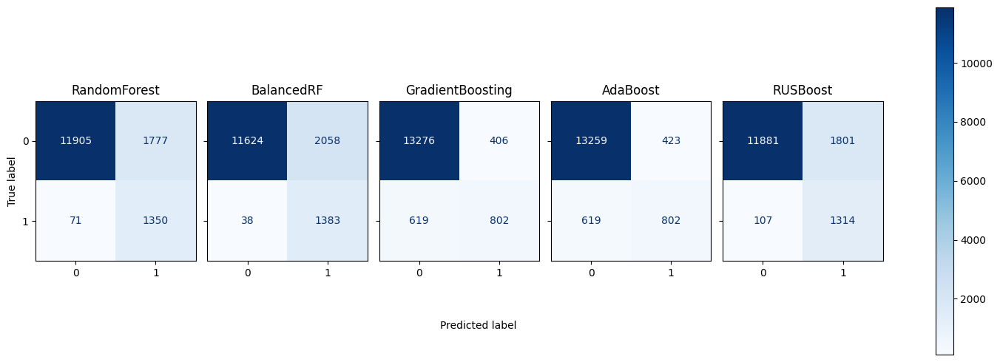

In [ ]:
classifiers = ["RandomForest", "BalancedRF", "GradientBoosting", "AdaBoost", "RUSBoost"]
matrices_confusion = [cm_rf, cm_brf, cm_gb, cm_ada, cm_rus]
class_names = ["0", "1"]

fig, axes = plt.subplots(1, 5, figsize=(15, 5), sharey="row")

for i, (cm, classifier_name) in enumerate(zip(matrices_confusion, classifiers)):

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

    disp.plot(ax=axes[i], cmap="Blues")
    axes[i].set_title(classifier_name)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')

plt.tight_layout()
fig.text(0.4, 0.1, "Predicted label", ha="left")
fig.colorbar(disp.im_, ax=axes)
plt.show()

In [ ]:
score_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.877816,0.432895,0.961580,0.596993
1,BalancedRF,0.864288,0.407768,0.976568,0.575292
2,GradientBoosting,0.933892,0.679043,0.564707,0.616413
3,AdaBoost,0.933018,0.672321,0.563853,0.613053
4,RUSBoost,0.870446,0.418984,0.962000,0.583376


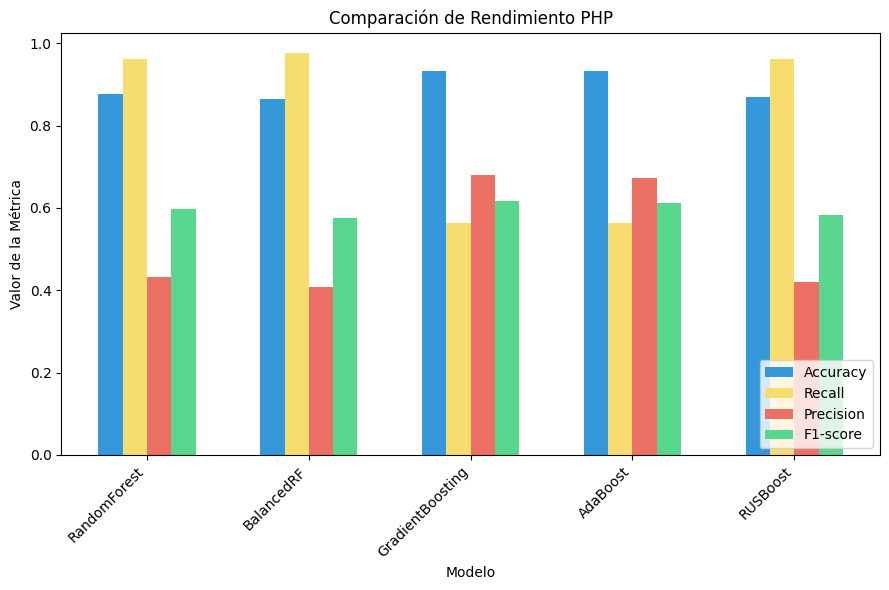

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento PHP')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

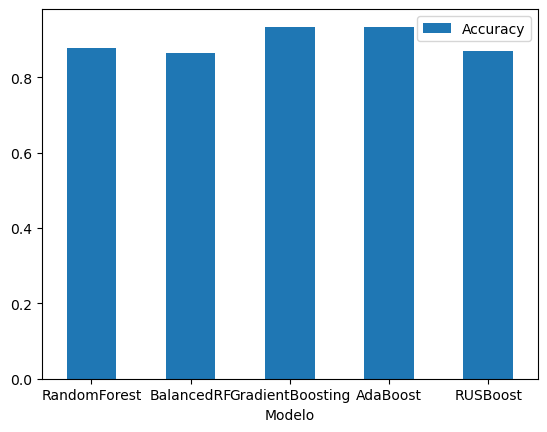

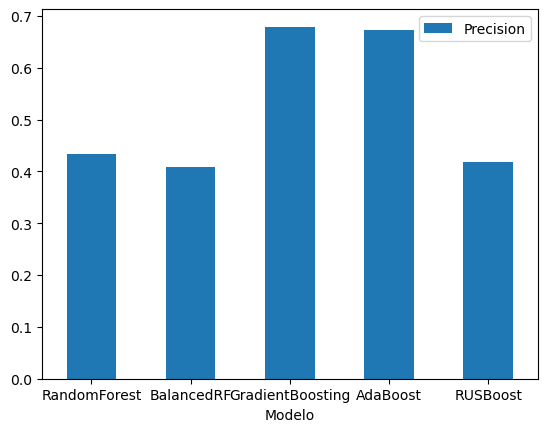

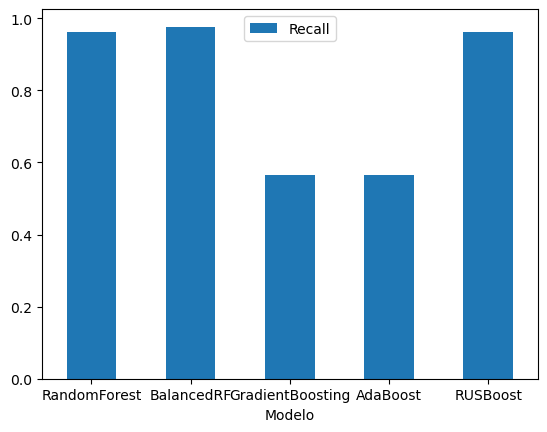

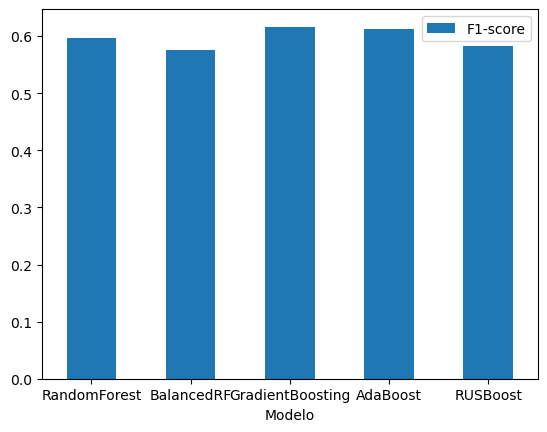

In [ ]:
variables=list(score_result)
variables.pop(0)

for var in variables:
  score_result.plot.bar(x='Modelo', y=var, rot=0)

**RENDIMIENTO INVERSO:**

In [ ]:
score_inv_result

,Modelo,Accuracy,Precision,Recall,F1-score
0,RandomForest,0.877640,0.994071,0.870121,0.927976
1,BalancedRF,0.861220,0.996742,0.849583,0.917298
2,GradientBoost,0.932133,0.955452,0.970326,0.962831
3,AdaBoost,0.931007,0.955397,0.969083,0.962192
4,RUSBoost,0.873667,0.991074,0.868367,0.925672


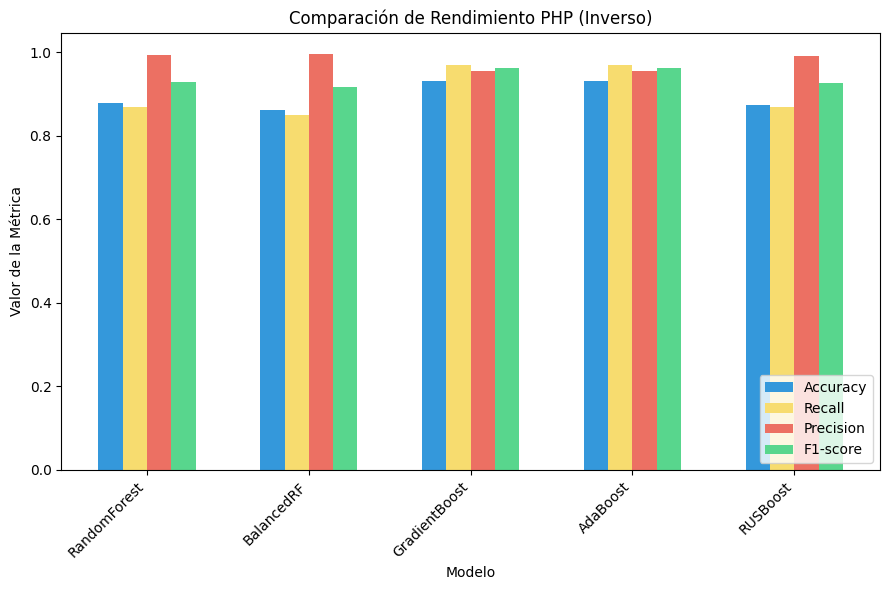

In [ ]:
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D']

num_modelos = len(score_inv_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_inv_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento PHP (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

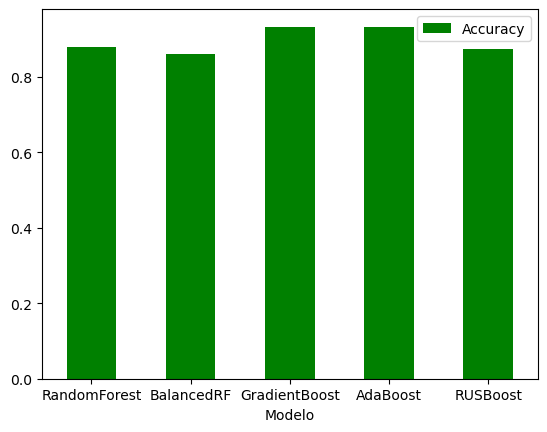

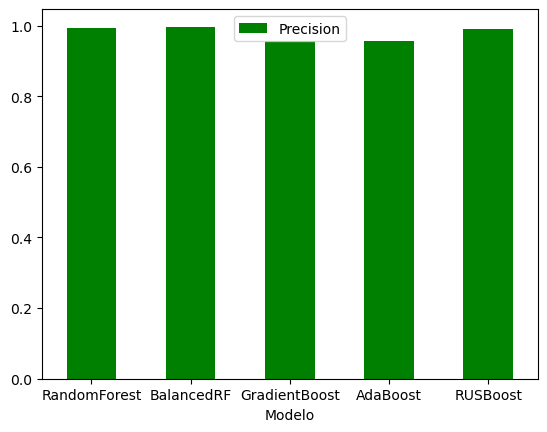

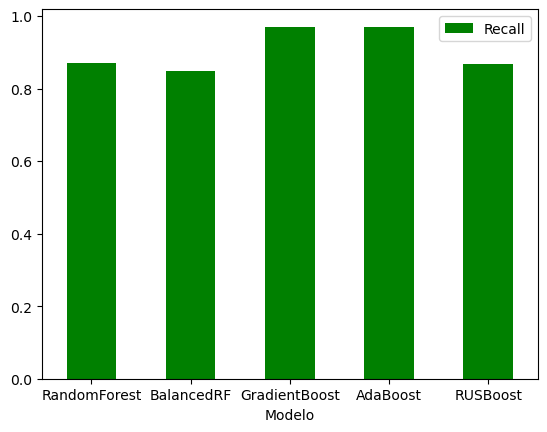

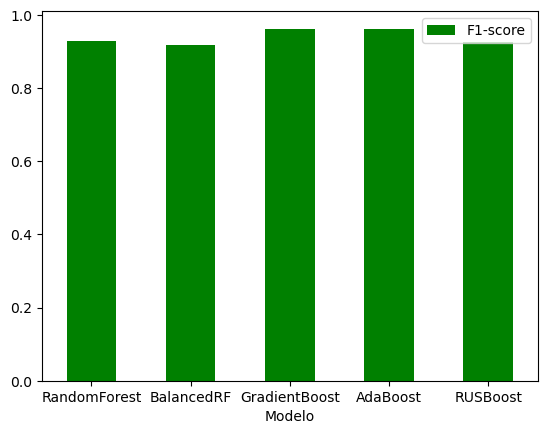

In [ ]:
variables_inv=list(score_inv_result)
variables_inv.pop(0)

for var in variables_inv:
  score_inv_result.plot.bar(x='Modelo', y=var, rot=0, color='green')

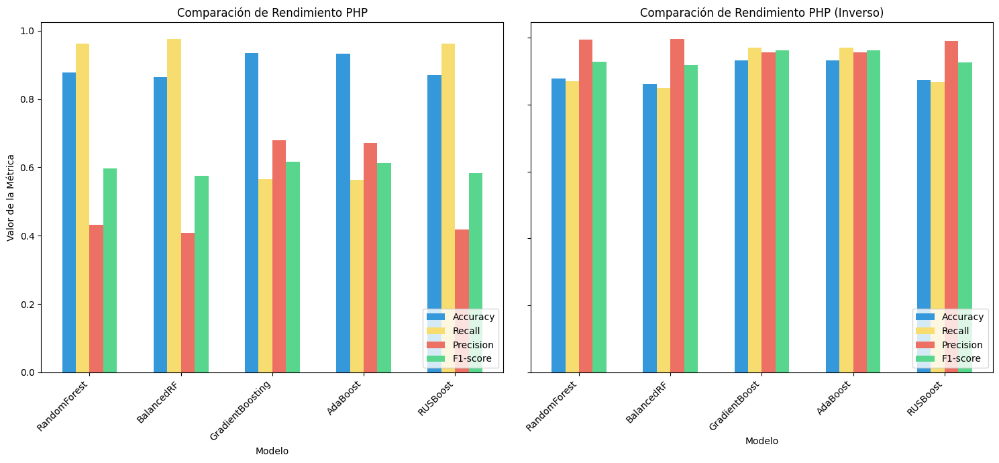

In [ ]:
# Código para la primera gráfica (score_result)
metricas = ['Accuracy', 'Recall', 'Precision', 'F1-score']
colores = ['#3498DB', '#F7DC6F', '#EC7063', '#58D68D']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

# Crear una figura con dos subplots, uno a la izquierda y otro a la derecha
plt.figure(figsize=(15, 7))

# Subplot izquierdo para la primera gráfica (score_result)
plt.subplot(1, 2, 1)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento PHP')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Subplot derecho para la segunda gráfica (score_inv_result)
plt.subplot(1, 2, 2)

for i, metrica in enumerate(metricas):
    posiciones_x = [pos + i * ancho_barra for pos in x]
    valores_metrica = score_inv_result[metrica]
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

plt.xlabel('Modelo')
plt.title('Comparación de Rendimiento PHP (Inverso)')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_inv_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')
plt.tick_params(labelleft = False)


# Ajustar los subplots para evitar superposiciones
plt.tight_layout()

# Mostrar la figura combinada
plt.show()
